# Preamble

## Packages and functions

In [1]:
import numpy as np
import pandas as pd

import phik

import matplotlib.pyplot as plt
import seaborn as sns

import missingno as msno

import gc

# Personal functions

In [2]:
from utils.visualization import *
from utils.feature_engineering import *

# Global data import

# Home Credit columns description

## Data import

In [5]:
HomeCredit_columns_description = reduce_memory_usage(
    pd.read_csv(
        'data/HomeCredit_columns_description.csv',
        encoding='latin_1',
        index_col=0
    ),
    verbose=True
)

Initial memory usage of the dataframe: 0.01 MB
Final memory usage, after optimization: 0.01 MB
Decreased by 0.00%


## Data overview

In [6]:
HomeCredit_columns_description.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 219 entries, 1 to 221
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Table        219 non-null    object
 1   Row          219 non-null    object
 2   Description  219 non-null    object
 3   Special      86 non-null     object
dtypes: object(4)
memory usage: 8.6+ KB


In [7]:
HomeCredit_columns_description.head()

,Table,Row,Description,Special
1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN


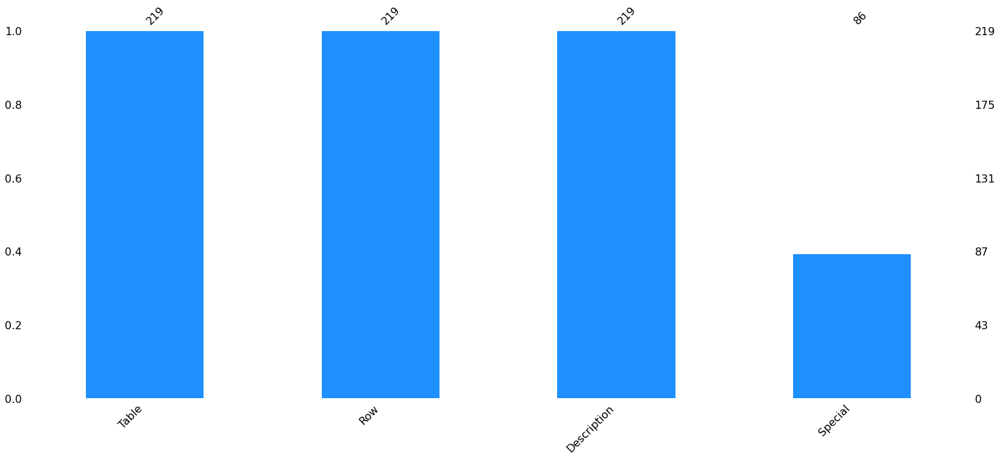

In [12]:
msno.bar(HomeCredit_columns_description, color='dodgerblue');

In [23]:
HomeCredit_columns_description

,Table,Row,Description,Special
1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
...,...,...,...,...
217,installments_payments.csv,NUM_INSTALMENT_NUMBER,On which installment we observe payment,NaN
218,installments_payments.csv,DAYS_INSTALMENT,When the installment of previous credit was su...,time only relative to the application
219,installments_payments.csv,DAYS_ENTRY_PAYMENT,When was the installments of previous credit p...,time only relative to the application
220,installments_payments.csv,AMT_INSTALMENT,What was the prescribed installment amount of ...,NaN


# Application

## Data import

In [9]:
application_train = reduce_memory_usage(
    pd.read_csv(
        'data/application_train.csv'
    ),    
    floating=False,
    verbose=True
)

Initial memory usage of the dataframe: 286.23 MB
Final memory usage, after optimization: 204.41 MB
Decreased by 28.59%


In [9]:
application_test = reduce_memory_usage(
    pd.read_csv(
        'data/application_test.csv'
    ),
    floating=False,
    verbose=True
)

Initial memory usage of the dataframe: 45.00 MB
Final memory usage, after optimization: 32.35 MB
Decreased by 28.10%


## Train data overview

In [ ]:
application_train.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   SK_ID_CURR                    int32  
 1   TARGET                        int8   
 2   NAME_CONTRACT_TYPE            object 
 3   CODE_GENDER                   object 
 4   FLAG_OWN_CAR                  object 
 5   FLAG_OWN_REALTY               object 
 6   CNT_CHILDREN                  int8   
 7   AMT_INCOME_TOTAL              float64
 8   AMT_CREDIT                    float64
 9   AMT_ANNUITY                   float64
 10  AMT_GOODS_PRICE               float64
 11  NAME_TYPE_SUITE               object 
 12  NAME_INCOME_TYPE              object 
 13  NAME_EDUCATION_TYPE           object 
 14  NAME_FAMILY_STATUS            object 
 15  NAME_HOUSING_TYPE             object 
 16  REGION_POPULATION_RELATIVE    float64
 17  DAYS_BIRTH                    int16  
 18  DAYS_EMPLOYED          

In [ ]:
application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,...,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,...,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,...,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,NaN,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


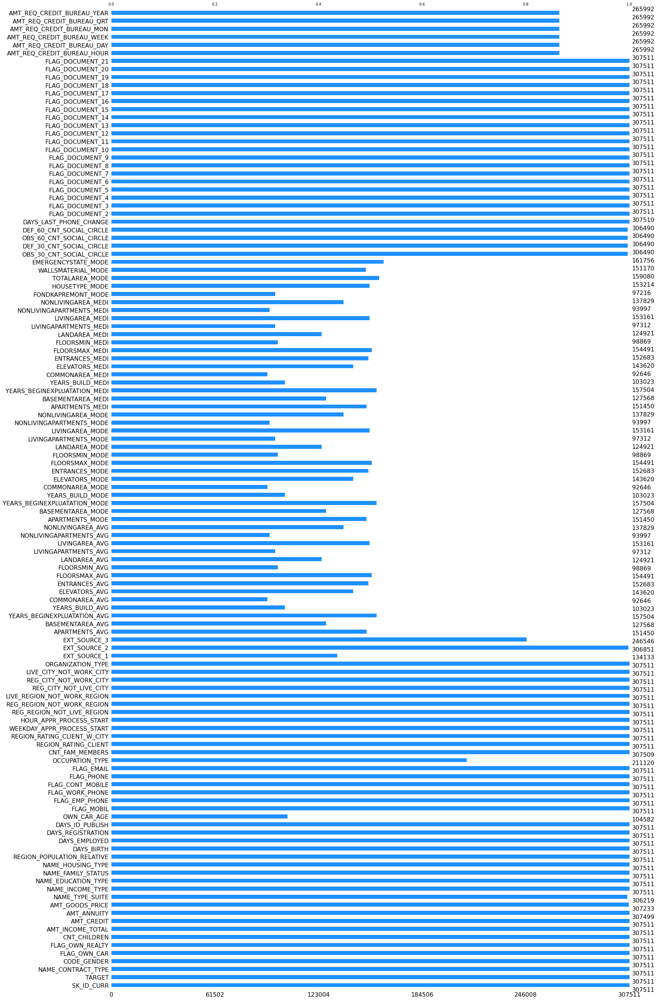

In [15]:
msno.bar(application_train, color='dodgerblue');

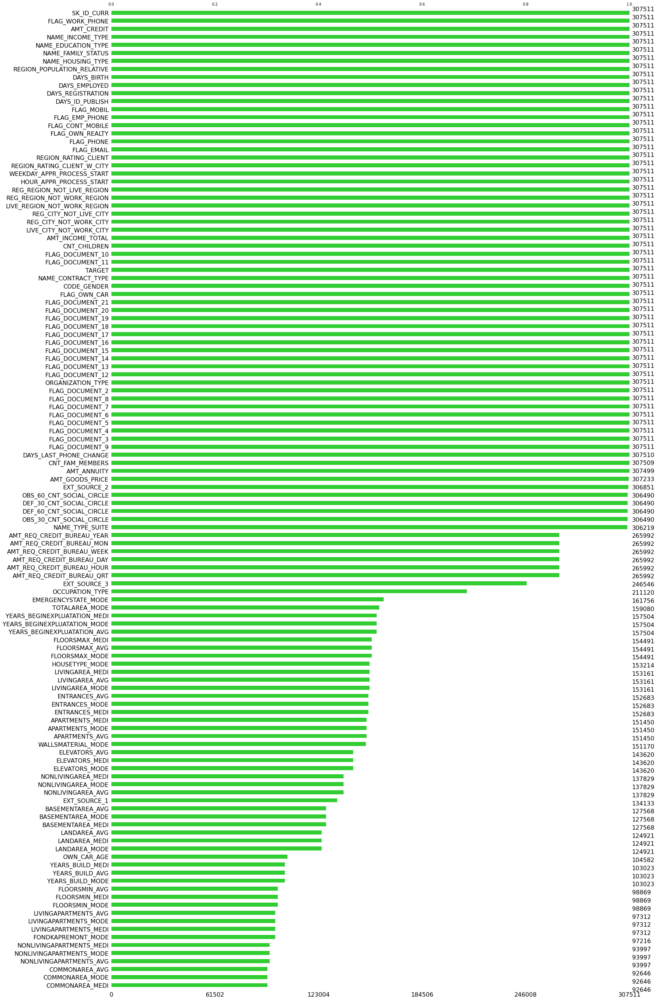

In [16]:
msno.bar(application_train,
         sort='ascending',
         color='limegreen');

## Test data overview

In [ ]:
application_test.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Data columns (total 121 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   SK_ID_CURR                    int32  
 1   NAME_CONTRACT_TYPE            object 
 2   CODE_GENDER                   object 
 3   FLAG_OWN_CAR                  object 
 4   FLAG_OWN_REALTY               object 
 5   CNT_CHILDREN                  int8   
 6   AMT_INCOME_TOTAL              float32
 7   AMT_CREDIT                    float32
 8   AMT_ANNUITY                   float32
 9   AMT_GOODS_PRICE               float32
 10  NAME_TYPE_SUITE               object 
 11  NAME_INCOME_TYPE              object 
 12  NAME_EDUCATION_TYPE           object 
 13  NAME_FAMILY_STATUS            object 
 14  NAME_HOUSING_TYPE             object 
 15  REGION_POPULATION_RELATIVE    float16
 16  DAYS_BIRTH                    int16  
 17  DAYS_EMPLOYED                 int32  
 18  DAYS_REGISTRATION        

In [ ]:
application_test.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,...,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,...,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.026392,-13976,-1866,-2000.0,-4208,NaN,1,1,0,1,1,0,Sales staff,4.0,2,2,WEDNESDAY,11,0,0,0,0,0,0,Business Entity Type 3,...,0.2446,0.3739,0.0388,0.0817,reg oper account,block of flats,0.3700,Panel,No,0.0,0.0,0.0,0.0,-1805.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.010032,-13040,-2191,-4000.0,-4262,16.0,1,1,1,1,0,0,NaN,3.0,2,2,FRIDAY,5,0,0,0,0,1,1,Business Entity Type 3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-821.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


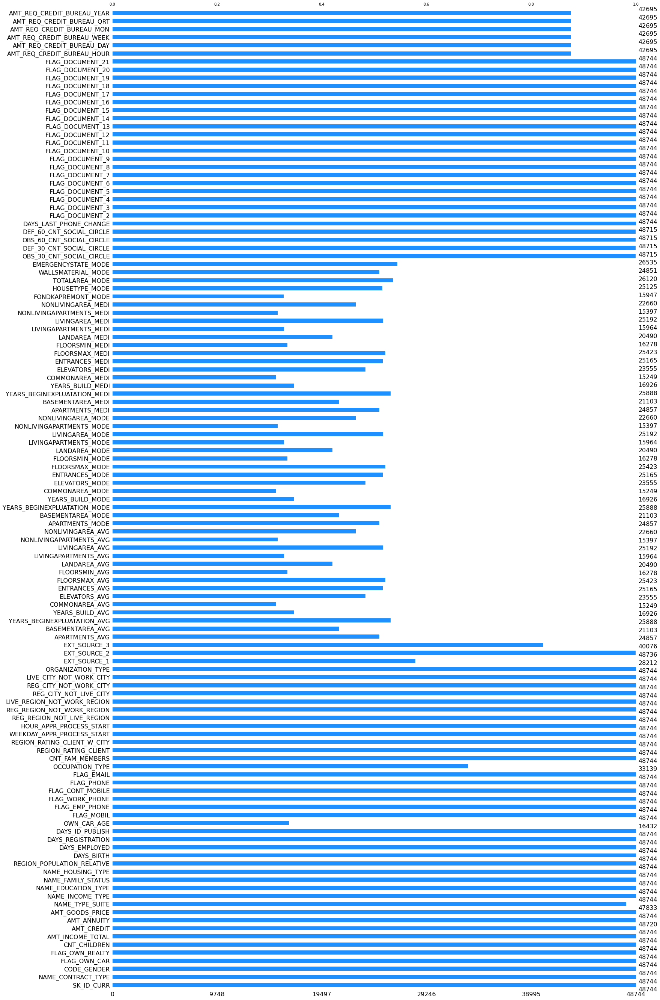

In [ ]:
msno.bar(application_test, color='dodgerblue');

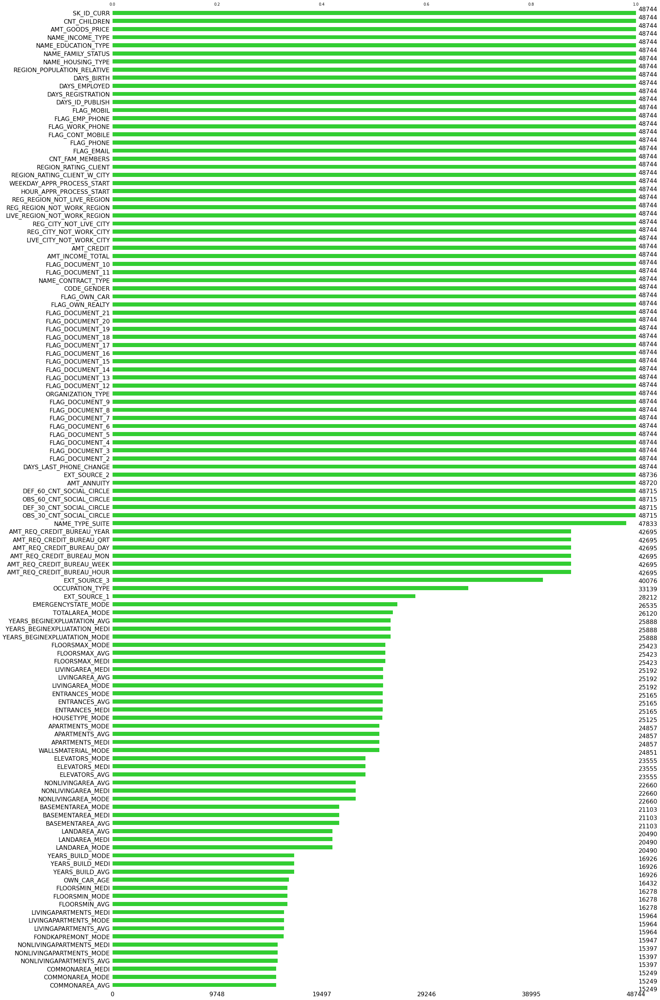

In [17]:
msno.bar(
    application_test,
    sort='ascending',
    color='limegreen');

In [ ]:
feat_diff = list(set(application_train.columns) - set(application_test.columns))
print(f'Feature in application_train not contained in application_test: {feat_diff}')

Feature in application_train not contained in application_test: ['TARGET']


## Feature types

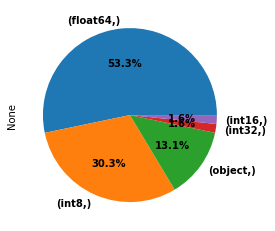

In [ ]:
application_train.dtypes.value_counts().plot.pie(
    autopct='%.1f%%',
    textprops=dict(weight='bold')
);

## Feature analysis

### Target

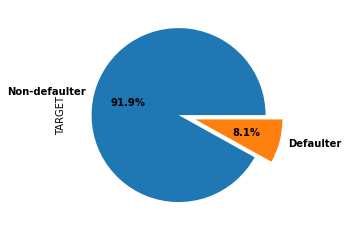

In [10]:
application_train['TARGET'].value_counts().plot.pie(autopct='%.1f%%',
                                                 labels = ['Non-defaulter', 'Defaulter'],
                                                 textprops=dict(weight='bold'),
                                                 explode = [0, .2]);

In [11]:
target_pct = application_train['TARGET'].value_counts(normalize=True).mul(100)

print(f'Percentage of non-defaulter customers : {target_pct[0]:.2f}%')
print(f'Percentage of defaulter customers: {target_pct[1]:.2f}%')

Percentage of non-defaulter customers : 91.93%
Percentage of defaulter customers: 8.07%


### Type conversion

In [8]:
for feat in (x for x in application_train.columns if 'DAYS' in x):
  print(application_train[feat].dtype)

int16
int32
float64
int16
float64


In [9]:
# Convert the day features into variables of float type
for feat in (x for x in application_train.columns if 'DAYS' in x):
  application_train[feat] = application_train[feat].astype(float)
  application_test[feat] = application_test[feat].astype(float)

In [10]:
for feat in ['CNT_FAM_MEMBERS',
             'OBS_30_CNT_SOCIAL_CIRCLE',             
             'DEF_30_CNT_SOCIAL_CIRCLE',
             'OBS_60_CNT_SOCIAL_CIRCLE',
             'DEF_60_CNT_SOCIAL_CIRCLE',
             'AMT_REQ_CREDIT_BUREAU_HOUR',
             'AMT_REQ_CREDIT_BUREAU_DAY',
             'AMT_REQ_CREDIT_BUREAU_WEEK',
             'AMT_REQ_CREDIT_BUREAU_MON',
             'AMT_REQ_CREDIT_BUREAU_QRT',
             'AMT_REQ_CREDIT_BUREAU_YEAR']:
  print(application_train[feat].dtype)

float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64


In [11]:
# Convert the following features into variables of the nullable integer type
for feat in ['CNT_FAM_MEMBERS',
             'OBS_30_CNT_SOCIAL_CIRCLE',
             'DEF_30_CNT_SOCIAL_CIRCLE',
             'OBS_60_CNT_SOCIAL_CIRCLE',
             'DEF_60_CNT_SOCIAL_CIRCLE',
             'AMT_REQ_CREDIT_BUREAU_HOUR',
             'AMT_REQ_CREDIT_BUREAU_DAY',
             'AMT_REQ_CREDIT_BUREAU_WEEK',
             'AMT_REQ_CREDIT_BUREAU_MON',
             'AMT_REQ_CREDIT_BUREAU_QRT',
             'AMT_REQ_CREDIT_BUREAU_YEAR']:
  application_train[feat] = application_train[feat].astype('Int16')
  application_test[feat] = application_test[feat].astype('Int16')  

### Categorical features

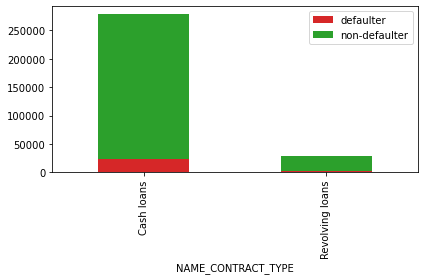

,defaulter,non-defaulter,total
NAME_CONTRACT_TYPE,,,
Cash loans,23221.0,255011,278232.0
Revolving loans,1604.0,27675,29279.0


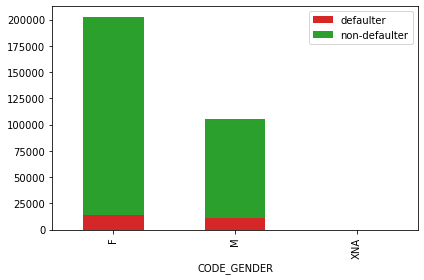

,defaulter,non-defaulter,total
CODE_GENDER,,,
F,14170.0,188278,202448.0
M,10655.0,94404,105059.0
XNA,0.0,4,4.0


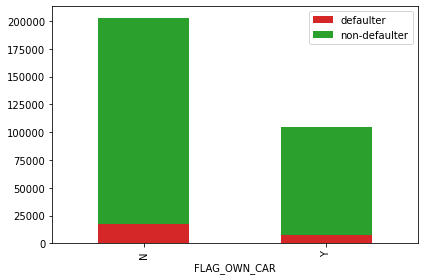

,defaulter,non-defaulter,total
FLAG_OWN_CAR,,,
N,17249.0,185675,202924.0
Y,7576.0,97011,104587.0


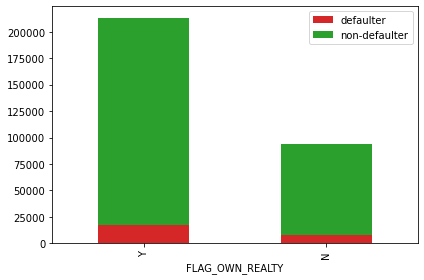

,defaulter,non-defaulter,total
FLAG_OWN_REALTY,,,
Y,16983.0,196329,213312.0
N,7842.0,86357,94199.0


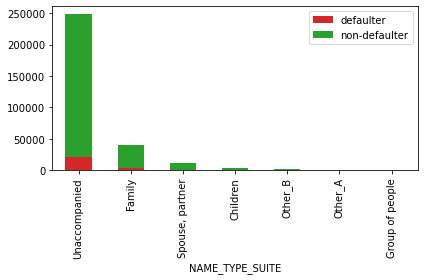

,defaulter,non-defaulter,total
NAME_TYPE_SUITE,,,
Unaccompanied,20337.0,228189,248526.0
Family,3009.0,37140,40149.0
"Spouse, partner",895.0,10475,11370.0
Children,241.0,3026,3267.0
Other_B,174.0,1596,1770.0
Other_A,76.0,790,866.0
Group of people,23.0,248,271.0


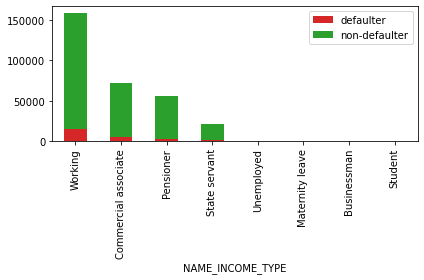

,defaulter,non-defaulter,total
NAME_INCOME_TYPE,,,
Working,15224.0,143550,158774.0
Commercial associate,5360.0,66257,71617.0
Pensioner,2982.0,52380,55362.0
State servant,1249.0,20454,21703.0
Unemployed,8.0,14,22.0
Maternity leave,2.0,3,5.0
Businessman,0.0,10,10.0
Student,0.0,18,18.0


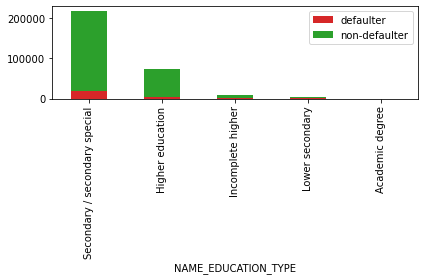

,defaulter,non-defaulter,total
NAME_EDUCATION_TYPE,,,
Secondary / secondary special,19524.0,198867,218391.0
Higher education,4009.0,70854,74863.0
Incomplete higher,872.0,9405,10277.0
Lower secondary,417.0,3399,3816.0
Academic degree,3.0,161,164.0


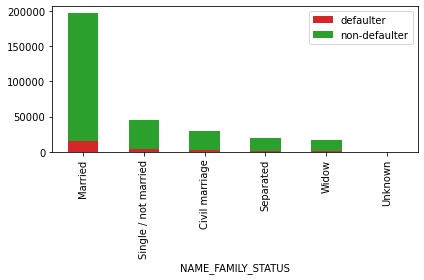

,defaulter,non-defaulter,total
NAME_FAMILY_STATUS,,,
Married,14850.0,181582,196432.0
Single / not married,4457.0,40987,45444.0
Civil marriage,2961.0,26814,29775.0
Separated,1620.0,18150,19770.0
Widow,937.0,15151,16088.0
Unknown,0.0,2,2.0


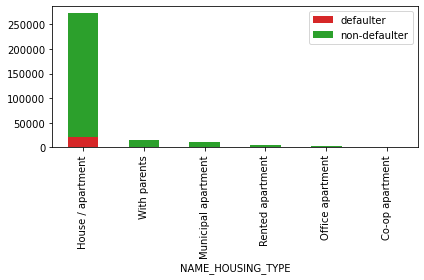

,defaulter,non-defaulter,total
NAME_HOUSING_TYPE,,,
House / apartment,21272.0,251596,272868.0
With parents,1736.0,13104,14840.0
Municipal apartment,955.0,10228,11183.0
Rented apartment,601.0,4280,4881.0
Office apartment,172.0,2445,2617.0
Co-op apartment,89.0,1033,1122.0


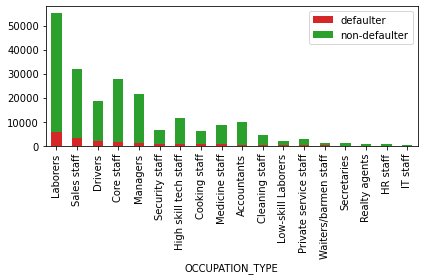

,defaulter,non-defaulter,total
OCCUPATION_TYPE,,,
Laborers,5838.0,49348,55186.0
Sales staff,3092.0,29010,32102.0
Drivers,2107.0,16496,18603.0
Core staff,1738.0,25832,27570.0
Managers,1328.0,20043,21371.0
Security staff,722.0,5999,6721.0
High skill tech staff,701.0,10679,11380.0
Cooking staff,621.0,5325,5946.0
Medicine staff,572.0,7965,8537.0


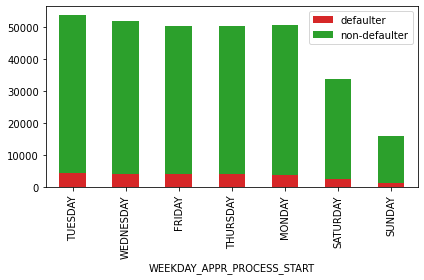

,defaulter,non-defaulter,total
WEEKDAY_APPR_PROCESS_START,,,
TUESDAY,4501.0,49400,53901.0
WEDNESDAY,4238.0,47696,51934.0
FRIDAY,4101.0,46237,50338.0
THURSDAY,4098.0,46493,50591.0
MONDAY,3934.0,46780,50714.0
SATURDAY,2670.0,31182,33852.0
SUNDAY,1283.0,14898,16181.0


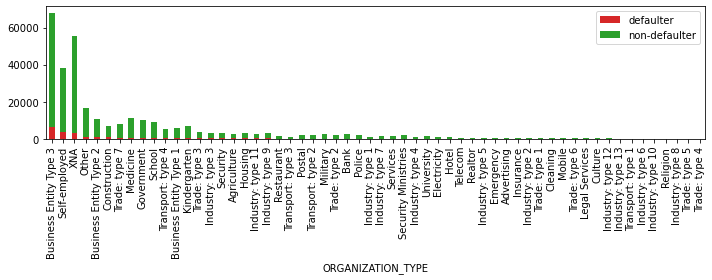

,defaulter,non-defaulter,total
ORGANIZATION_TYPE,,,
Business Entity Type 3,6323.0,61669,67992.0
Self-employed,3908.0,34504,38412.0
XNA,2990.0,52384,55374.0
Other,1275.0,15408,16683.0
Business Entity Type 2,900.0,9653,10553.0
Construction,785.0,5936,6721.0
Trade: type 7,740.0,7091,7831.0
Medicine,737.0,10456,11193.0
Government,726.0,9678,10404.0


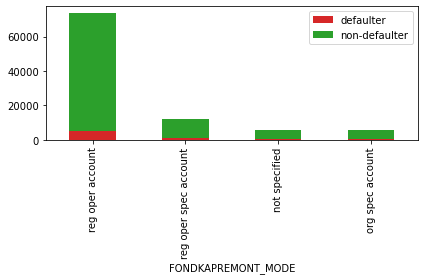

,defaulter,non-defaulter,total
FONDKAPREMONT_MODE,,,
reg oper account,5152.0,68678,73830.0
reg oper spec account,792.0,11288,12080.0
not specified,429.0,5258,5687.0
org spec account,327.0,5292,5619.0


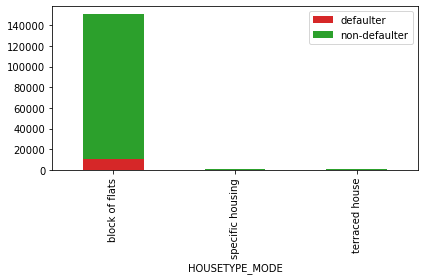

,defaulter,non-defaulter,total
HOUSETYPE_MODE,,,
block of flats,10450.0,140053,150503.0
specific housing,152.0,1347,1499.0
terraced house,103.0,1109,1212.0


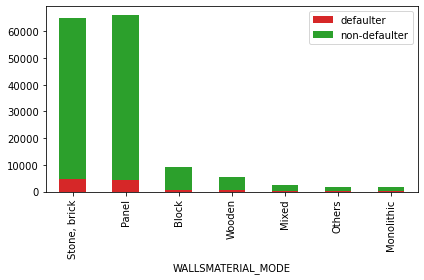

,defaulter,non-defaulter,total
WALLSMATERIAL_MODE,,,
"Stone, brick",4800.0,60015,64815.0
Panel,4192.0,61848,66040.0
Block,650.0,8603,9253.0
Wooden,520.0,4842,5362.0
Mixed,173.0,2123,2296.0
Others,135.0,1490,1625.0
Monolithic,84.0,1695,1779.0


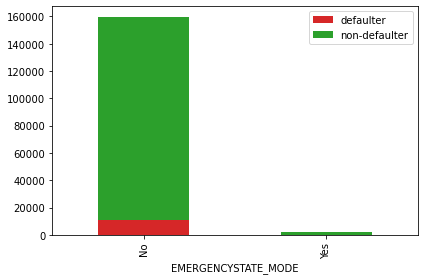

,defaulter,non-defaulter,total
EMERGENCYSTATE_MODE,,,
No,11104.0,148324,159428.0
Yes,223.0,2105,2328.0


In [12]:
for feat in application_train.select_dtypes(object).columns:
  plot_train_bars_by_target(application_train, feat)

### Discrete features

In [ ]:
application_train.select_dtypes('integer').columns.tolist()

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21']

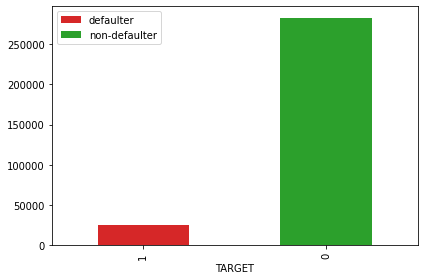

,defaulter,non-defaulter,total
TARGET,,,
1,24825.0,0,24825.0
0,0.0,282686,282686.0


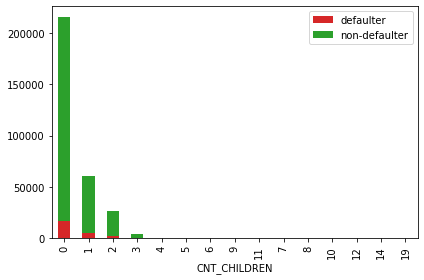

,defaulter,non-defaulter,total
CNT_CHILDREN,,,
0,16609.0,198762,215371.0
1,5454.0,55665,61119.0
2,2333.0,24416,26749.0
3,358.0,3359,3717.0
4,55.0,374,429.0
5,7.0,77,84.0
6,6.0,15,21.0
9,2.0,0,2.0
11,1.0,0,1.0


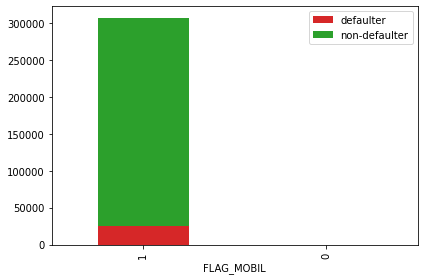

,defaulter,non-defaulter,total
FLAG_MOBIL,,,
1,24825.0,282685,307510.0
0,0.0,1,1.0


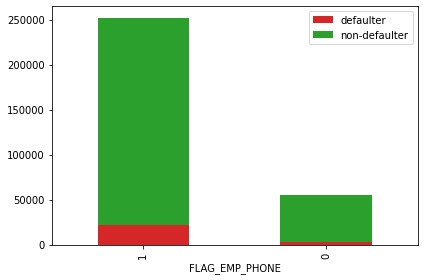

,defaulter,non-defaulter,total
FLAG_EMP_PHONE,,,
1,21834.0,230291,252125.0
0,2991.0,52395,55386.0


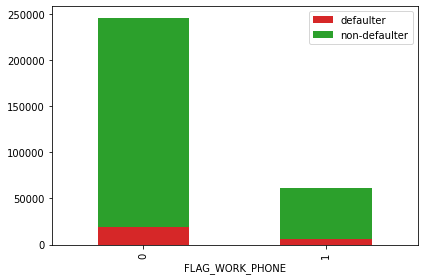

,defaulter,non-defaulter,total
FLAG_WORK_PHONE,,,
0,18921.0,227282,246203.0
1,5904.0,55404,61308.0


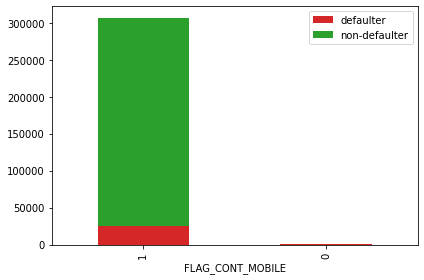

,defaulter,non-defaulter,total
FLAG_CONT_MOBILE,,,
1,24780.0,282157,306937.0
0,45.0,529,574.0


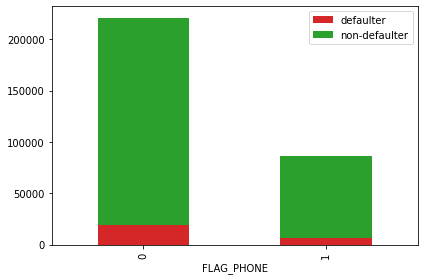

,defaulter,non-defaulter,total
FLAG_PHONE,,,
0,18744.0,202336,221080.0
1,6081.0,80350,86431.0


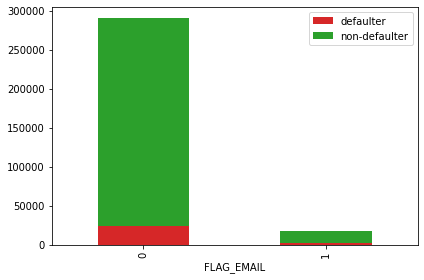

,defaulter,non-defaulter,total
FLAG_EMAIL,,,
0,23451.0,266618,290069.0
1,1374.0,16068,17442.0


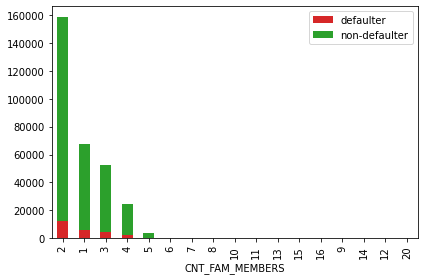

,defaulter,non-defaulter,total
CNT_FAM_MEMBERS,,,
2,12009.0,146348,158357.0
1,5675.0,62172,67847.0
3,4608.0,47993,52601.0
4,2136.0,22561,24697.0
5,327.0,3151,3478.0
6,55.0,353,408.0
7,6.0,75,81.0
8,6.0,14,20.0
10,1.0,2,3.0


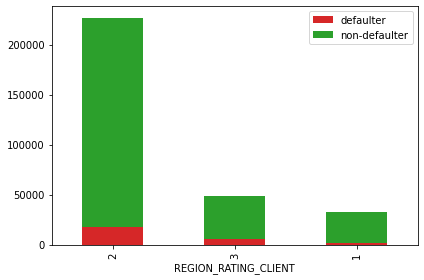

,defaulter,non-defaulter,total
REGION_RATING_CLIENT,,,
2,17907.0,209077,226984.0
3,5366.0,42964,48330.0
1,1552.0,30645,32197.0


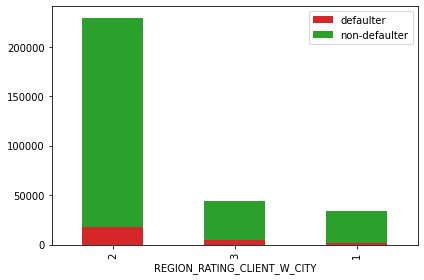

,defaulter,non-defaulter,total
REGION_RATING_CLIENT_W_CITY,,,
2,18170.0,211314,229484.0
3,5001.0,38859,43860.0
1,1654.0,32513,34167.0


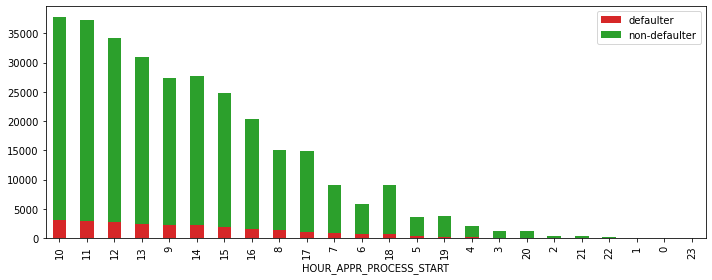

,defaulter,non-defaulter,total
HOUR_APPR_PROCESS_START,,,
10,3026.0,34696,37722.0
11,3006.0,34223,37229.0
12,2827.0,31406,34233.0
13,2485.0,28474,30959.0
9,2247.0,25137,27384.0
14,2189.0,25493,27682.0
15,1886.0,22953,24839.0
16,1521.0,18864,20385.0
8,1373.0,13754,15127.0


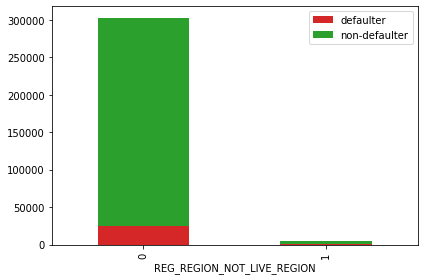

,defaulter,non-defaulter,total
REG_REGION_NOT_LIVE_REGION,,,
0,24392.0,278462,302854.0
1,433.0,4224,4657.0


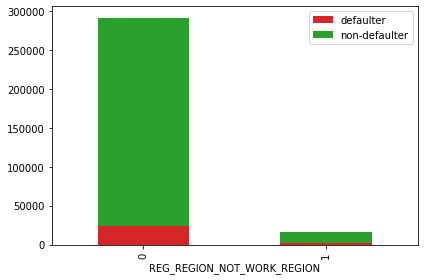

,defaulter,non-defaulter,total
REG_REGION_NOT_WORK_REGION,,,
0,23437.0,268462,291899.0
1,1388.0,14224,15612.0


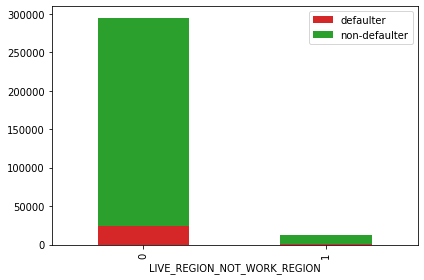

,defaulter,non-defaulter,total
LIVE_REGION_NOT_WORK_REGION,,,
0,23769.0,271239,295008.0
1,1056.0,11447,12503.0


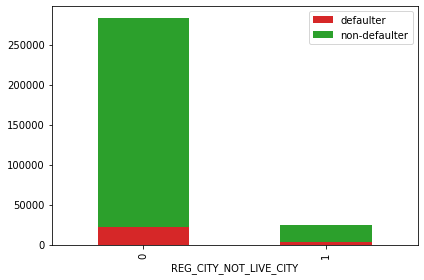

,defaulter,non-defaulter,total
REG_CITY_NOT_LIVE_CITY,,,
0,21886.0,261586,283472.0
1,2939.0,21100,24039.0


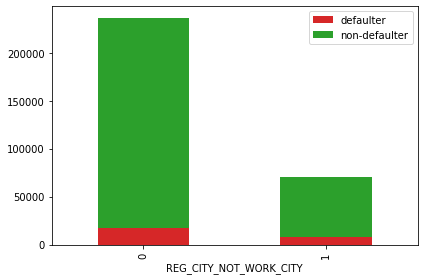

,defaulter,non-defaulter,total
REG_CITY_NOT_WORK_CITY,,,
0,17305.0,219339,236644.0
1,7520.0,63347,70867.0


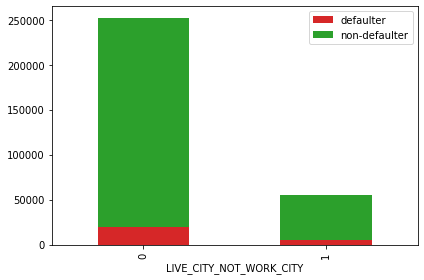

,defaulter,non-defaulter,total
LIVE_CITY_NOT_WORK_CITY,,,
0,19322.0,232974,252296.0
1,5503.0,49712,55215.0


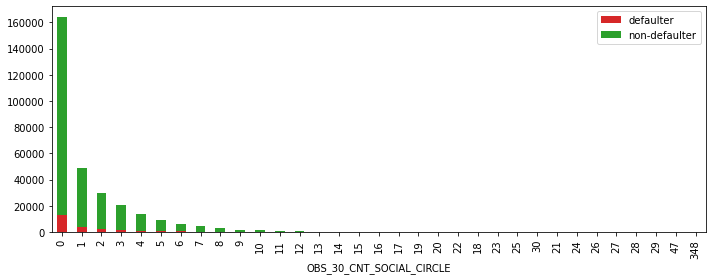

,defaulter,non-defaulter,total
OBS_30_CNT_SOCIAL_CIRCLE,,,
0,12950.0,150960,163910.0
1,3895.0,44888,48783.0
2,2458.0,27350,29808.0
3,1675.0,18647,20322.0
4,1248.0,12895,14143.0
5,797.0,8756,9553.0
6,565.0,5888,6453.0
7,411.0,3979,4390.0
8,246.0,2721,2967.0


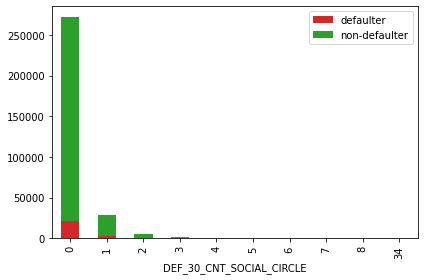

,defaulter,non-defaulter,total
DEF_30_CNT_SOCIAL_CIRCLE,,,
0,21098.0,250226,271324.0
1,2874.0,25454,28328.0
2,620.0,4703,5323.0
3,153.0,1039,1192.0
4,35.0,218,253.0
5,8.0,48,56.0
6,1.0,10,11.0
7,0.0,1,1.0
8,0.0,1,1.0


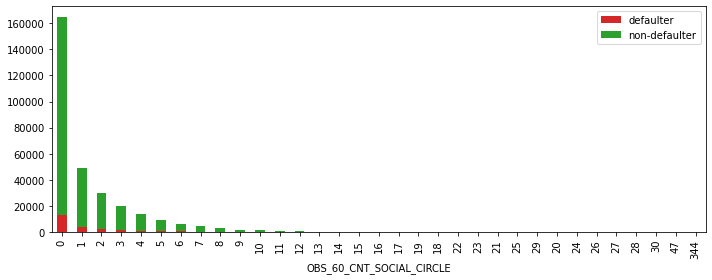

,defaulter,non-defaulter,total
OBS_60_CNT_SOCIAL_CIRCLE,,,
0,13021.0,151645,164666.0
1,3894.0,44976,48870.0
2,2448.0,27318,29766.0
3,1670.0,18545,20215.0
4,1232.0,12714,13946.0
5,798.0,8665,9463.0
6,565.0,5784,6349.0
7,391.0,3953,4344.0
8,240.0,2646,2886.0


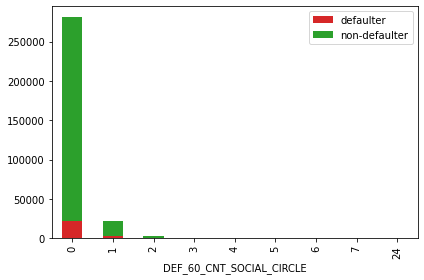

,defaulter,non-defaulter,total
DEF_60_CNT_SOCIAL_CIRCLE,,,
0,21994.0,258727,280721.0
1,2297.0,19544,21841.0
2,385.0,2785,3170.0
3,95.0,503,598.0
4,15.0,120,135.0
5,3.0,17,20.0
6,0.0,3,3.0
7,0.0,1,1.0
24,0.0,1,1.0


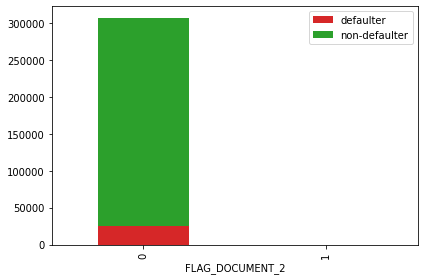

,defaulter,non-defaulter,total
FLAG_DOCUMENT_2,,,
0,24821.0,282677,307498.0
1,4.0,9,13.0


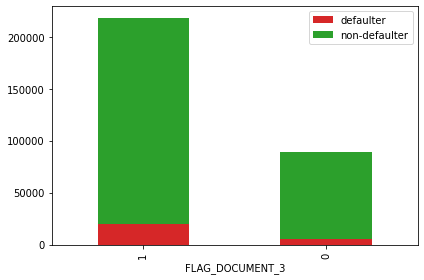

,defaulter,non-defaulter,total
FLAG_DOCUMENT_3,,,
1,19312.0,199028,218340.0
0,5513.0,83658,89171.0


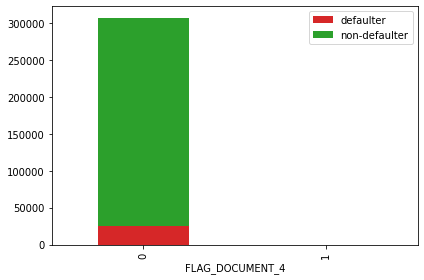

,defaulter,non-defaulter,total
FLAG_DOCUMENT_4,,,
0,24825.0,282661,307486.0
1,0.0,25,25.0


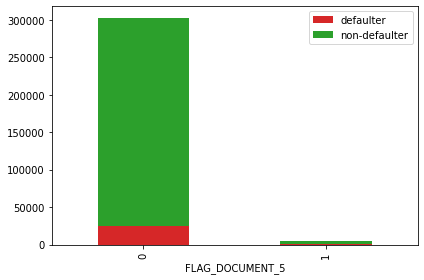

,defaulter,non-defaulter,total
FLAG_DOCUMENT_5,,,
0,24453.0,278410,302863.0
1,372.0,4276,4648.0


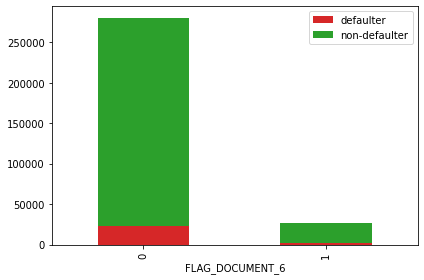

,defaulter,non-defaulter,total
FLAG_DOCUMENT_6,,,
0,23318.0,257115,280433.0
1,1507.0,25571,27078.0


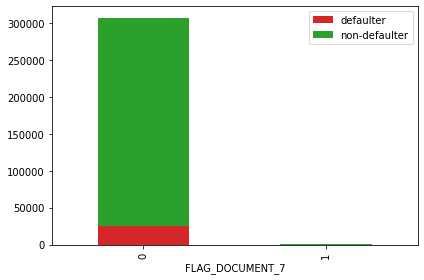

,defaulter,non-defaulter,total
FLAG_DOCUMENT_7,,,
0,24822.0,282630,307452.0
1,3.0,56,59.0


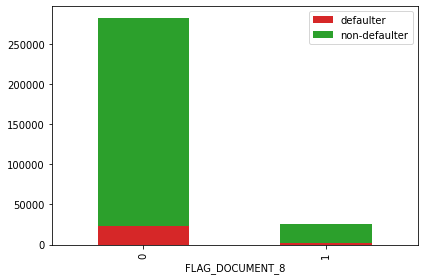

,defaulter,non-defaulter,total
FLAG_DOCUMENT_8,,,
0,22989.0,259498,282487.0
1,1836.0,23188,25024.0


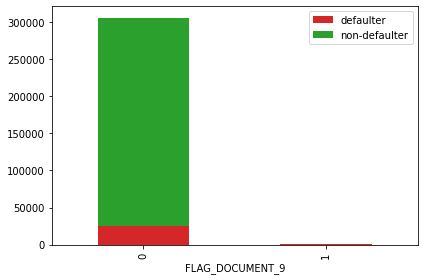

,defaulter,non-defaulter,total
FLAG_DOCUMENT_9,,,
0,24751.0,281562,306313.0
1,74.0,1124,1198.0


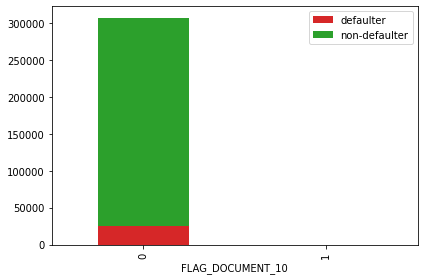

,defaulter,non-defaulter,total
FLAG_DOCUMENT_10,,,
0,24825.0,282679,307504.0
1,0.0,7,7.0


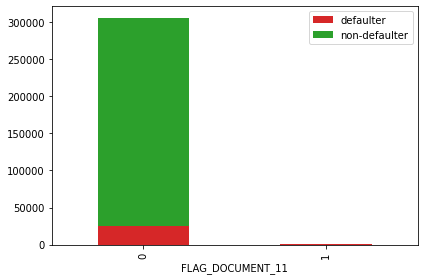

,defaulter,non-defaulter,total
FLAG_DOCUMENT_11,,,
0,24750.0,281558,306308.0
1,75.0,1128,1203.0


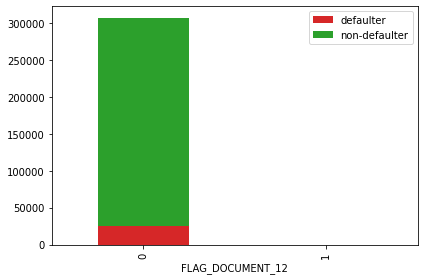

,defaulter,non-defaulter,total
FLAG_DOCUMENT_12,,,
0,24825.0,282684,307509.0
1,0.0,2,2.0


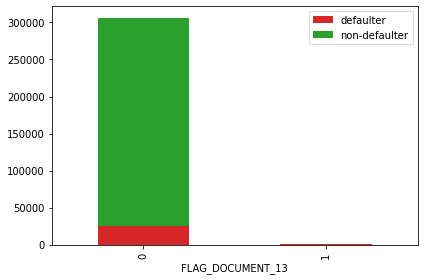

,defaulter,non-defaulter,total
FLAG_DOCUMENT_13,,,
0,24795.0,281632,306427.0
1,30.0,1054,1084.0


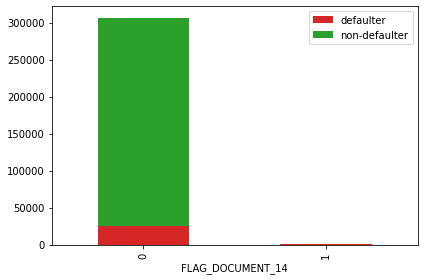

,defaulter,non-defaulter,total
FLAG_DOCUMENT_14,,,
0,24795.0,281813,306608.0
1,30.0,873,903.0


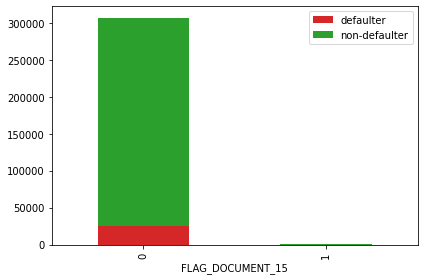

,defaulter,non-defaulter,total
FLAG_DOCUMENT_15,,,
0,24814.0,282325,307139.0
1,11.0,361,372.0


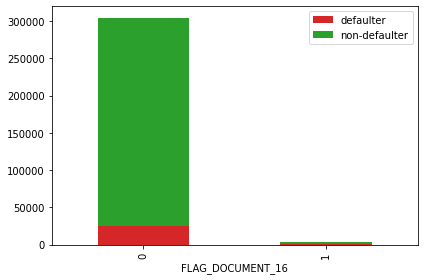

,defaulter,non-defaulter,total
FLAG_DOCUMENT_16,,,
0,24675.0,279783,304458.0
1,150.0,2903,3053.0


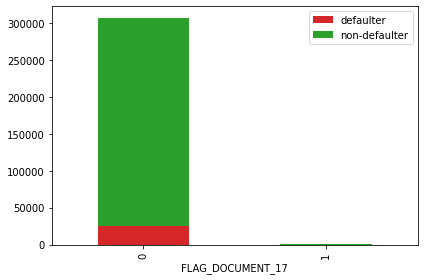

,defaulter,non-defaulter,total
FLAG_DOCUMENT_17,,,
0,24823.0,282606,307429.0
1,2.0,80,82.0


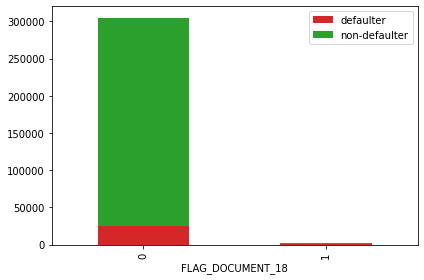

,defaulter,non-defaulter,total
FLAG_DOCUMENT_18,,,
0,24683.0,280328,305011.0
1,142.0,2358,2500.0


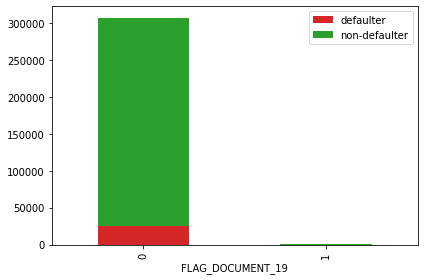

,defaulter,non-defaulter,total
FLAG_DOCUMENT_19,,,
0,24813.0,282515,307328.0
1,12.0,171,183.0


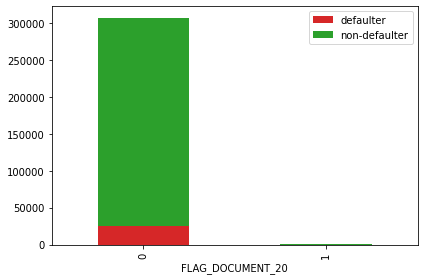

,defaulter,non-defaulter,total
FLAG_DOCUMENT_20,,,
0,24812.0,282543,307355.0
1,13.0,143,156.0


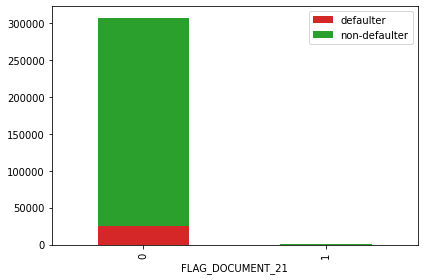

,defaulter,non-defaulter,total
FLAG_DOCUMENT_21,,,
0,24811.0,282597,307408.0
1,14.0,89,103.0


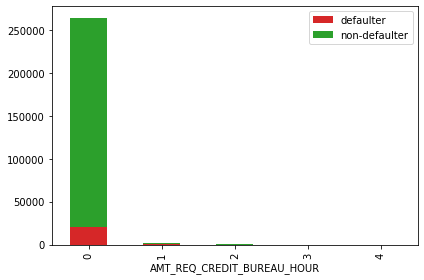

,defaulter,non-defaulter,total
AMT_REQ_CREDIT_BUREAU_HOUR,,,
0,20402.0,243964,264366.0
1,125.0,1435,1560.0
2,6.0,50,56.0
3,0.0,9,9.0
4,0.0,1,1.0


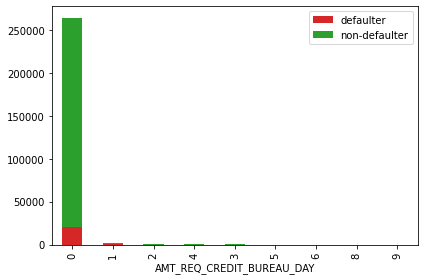

,defaulter,non-defaulter,total
AMT_REQ_CREDIT_BUREAU_DAY,,,
0,20392.0,244111,264503.0
1,125.0,1167,1292.0
2,11.0,95,106.0
4,3.0,23,26.0
3,2.0,43,45.0
5,0.0,9,9.0
6,0.0,8,8.0
8,0.0,1,1.0
9,0.0,2,2.0


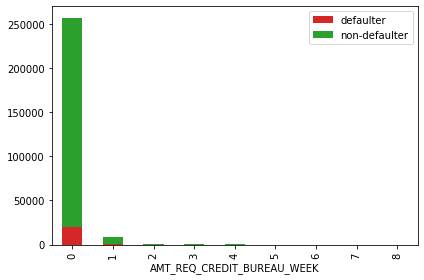

,defaulter,non-defaulter,total
AMT_REQ_CREDIT_BUREAU_WEEK,,,
0,19865.0,237591,257456.0
1,638.0,7570,8208.0
2,20.0,179,199.0
3,4.0,54,58.0
4,4.0,30,34.0
5,1.0,9,10.0
6,1.0,19,20.0
7,0.0,2,2.0
8,0.0,5,5.0


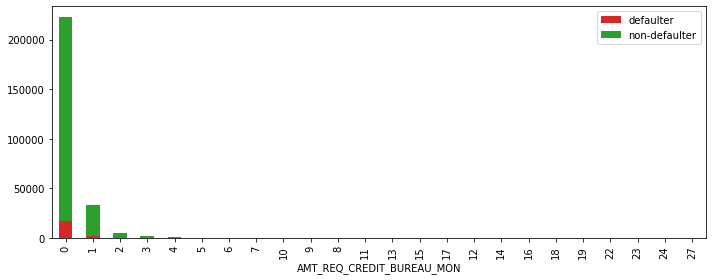

,defaulter,non-defaulter,total
AMT_REQ_CREDIT_BUREAU_MON,,,
0,17315.0,204918,222233.0
1,2560.0,30587,33147.0
2,379.0,5007,5386.0
3,108.0,1883,1991.0
4,60.0,1016,1076.0
5,40.0,562,602.0
6,18.0,325,343.0
7,17.0,281,298.0
10,11.0,121,132.0


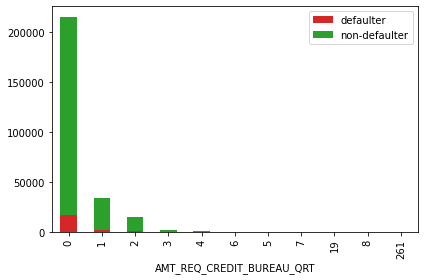

,defaulter,non-defaulter,total
AMT_REQ_CREDIT_BUREAU_QRT,,,
0,16905.0,198512,215417.0
1,2227.0,31635,33862.0
2,1203.0,13209,14412.0
3,126.0,1591,1717.0
4,57.0,419,476.0
6,7.0,21,28.0
5,6.0,58,64.0
7,1.0,6,7.0
19,1.0,0,1.0


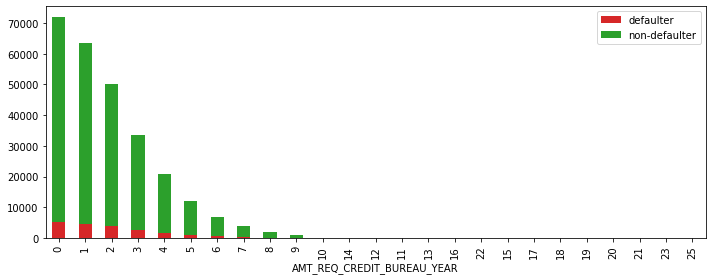

,defaulter,non-defaulter,total
AMT_REQ_CREDIT_BUREAU_YEAR,,,
0,5123.0,66678,71801.0
1,4650.0,58755,63405.0
2,4068.0,46124,50192.0
3,2676.0,30952,33628.0
4,1710.0,19004,20714.0
5,1003.0,11049,12052.0
6,632.0,6335,6967.0
7,356.0,3513,3869.0
8,183.0,1944,2127.0


In [ ]:
for feat in application_train.select_dtypes('integer').columns[1:]:  
  plot_train_bars_by_target(application_train, feat)

### Continuous features, or very numerous discrete ones with large values

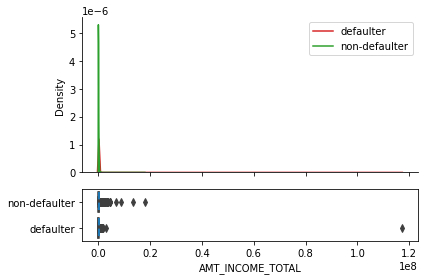

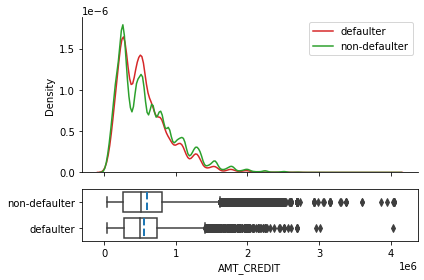

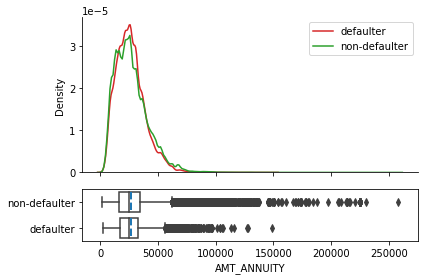

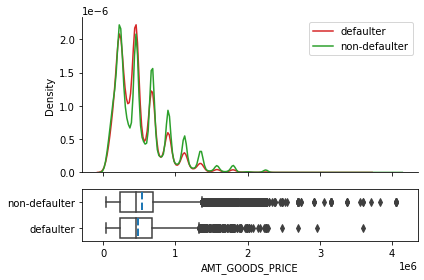

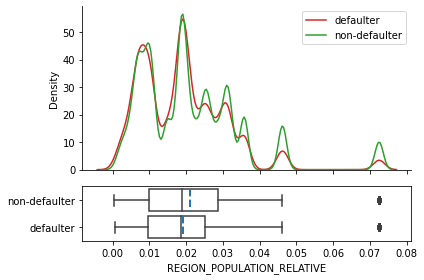

...

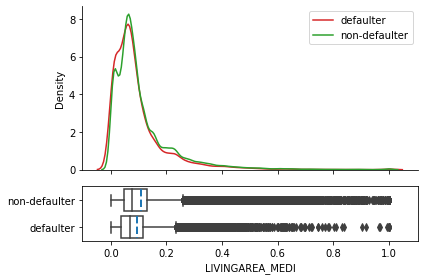

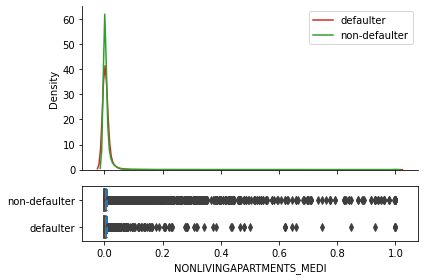

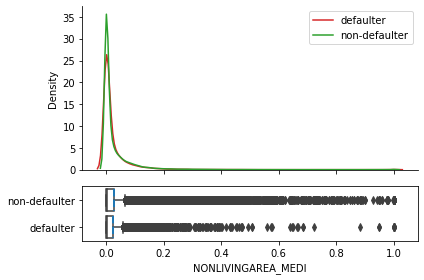

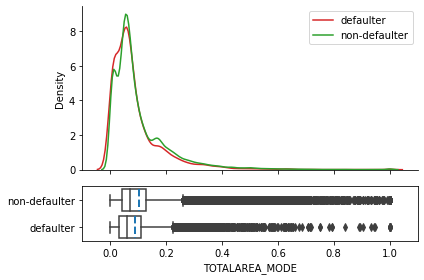

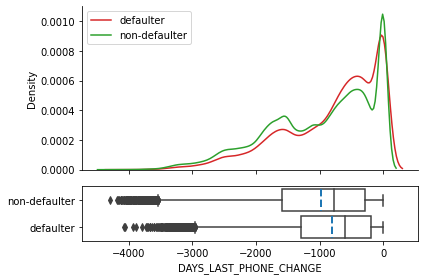

In [ ]:
with plt.rc_context(rc = {'figure.max_open_warning': 0}):
  for feat in application_train.select_dtypes('floating').columns:
    plot_train_density_with_central_tendencies_by_target(application_train, feat)

### Correlations

#### $\phi_K$ correlation

 ##### Between the target and the categorical features

interval columns not set, guessing: ['TARGET']


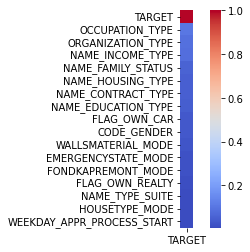

In [ ]:
phik_matrix_cat = application_train[
    ['TARGET'] + application_train.select_dtypes(
        'object').columns.tolist()].phik_matrix()
idx = phik_matrix_cat.sort_values(by='TARGET', ascending=False).index
phik_matrix_cat = phik_matrix_cat.loc[idx, idx]

sns.heatmap(
    phik_matrix_cat['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True
);

In [ ]:
phik_matrix_cat['TARGET'].to_frame().head(20).mul(100)[1:]

,TARGET
OCCUPATION_TYPE,10.284568
ORGANIZATION_TYPE,8.916363
NAME_INCOME_TYPE,8.483064
NAME_FAMILY_STATUS,5.604276
NAME_HOUSING_TYPE,5.110732
NAME_CONTRACT_TYPE,4.839922
NAME_EDUCATION_TYPE,4.695403
FLAG_OWN_CAR,3.417905
CODE_GENDER,3.292130
WALLSMATERIAL_MODE,2.773949


##### Between the categorical features themselves

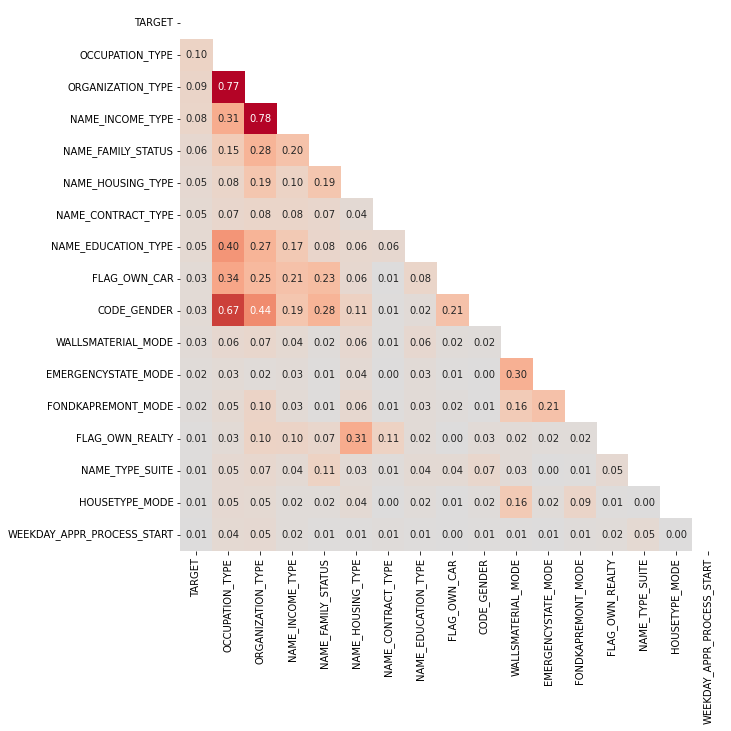

In [ ]:
mask = np.zeros_like(phik_matrix_cat)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(10, 10))
sns.heatmap(
    phik_matrix_cat,
    mask=mask,
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.2f',
    annot=True,
    cbar=False
)
plt.tight_layout()
plt.show()

#### Correlations between the target and the discrete features

##### $\phi_K$ correlation

interval columns not set, guessing: ['TARGET', 'CNT_CHILDREN', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT

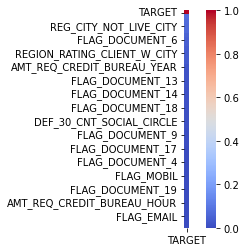

In [ ]:
# features_int = application_train.select_dtypes('integer').columns\
#                 if feat not in ['TARGET', 'SK_ID_CURR']]
# phik_target_int = np.zeros(len(features_int))

# for idx, col in enumerate(features_int):
#   phik_target_int[idx] = application_train[['TARGET', col]].phik_matrix().iloc[0, 1]

phik_matrix_int = application_train[application_train.select_dtypes(
    'integer').columns].drop(columns='SK_ID_CURR').phik_matrix()
idx = phik_matrix_int.sort_values(by='TARGET', ascending=False).index
phik_matrix_int = phik_matrix_int.loc[idx, idx]

sns.heatmap(
    phik_matrix_int['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True
);

In [ ]:
phik_matrix_int['TARGET'].to_frame().head(30).mul(100)[1:]

,TARGET
REG_CITY_NOT_WORK_CITY,7.994612
FLAG_EMP_PHONE,7.208674
REG_CITY_NOT_LIVE_CITY,6.958788
FLAG_DOCUMENT_3,6.952523
LIVE_CITY_NOT_WORK_CITY,5.095564
FLAG_DOCUMENT_6,4.479058
FLAG_WORK_PHONE,4.467824
FLAG_PHONE,3.725781
REGION_RATING_CLIENT_W_CITY,3.669856
REGION_RATING_CLIENT,3.545032


##### Pearson correlation

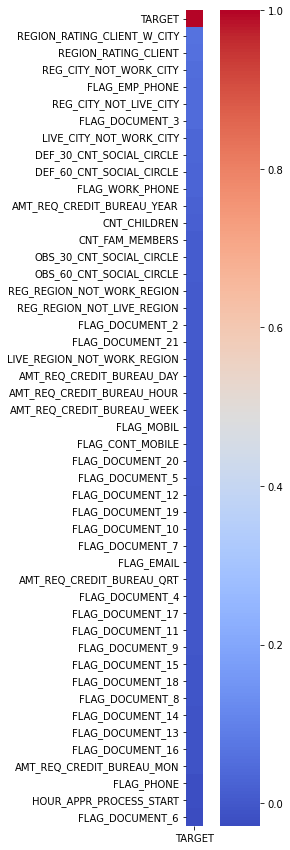

In [ ]:
corr_int = application_train[application_train.select_dtypes('integer').columns]\
                                              .drop(columns='SK_ID_CURR').corr()
idx = corr_int.sort_values(by='TARGET',
                           ascending=False).index
corr_int = corr_int.loc[idx, idx]

plt.figure(figsize = (6, 15))
sns.heatmap(corr_int['TARGET'].to_frame(),
            cmap='coolwarm',
            square=True,
            cbar=True);

In [ ]:
corr_int['TARGET'].nlargest(30).mul(100).to_frame()[1:]

,TARGET
REGION_RATING_CLIENT_W_CITY,6.089267
REGION_RATING_CLIENT,5.889901
REG_CITY_NOT_WORK_CITY,5.099446
FLAG_EMP_PHONE,4.598222
REG_CITY_NOT_LIVE_CITY,4.439537
FLAG_DOCUMENT_3,4.434635
LIVE_CITY_NOT_WORK_CITY,3.251834
DEF_30_CNT_SOCIAL_CIRCLE,3.224758
DEF_60_CNT_SOCIAL_CIRCLE,3.127647
FLAG_WORK_PHONE,2.852432


In [ ]:
corr_int['TARGET'].nsmallest(30).mul(100).to_frame()

,TARGET
FLAG_DOCUMENT_6,-2.860189
HOUR_APPR_PROCESS_START,-2.416583
FLAG_PHONE,-2.380627
AMT_REQ_CREDIT_BUREAU_MON,-1.246242
FLAG_DOCUMENT_16,-1.161467
FLAG_DOCUMENT_13,-1.158322
FLAG_DOCUMENT_14,-0.946382
FLAG_DOCUMENT_8,-0.804038
FLAG_DOCUMENT_18,-0.795239
FLAG_DOCUMENT_15,-0.653566


#### Correlations between the discrete features themselves

##### $\phi_K$ correlation

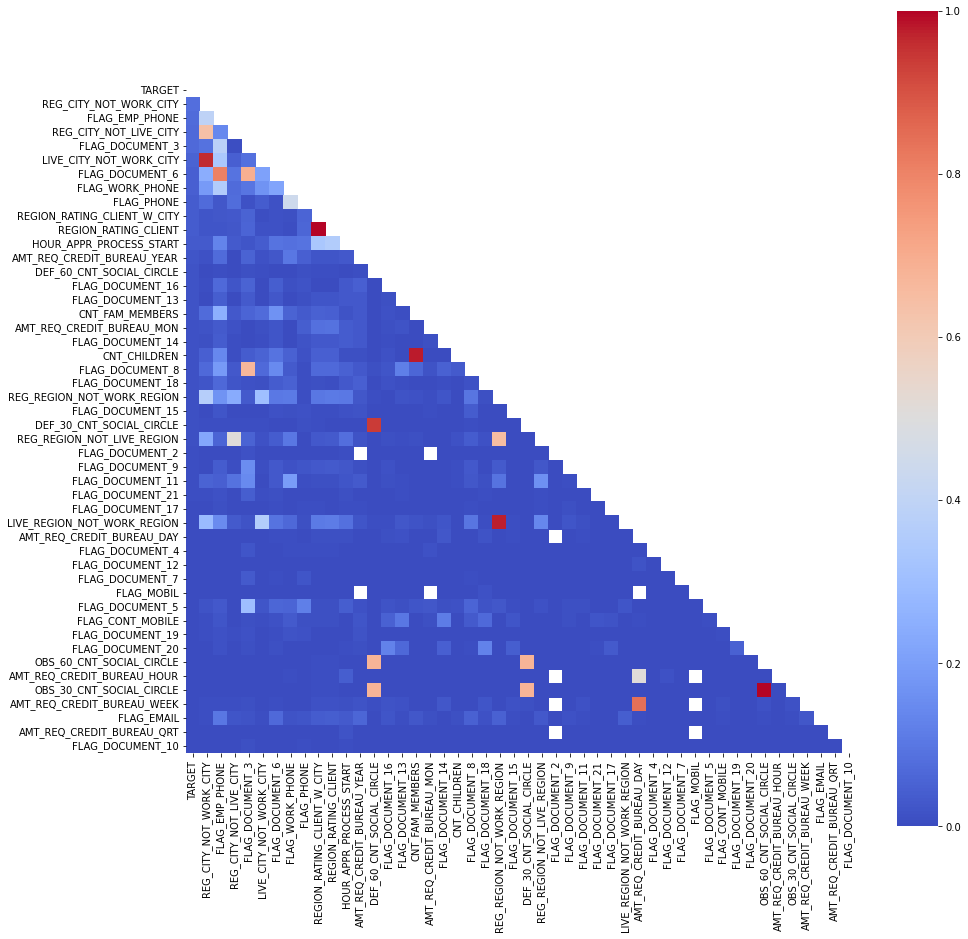

In [ ]:
mask = np.zeros_like(phik_matrix_int)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(15, 15))
sns.heatmap(
    phik_matrix_int,
    mask=mask,
    cmap='coolwarm',
    square=True,
    cbar=True
)
plt.tight_layout()
plt.show()


##### Pearson correlation

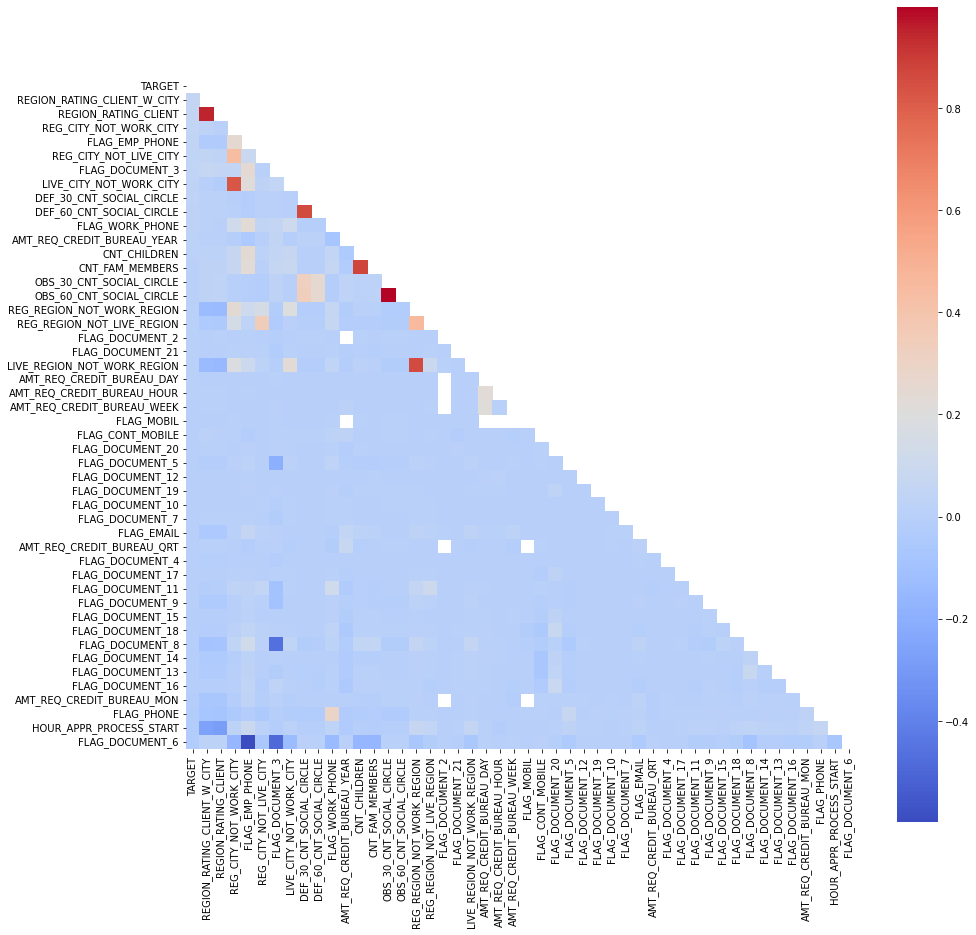

In [ ]:
mask = np.zeros_like(corr_int)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize = (15, 15))
sns.heatmap(corr_int,
            mask = mask,
            cmap='coolwarm',
            square=True,
            cbar=True);

#### Correlation between the target and the continuous features

##### $\phi_K$ correlation

In [ ]:
# features_float = application_train.select_dtypes(float).columns.tolist()
# phik_target_float = np.zeros(len(features_float))

# for idx, col in enumerate(features_float):
#   phik_target_float[idx] = application_train[['TARGET', col]].phik_matrix().iloc[0, 1]

env: JOBLIB_TEMP_FOLDER=/tmp
interval columns not set, guessing: ['TARGET', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVAT

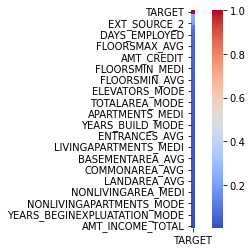

In [14]:
%env JOBLIB_TEMP_FOLDER = /tmp
phik_matrix_float = application_train[
    ['TARGET'] + application_train.select_dtypes('floating').columns.tolist()].phik_matrix()
idx = phik_matrix_float.sort_values(by='TARGET', ascending=False).index
phik_matrix_float = phik_matrix_float.loc[idx, idx]

sns.heatmap(
    phik_matrix_float['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True
);


In [ ]:
phik_matrix_float['TARGET'].to_frame().head(20).mul(100)[1:]

,TARGET
EXT_SOURCE_3,24.768009
EXT_SOURCE_1,21.784609
EXT_SOURCE_2,21.396527
DAYS_BIRTH,10.237817
DAYS_LAST_PHONE_CHANGE,7.321763
DAYS_EMPLOYED,7.209510
DAYS_ID_PUBLISH,6.776567
AMT_GOODS_PRICE,5.909383
FLOORSMAX_AVG,5.882633
FLOORSMAX_MEDI,5.859500


##### Pearson correlation

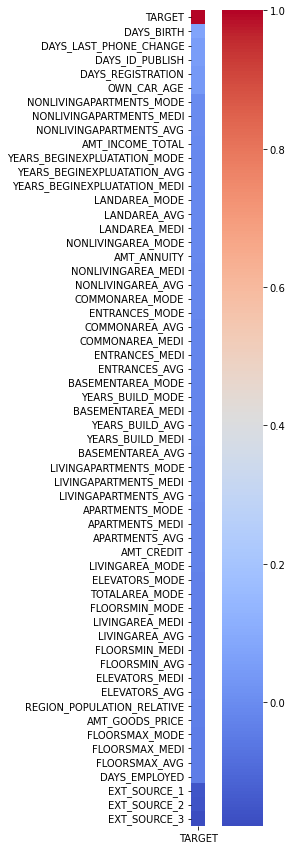

In [ ]:
corr_float = application_train[
    ['TARGET'] + application_train.select_dtypes('float').columns.tolist()].corr()
idx = corr_float.sort_values(by='TARGET', ascending=False).index
corr_float = corr_float.loc[idx, idx]

plt.figure(figsize=(6, 15))
sns.heatmap(
    corr_float['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True
);

In [ ]:
corr_float['TARGET'].nlargest(30).mul(100).to_frame()[1:]

,TARGET
DAYS_BIRTH,7.823931
DAYS_LAST_PHONE_CHANGE,5.521848
DAYS_ID_PUBLISH,5.145717
DAYS_REGISTRATION,4.197486
OWN_CAR_AGE,3.761156
NONLIVINGAPARTMENTS_MODE,-0.155656
NONLIVINGAPARTMENTS_MEDI,-0.275715
NONLIVINGAPARTMENTS_AVG,-0.317611
AMT_INCOME_TOTAL,-0.398187
YEARS_BEGINEXPLUATATION_MODE,-0.903645


In [ ]:
corr_float['TARGET'].nsmallest(30).mul(100).to_frame()

,TARGET
EXT_SOURCE_3,-17.891870
EXT_SOURCE_2,-16.047167
EXT_SOURCE_1,-15.531713
DAYS_EMPLOYED,-4.493166
FLOORSMAX_AVG,-4.400337
FLOORSMAX_MEDI,-4.376792
FLOORSMAX_MODE,-4.322626
AMT_GOODS_PRICE,-3.964528
REGION_POPULATION_RELATIVE,-3.722715
ELEVATORS_AVG,-3.419879


#### Correlations between the continuous features themselves

##### $\phi_K$ correlation

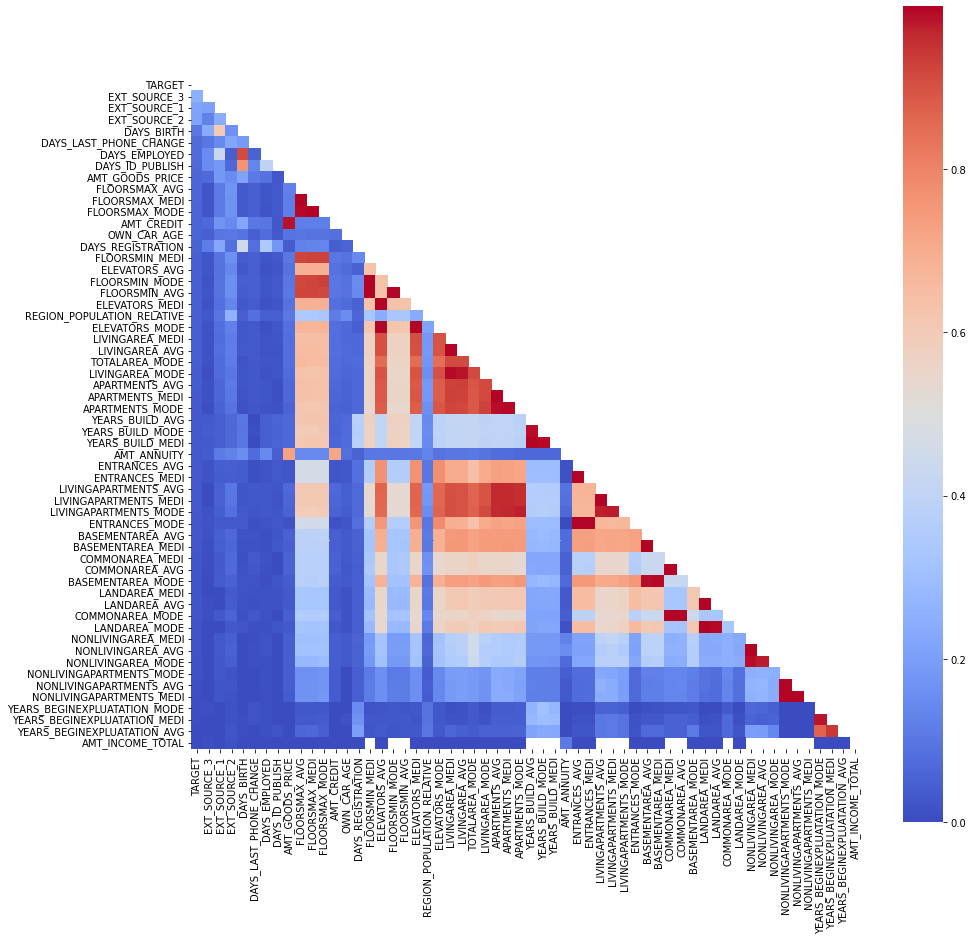

In [ ]:
mask = np.zeros_like(phik_matrix_float)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(15, 15))
sns.heatmap(
    phik_matrix_float,
    mask=mask,
    cmap='coolwarm',
    square=True
);

##### Pearson correlation

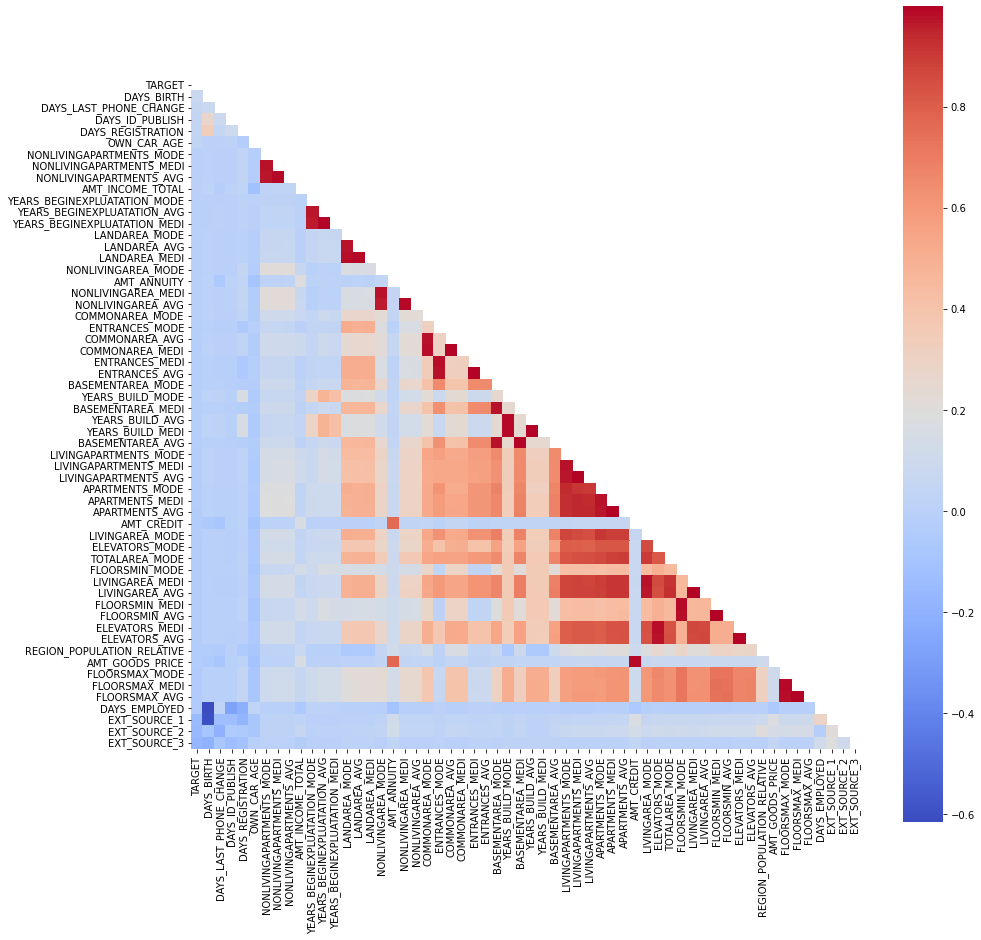

In [ ]:
mask = np.zeros_like(corr_float)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize = (15, 15))
sns.heatmap(corr_float,
            mask = mask,
            cmap='coolwarm',
            square=True,
            cbar=True);

## Data cleaning

### Day features

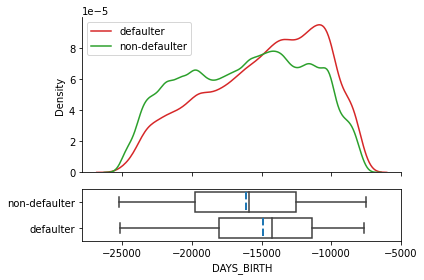

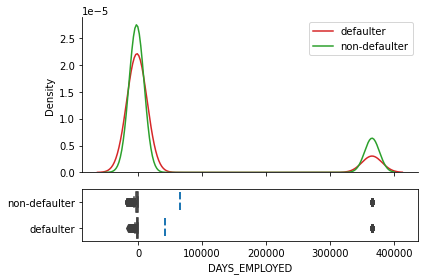

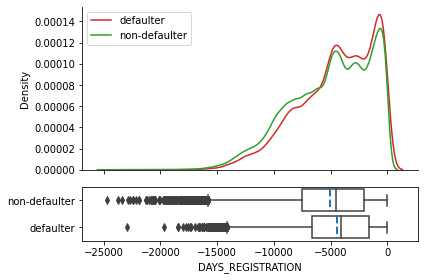

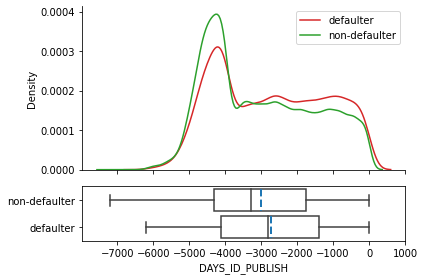

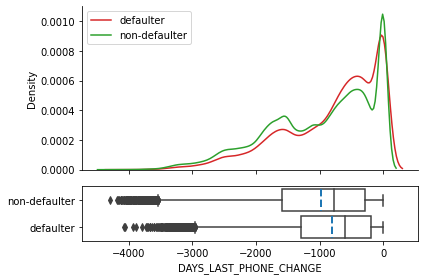

In [ ]:
for feat in (x for x in application_train.columns if 'DAYS' in x):
  plot_train_density_with_central_tendencies_by_target(application_train, feat)

#### Age in years

In [ ]:
# In order to being able to use the plotting function already available,
# the feature AGE_YEARS is created here, but actually it should have, and
# will be again, been defined later in the feature engineering section
application_train['AGE_YEARS'] = application_train['DAYS_BIRTH'].div(-365)

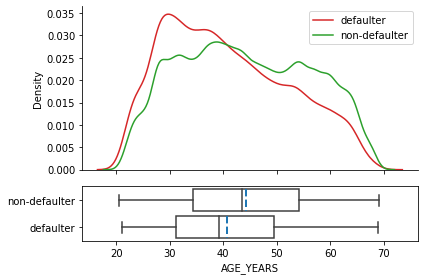

In [ ]:
plot_train_density_with_central_tendencies_by_target(application_train, 'AGE_YEARS')

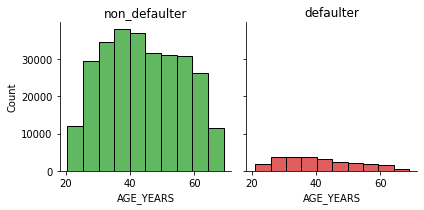

In [ ]:
ax = sns.FacetGrid(application_train,
                   col='TARGET',
                   hue='TARGET',
                   hue_kws=dict(color=['tab:green', 'tab:red']))
ax.map(sns.histplot, 'AGE_YEARS', bins=10)

axes = ax.axes.flatten()
axes[0].set_title('non_defaulter')
axes[1].set_title('defaulter');

#### Years employed

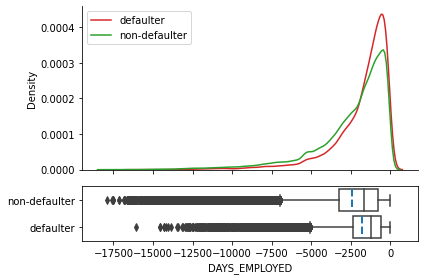

In [ ]:
plot_train_density_with_central_tendencies_by_target(application_train, 'DAYS_EMPLOYED')

In [ ]:
application_train.DAYS_EMPLOYED.describe()

count    252137.000000
mean      -2384.169325
std        2338.360162
min      -17912.000000
25%       -3175.000000
50%       -1648.000000
75%        -767.000000
max           0.000000
Name: DAYS_EMPLOYED, dtype: float64

In [ ]:
application_train[application_train.DAYS_EMPLOYED.gt(0)].DAYS_EMPLOYED.value_counts()

Series([], Name: DAYS_EMPLOYED, dtype: int64)

In [ ]:
days_employed_train_anom = application_train['TARGET'][application_train.DAYS_EMPLOYED.eq(365243)]
days_employed_train = application_train['TARGET'][application_train.DAYS_EMPLOYED.ne(365243)]

In [ ]:
print(f'The train non-anomalies default on {days_employed_train.mul(100).mean():.2f}% of loans')
print(f'The train anomalies default on {days_employed_train_anom.mul(100).mean():.2f}% of loans')
print(f'There are {days_employed_train_anom.shape[0]} train anomalous days of employment')

The train non-anomalies default on 8.66% of loans
The train anomalies default on 5.40% of loans
There are 55374 train anomalous days of employment


In [ ]:
# application_train['DAYS_EMPLOYED_ANOM'] = application_train.DAYS_EMPLOYED.eq(365243).astype(int)
application_train.DAYS_EMPLOYED.replace(365243, np.nan, inplace=True)

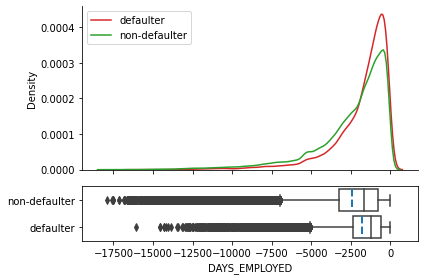

In [ ]:
plot_train_density_with_central_tendencies_by_target(application_train, 'DAYS_EMPLOYED')

In [ ]:
# In order to being able to use the plotting function already available,
# the feature YEARS_EMPLOYED is created here, but actually it should have, and
# will be again, been defined later in the feature engineering section
application_train['YEARS_EMPLOYED'] = application_train['DAYS_EMPLOYED'].div(-365)

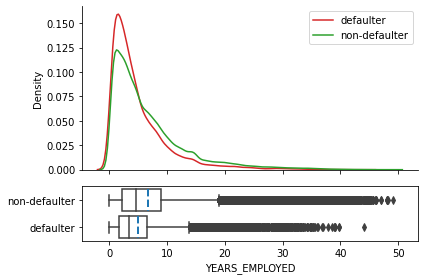

In [ ]:
plot_train_density_with_central_tendencies_by_target(application_train, 'YEARS_EMPLOYED')

In [ ]:
days_employed_anom_test = application_test.DAYS_EMPLOYED.eq(365243)
application_test.DAYS_EMPLOYED.replace(365243, np.nan, inplace = True)

In [ ]:
print(f'There are {days_employed_anom_test.sum()} anomalies '
f'in the test data out of {application_test.shape[0]} entries, '
f'namely {days_employed_anom_test.sum() / application_test.shape[0]:.2f}%')

There are 9274 anomalies in the test data out of 48744 entries, namely 0.19%


In [ ]:
features2drop = ['AGE_YEARS',
                 'YEARS_EMPLOYED']

application_train.drop(columns = features2drop, inplace=True)

### Social circle features

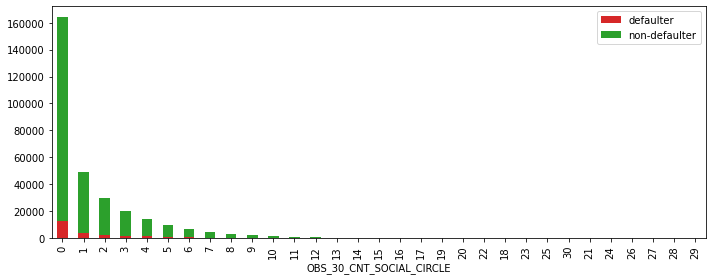

,defaulter,non-defaulter,total
OBS_30_CNT_SOCIAL_CIRCLE,,,
0,12950.0,150960,163910.0
1,3895.0,44888,48783.0
2,2458.0,27350,29808.0
3,1675.0,18647,20322.0
4,1248.0,12895,14143.0
5,797.0,8756,9553.0
6,565.0,5888,6453.0
7,411.0,3979,4390.0
8,246.0,2721,2967.0


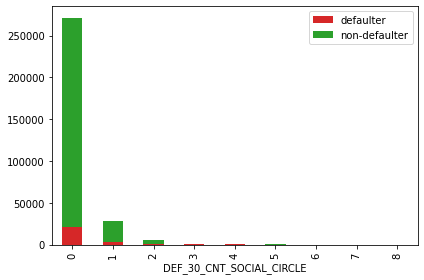

,defaulter,non-defaulter,total
DEF_30_CNT_SOCIAL_CIRCLE,,,
0,21098.0,250226,271324.0
1,2874.0,25454,28328.0
2,620.0,4703,5323.0
3,153.0,1039,1192.0
4,35.0,218,253.0
5,8.0,48,56.0
6,1.0,10,11.0
7,0.0,1,1.0
8,0.0,1,1.0


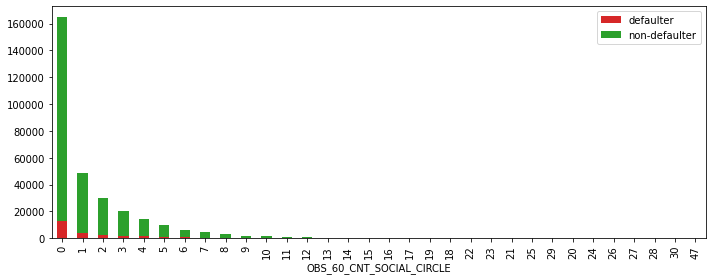

,defaulter,non-defaulter,total
OBS_60_CNT_SOCIAL_CIRCLE,,,
0,13021.0,151645,164666.0
1,3894.0,44976,48870.0
2,2448.0,27318,29766.0
3,1670.0,18545,20215.0
4,1232.0,12714,13946.0
5,798.0,8665,9463.0
6,565.0,5784,6349.0
7,391.0,3953,4344.0
8,240.0,2646,2886.0


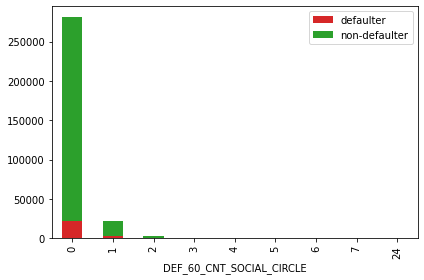

,defaulter,non-defaulter,total
DEF_60_CNT_SOCIAL_CIRCLE,,,
0,21994.0,258727,280721.0
1,2297.0,19544,21841.0
2,385.0,2785,3170.0
3,95.0,503,598.0
4,15.0,120,135.0
5,3.0,17,20.0
6,0.0,3,3.0
7,0.0,1,1.0
24,0.0,1,1.0


In [ ]:
for feat in (x for x in application_train.columns if 'SOCIAL_CIRCLE' in x):
  plot_train_bars_by_target(application_train, feat)

In [ ]:
application_train.loc[application_train.OBS_30_CNT_SOCIAL_CIRCLE > 30, 'OBS_30_CNT_SOCIAL_CIRCLE'] = np.nan
application_train.loc[application_train.DEF_30_CNT_SOCIAL_CIRCLE > 30, 'DEF_30_CNT_SOCIAL_CIRCLE'] = np.nan
application_train.loc[application_train.OBS_60_CNT_SOCIAL_CIRCLE > 60, 'OBS_60_CNT_SOCIAL_CIRCLE'] = np.nan
application_train.loc[application_train.DEF_60_CNT_SOCIAL_CIRCLE > 60, 'DEF_60_CNT_SOCIAL_CIRCLE'] = np.nan

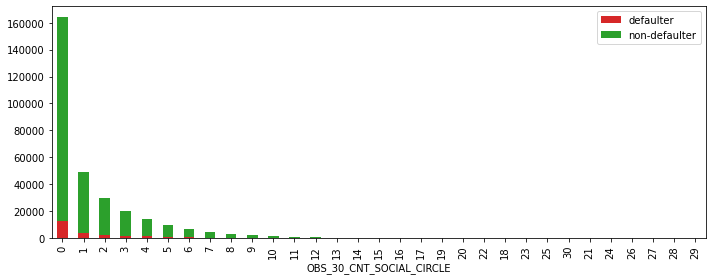

,defaulter,non-defaulter,total
OBS_30_CNT_SOCIAL_CIRCLE,,,
0,12950.0,150960,163910.0
1,3895.0,44888,48783.0
2,2458.0,27350,29808.0
3,1675.0,18647,20322.0
4,1248.0,12895,14143.0
5,797.0,8756,9553.0
6,565.0,5888,6453.0
7,411.0,3979,4390.0
8,246.0,2721,2967.0


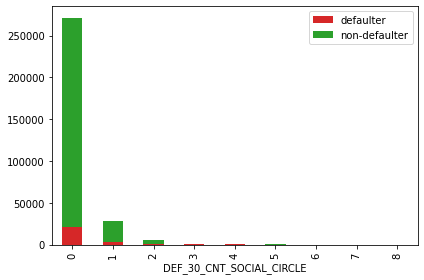

,defaulter,non-defaulter,total
DEF_30_CNT_SOCIAL_CIRCLE,,,
0,21098.0,250226,271324.0
1,2874.0,25454,28328.0
2,620.0,4703,5323.0
3,153.0,1039,1192.0
4,35.0,218,253.0
5,8.0,48,56.0
6,1.0,10,11.0
7,0.0,1,1.0
8,0.0,1,1.0


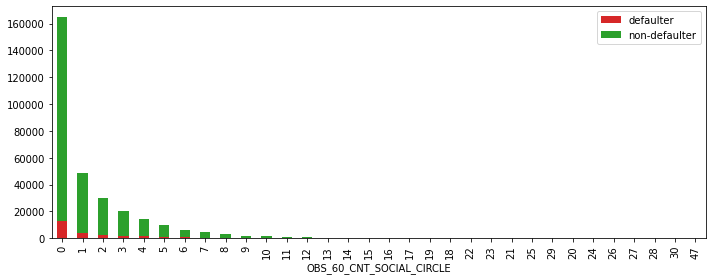

,defaulter,non-defaulter,total
OBS_60_CNT_SOCIAL_CIRCLE,,,
0,13021.0,151645,164666.0
1,3894.0,44976,48870.0
2,2448.0,27318,29766.0
3,1670.0,18545,20215.0
4,1232.0,12714,13946.0
5,798.0,8665,9463.0
6,565.0,5784,6349.0
7,391.0,3953,4344.0
8,240.0,2646,2886.0


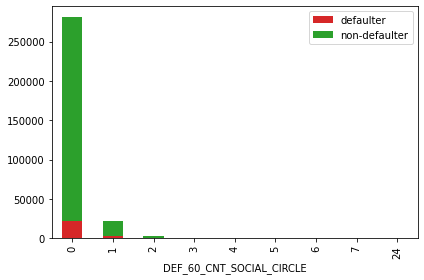

,defaulter,non-defaulter,total
DEF_60_CNT_SOCIAL_CIRCLE,,,
0,21994.0,258727,280721.0
1,2297.0,19544,21841.0
2,385.0,2785,3170.0
3,95.0,503,598.0
4,15.0,120,135.0
5,3.0,17,20.0
6,0.0,3,3.0
7,0.0,1,1.0
24,0.0,1,1.0


In [ ]:
for feat in (x for x in application_train.columns if 'SOCIAL_CIRCLE' in x):
  plot_train_bars_by_target(application_train, feat)

# Bureau

## Data import

In [11]:
bureau = reduce_memory_usage(
    pd.read_csv(
        'data/bureau.csv'
    ),
    floating=False,
    verbose=True
)

Initial memory usage of the dataframe: 222.62 MB
Final memory usage, after optimization: 171.88 MB
Decreased by 22.79%


## Data overview

In [ ]:
bureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int32  
 1   SK_ID_BUREAU            int32  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int16  
 5   CREDIT_DAY_OVERDUE      int16  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int8   
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int32  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int16(2), int32(3), int8(1), object(3)
memory usage: 171.9+ MB


In [ ]:
bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


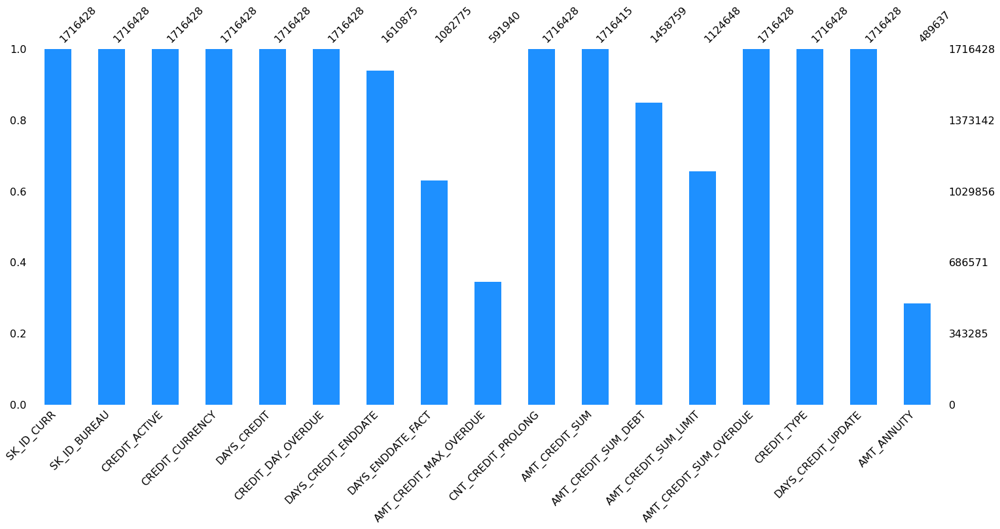

In [ ]:
msno.bar(bureau, color='dodgerblue');

## Identifiers

In [5]:
# If some loan identifiers are counted more than once, aggregation for the table would be required
bureau['SK_ID_CURR'].value_counts()


120860    116
169704     94
318065     78
251643     61
425396     60
         ... 
405288      1
413028      1
288569      1
215224      1
235871      1
Name: SK_ID_CURR, Length: 305811, dtype: int64

In [9]:
# Check if the credit bureau identifier is unique for each loan
len(bureau) == bureau['SK_ID_BUREAU'].nunique()

True

## Feature types

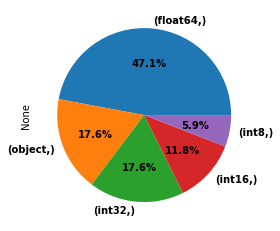

In [ ]:
bureau.dtypes.value_counts().plot.pie(
    autopct='%.1f%%',
    textprops=dict(weight='bold')
);

## Merging with the target feature

In [12]:
bureau_target = application_train[['SK_ID_CURR', 'TARGET']].merge(
    bureau,
    on='SK_ID_CURR',
    how='left'
)

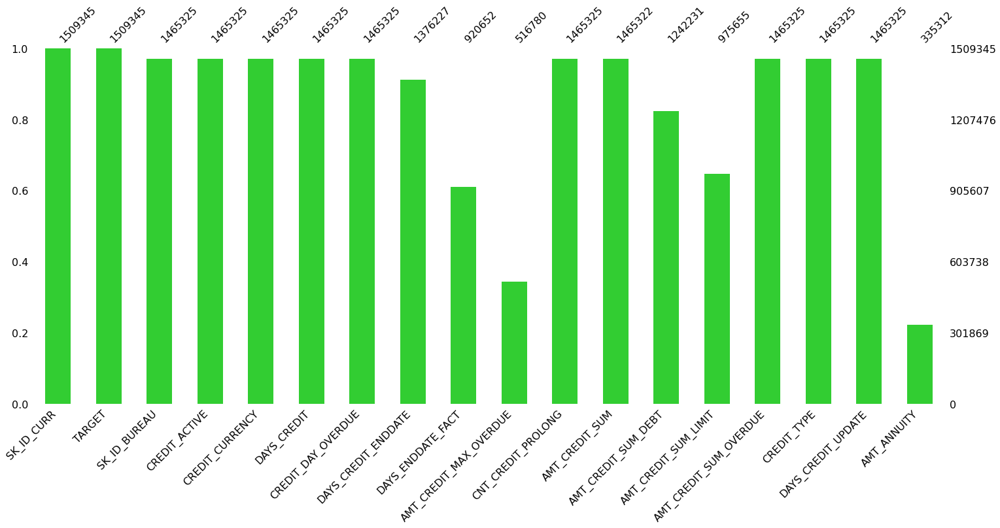

In [13]:
msno.bar(bureau_target, color='limegreen');

## Feature analysis

### Type conversion

In [ ]:
for feat in (x for x in bureau.columns if 'DAY' in x):
  print(bureau[feat].dtype)

int16
int16
float64
float64
int32


In [ ]:
# Convert the day features into variables of float type
for feat in (x for x in bureau.columns if 'DAY' in x):
    bureau[feat] = bureau[feat].astype(float)
    bureau_target[feat] = bureau_target[feat].astype(float)


In [ ]:
bureau_target['CNT_CREDIT_PROLONG'].dtype

dtype('float64')

In [ ]:
# Convert the following feature into variables of the nullable integer type
bureau['CNT_CREDIT_PROLONG'] = bureau['CNT_CREDIT_PROLONG'].astype('Int64')
bureau_target['CNT_CREDIT_PROLONG'] = bureau_target['CNT_CREDIT_PROLONG'].astype('Int64')

In [ ]:
bureau_target['SK_ID_BUREAU'].dtype

dtype('float64')

In [ ]:
# Convert the following feature into variables of the nullable integer type
bureau['SK_ID_BUREAU'] = bureau['SK_ID_BUREAU'].astype('Int64')
bureau_target['SK_ID_BUREAU'] = bureau_target['SK_ID_BUREAU'].astype('Int64')

### Categorical features

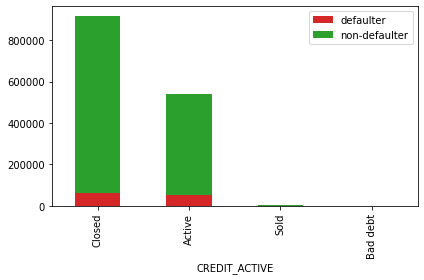

,defaulter,non-defaulter,total
CREDIT_ACTIVE,,,
Closed,63609.0,854124,917733.0
Active,50336.0,491583,541919.0
Sold,571.0,5082,5653.0
Bad debt,4.0,16,20.0


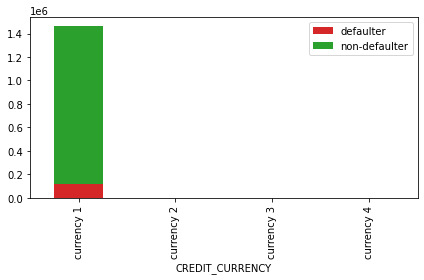

,defaulter,non-defaulter,total
CREDIT_CURRENCY,,,
currency 1,114454.0,1349640,1464094.0
currency 2,49.0,1023,1072.0
currency 3,17.0,133,150.0
currency 4,0.0,9,9.0


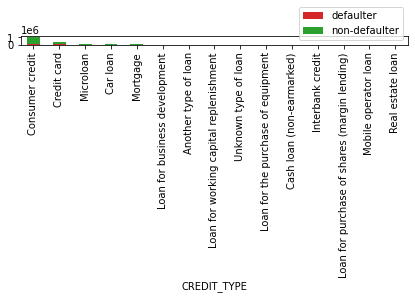

,defaulter,non-defaulter,total
CREDIT_TYPE,,,
Consumer credit,80046.0,989564,1069610.0
Credit card,30262.0,313591,343853.0
Microloan,1859.0,7146,9005.0
Car loan,1324.0,22433,23757.0
Mortgage,780.0,14827,15607.0
Loan for business development,106.0,1615,1721.0
Another type of loan,61.0,793,854.0
Loan for working capital replenishment,48.0,329,377.0
Unknown type of loan,29.0,443,472.0


In [ ]:
for feat in bureau.select_dtypes('object').columns:
  plot_train_bars_by_target(bureau_target, feat)

### Discrete features

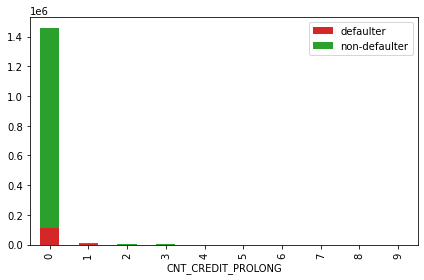

,defaulter,non-defaulter,total
CNT_CREDIT_PROLONG,,,
0,113750.0,1342755,1456505.0
1,656.0,6707,7363.0
2,105.0,1084,1189.0
3,7.0,182,189.0
4,2.0,51,53.0
5,0.0,20,20.0
6,0.0,2,2.0
7,0.0,1,1.0
8,0.0,1,1.0


In [ ]:
plot_train_bars_by_target(bureau_target, 'CNT_CREDIT_PROLONG')

### Continuous features, or very numerous discrete ones with large values

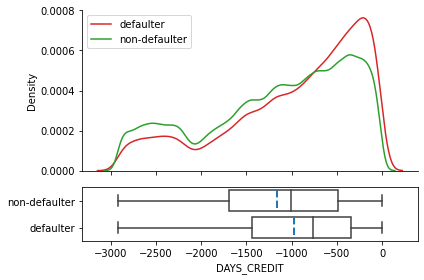

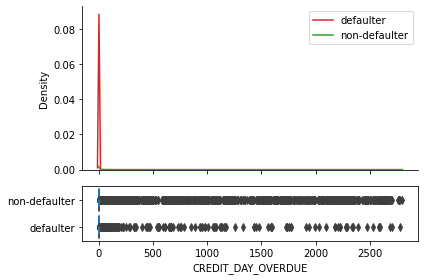

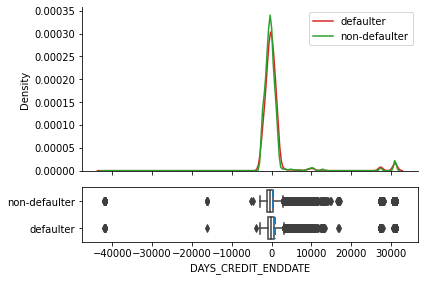

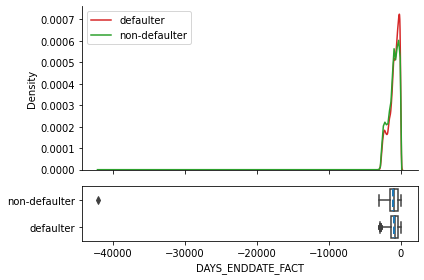

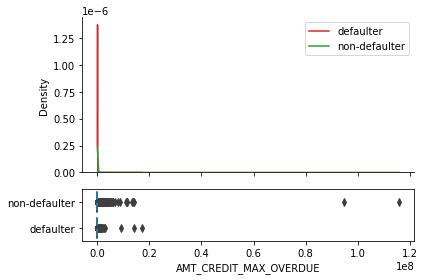

...

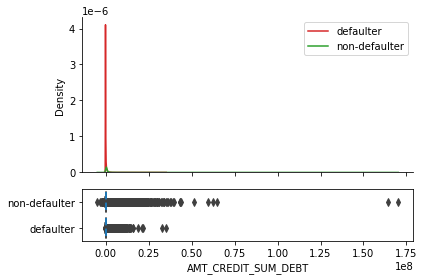

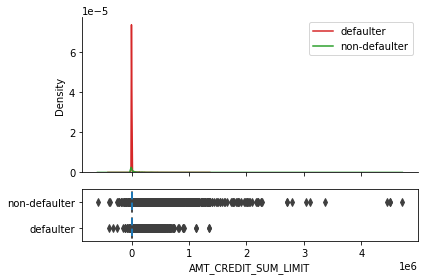

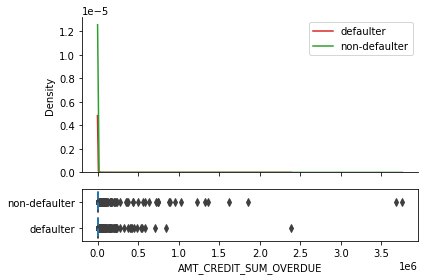

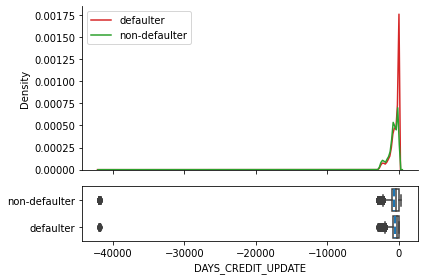

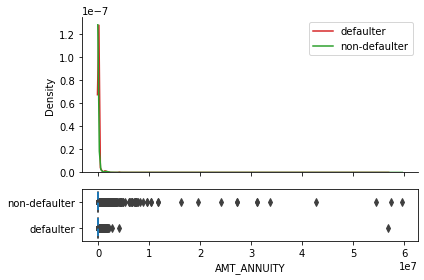

In [ ]:
for feat in bureau_target.select_dtypes('floating').columns:
  plot_train_density_with_central_tendencies_by_target(bureau_target, feat)

### Correlations

#### $\phi_K$ correlation

 ##### Between the target and the categorical features

interval columns not set, guessing: ['TARGET']


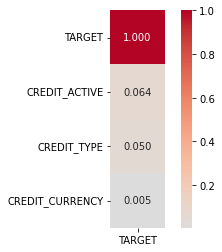

In [ ]:
phik_matrix_cat = bureau_target[['TARGET'] +\
                                bureau_target.select_dtypes('object')\
                                             .columns.tolist()].phik_matrix()
idx = phik_matrix_cat.sort_values(by='TARGET',
                                  ascending=False).index
phik_matrix_cat = phik_matrix_cat.loc[idx, idx]

sns.heatmap(phik_matrix_cat['TARGET'].to_frame(),
            cmap='coolwarm',
            square=True,
            center=0,
            fmt='.3f',
            annot=True);

In [ ]:
phik_matrix_cat['TARGET'].to_frame().head().mul(100)[1:]

,TARGET
CREDIT_ACTIVE,6.448114
CREDIT_TYPE,4.995449
CREDIT_CURRENCY,0.499339


##### Between the categorical features themselves

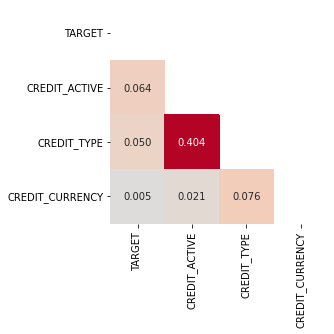

In [ ]:
mask = np.zeros_like(phik_matrix_cat)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(phik_matrix_cat,
            mask = mask,
            cmap='coolwarm',
            square=True,
            center=0,
            fmt='.3f',
            annot=True,
            cbar=False);

#### Correlations between the target and the discrete features

##### $\phi_K$ correlation

interval columns not set, guessing: ['TARGET', 'CNT_CREDIT_PROLONG']


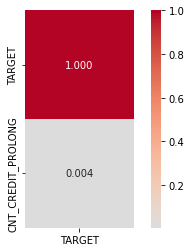

In [ ]:
phik_matrix_int = bureau_target[bureau_target.select_dtypes('integer').columns]\
                                             .drop(columns = ['SK_ID_CURR',
                                                              'SK_ID_BUREAU']).phik_matrix()
idx = phik_matrix_int.sort_values(by='TARGET',
                                  ascending=False).index
phik_matrix_int = phik_matrix_int.loc[idx, idx]

sns.heatmap(phik_matrix_int['TARGET'].to_frame(),
            cmap='coolwarm',
            square=True,          
            center=0,
            fmt='.3f',
            annot=True);

In [ ]:
phik_matrix_int['TARGET'].to_frame().head().mul(100)[1:]

,TARGET
CNT_CREDIT_PROLONG,0.386188


##### Pearson correlation

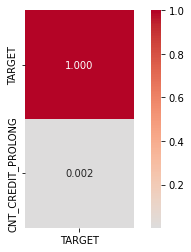

In [ ]:
corr_int = bureau_target[bureau_target.select_dtypes('integer').columns]\
                                      .drop(columns = ['SK_ID_CURR',
                                                       'SK_ID_BUREAU']).corr()
idx = corr_int.sort_values(by='TARGET',
                           ascending=False).index
corr_int = corr_int.loc[idx, idx]

sns.heatmap(corr_int['TARGET'].to_frame(),
            cmap='coolwarm',
            square=True,
            center=0,
            fmt='.3f',
            annot=True);

In [ ]:
corr_int['TARGET'].head().mul(100).to_frame()[1:]

,TARGET
CNT_CREDIT_PROLONG,0.152329


#### Correlations between the discrete features themselves

##### $\phi_K$ correlation

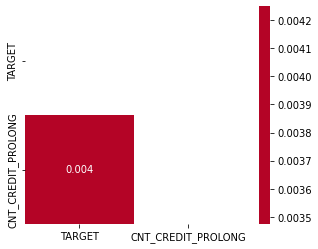

In [ ]:
mask = np.zeros_like(phik_matrix_int)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(phik_matrix_int,
            mask = mask,
            cmap='coolwarm',
            square=True,
            center=0,
            fmt='.3f',
            annot=True);

##### Pearson correlation

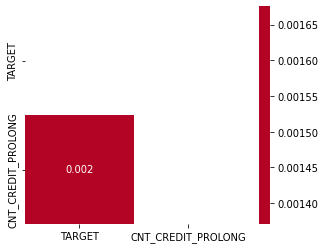

In [ ]:
mask = np.zeros_like(corr_int)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(corr_int,
            mask = mask,
            cmap='coolwarm',
            square=True,
            center=0,
            fmt='.3f',
            annot=True);

#### Correlation between the target and the continuous features

##### $\phi_K$ correlation

env: JOBLIB_TEMP_FOLDER=/tmp
interval columns not set, guessing: ['TARGET', 'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'DAYS_CREDIT_UPDATE', 'AMT_ANNUITY']


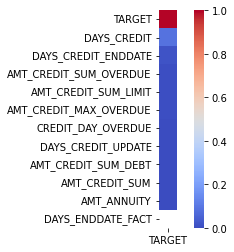

In [ ]:
%env JOBLIB_TEMP_FOLDER=/tmp
phik_matrix_float = bureau_target[['TARGET']\
                                  + bureau_target.select_dtypes('floating')
                                                 .columns.tolist()].phik_matrix()
idx = phik_matrix_float.sort_values(by='TARGET',
                                    ascending=False).index
phik_matrix_float = phik_matrix_float.loc[idx, idx]

sns.heatmap(phik_matrix_float['TARGET'].to_frame(), 
            cmap='coolwarm',
            square=True);

In [ ]:
phik_matrix_float['TARGET'].to_frame().head(20).mul(100)[1:]

,TARGET
DAYS_CREDIT,8.865056
DAYS_CREDIT_ENDDATE,1.898024
AMT_CREDIT_SUM_OVERDUE,0.565368
AMT_CREDIT_SUM_LIMIT,0.519228
AMT_CREDIT_MAX_OVERDUE,0.428034
CREDIT_DAY_OVERDUE,0.252797
DAYS_CREDIT_UPDATE,0.221926
AMT_CREDIT_SUM_DEBT,0.169506
AMT_CREDIT_SUM,0.067001
AMT_ANNUITY,0.000000


##### Pearson correlation

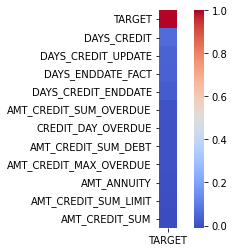

In [ ]:
corr_float = bureau_target[['TARGET'] + bureau_target.select_dtypes('float')\
                                                     .columns.tolist()].corr()
idx = corr_float.sort_values(by='TARGET',
                             ascending=False).index
corr_float = corr_float.loc[idx, idx]

sns.heatmap(corr_float['TARGET'].to_frame(),
            cmap='coolwarm',            
            square=True);

In [ ]:
corr_float['TARGET'].nlargest(20).mul(100).to_frame()[1:]

,TARGET
DAYS_CREDIT,6.155580
DAYS_CREDIT_UPDATE,4.107639
DAYS_ENDDATE_FACT,3.905694
DAYS_CREDIT_ENDDATE,2.649661
AMT_CREDIT_SUM_OVERDUE,0.625341
CREDIT_DAY_OVERDUE,0.265187
AMT_CREDIT_SUM_DEBT,0.253927
AMT_CREDIT_MAX_OVERDUE,0.158665
AMT_ANNUITY,0.011673
AMT_CREDIT_SUM_LIMIT,-0.599000


#### Correlations between the continuous features themselves

##### $\phi_K$ correlation

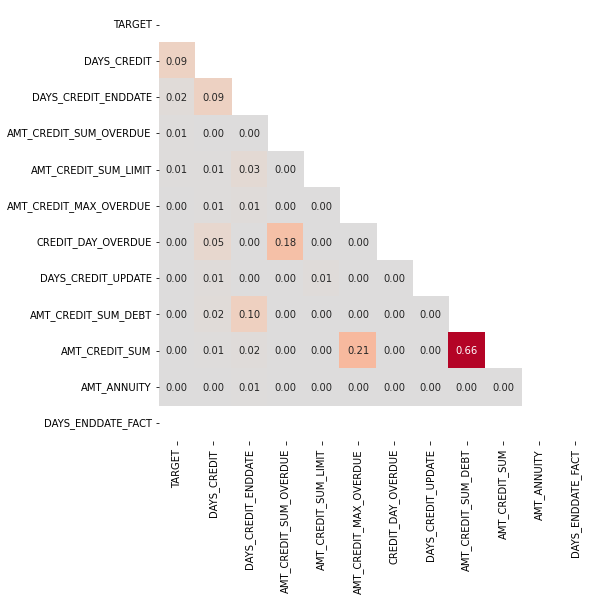

In [ ]:
mask = np.zeros_like(phik_matrix_float)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize = (8, 8))
sns.heatmap(phik_matrix_float,
            mask = mask,
            cmap='coolwarm',
            square=True,
            center=0,
            fmt='.2f',
            annot=True,
            cbar=False);

##### Pearson correlation

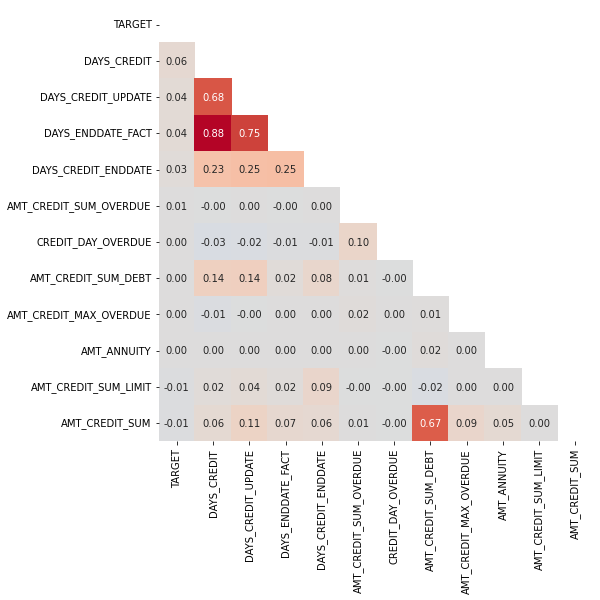

In [ ]:
mask = np.zeros_like(corr_float)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize = (8, 8))
sns.heatmap(corr_float,
            mask = mask,
            cmap='coolwarm',
            square=True,            
            center=0,
            fmt='.2f',
            annot=True,
            cbar=False);

## Data cleaning

### Day features

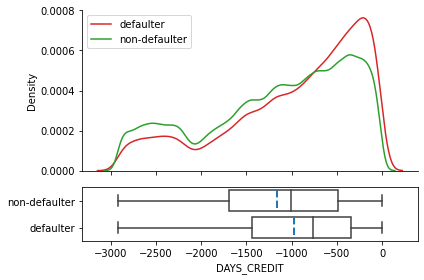

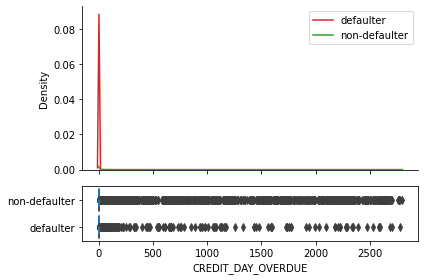

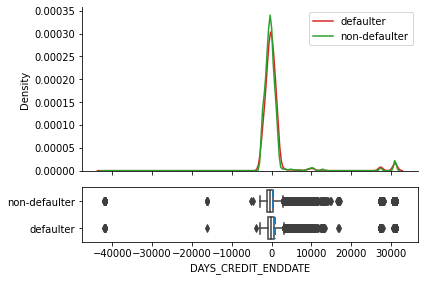

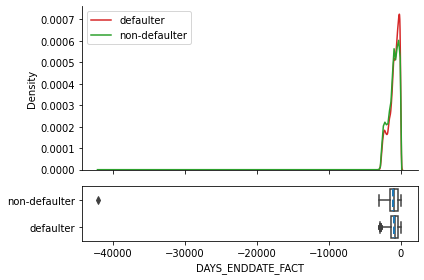

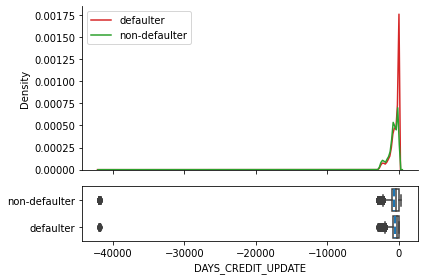

In [ ]:
for feat in (x for x in bureau_target.columns if 'DAY' in x):  
  plot_train_density_with_central_tendencies_by_target(bureau_target, feat)

In [ ]:
bureau_target['YEARS_CREDIT_ENDDATE'] = bureau_target.DAYS_CREDIT_ENDDATE.div(365)
bureau_target['YEARS_ENDDATE_FACT'] = bureau_target.DAYS_CREDIT_ENDDATE.div(365)
bureau_target['YEARS_CREDIT_UPDATE'] = bureau_target.DAYS_CREDIT_UPDATE.div(365)

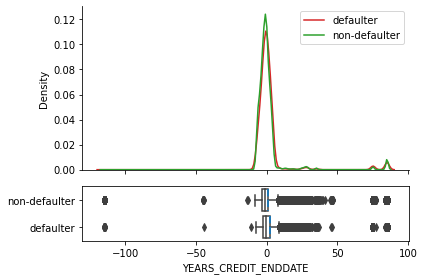

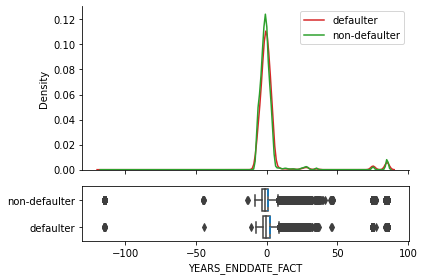

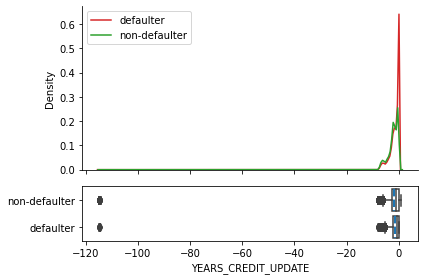

In [ ]:
plot_train_density_with_central_tendencies_by_target(bureau_target, 'YEARS_CREDIT_ENDDATE')
plot_train_density_with_central_tendencies_by_target(bureau_target, 'YEARS_ENDDATE_FACT')
plot_train_density_with_central_tendencies_by_target(bureau_target, 'YEARS_CREDIT_UPDATE')

In [ ]:
bureau_target.DAYS_CREDIT_ENDDATE.describe()

count    1.376227e+06
mean     4.931322e+02
std      4.964905e+03
min     -4.206000e+04
25%     -1.144000e+03
50%     -3.340000e+02
75%      4.730000e+02
max      3.119900e+04
Name: DAYS_CREDIT_ENDDATE, dtype: float64

In [ ]:
bureau_target[bureau_target.DAYS_CREDIT_ENDDATE.lt(-36500)].DAYS_CREDIT_ENDDATE.nunique()

57

In [ ]:
bureau_target.DAYS_CREDIT_UPDATE.describe()

count    1.465325e+06
mean    -5.997869e+02
std      7.371010e+02
min     -4.194700e+04
25%     -9.040000e+02
50%     -4.060000e+02
75%     -3.300000e+01
max      3.720000e+02
Name: DAYS_CREDIT_UPDATE, dtype: float64

In [ ]:
bureau_target[bureau_target.DAYS_CREDIT_UPDATE.lt(-36500)].DAYS_CREDIT_UPDATE.nunique()

59

In [ ]:
bureau_target.DAYS_ENDDATE_FACT.describe()

count    920652.000000
mean      -1022.765286
std         718.371749
min      -42023.000000
25%       -1503.000000
50%        -900.000000
75%        -427.000000
max           0.000000
Name: DAYS_ENDDATE_FACT, dtype: float64

In [ ]:
bureau_target[bureau_target.DAYS_ENDDATE_FACT.lt(-36500)].DAYS_ENDDATE_FACT.value_counts()

-42023.0    1
Name: DAYS_ENDDATE_FACT, dtype: int64

In [ ]:
bureau_target[bureau_target.DAYS_ENDDATE_FACT.lt(-36500)].DAYS_CREDIT_UPDATE.value_counts()

-2196.0    1
Name: DAYS_CREDIT_UPDATE, dtype: int64

In [ ]:
# Erase faulty values in the original table
bureau.DAYS_CREDIT_ENDDATE.mask(bureau.DAYS_CREDIT_ENDDATE.lt(-36500), np.nan, inplace=True)
bureau.DAYS_ENDDATE_FACT.mask(bureau.DAYS_ENDDATE_FACT.lt(-36500), np.nan, inplace=True)
bureau.DAYS_CREDIT_UPDATE.mask(bureau.DAYS_CREDIT_UPDATE.lt(-36500), np.nan, inplace=True)

In [ ]:
# Erase faulty values in the merged table
bureau_target.DAYS_CREDIT_ENDDATE.mask(bureau_target.DAYS_CREDIT_ENDDATE.lt(-36500), np.nan, inplace=True)
bureau_target.DAYS_ENDDATE_FACT.mask(bureau_target.DAYS_ENDDATE_FACT.lt(-36500), np.nan, inplace=True)
bureau_target.DAYS_CREDIT_UPDATE.mask(bureau_target.DAYS_CREDIT_UPDATE.lt(-36500), np.nan, inplace=True)

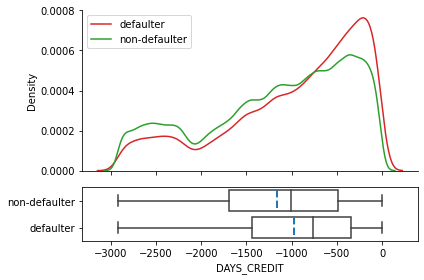

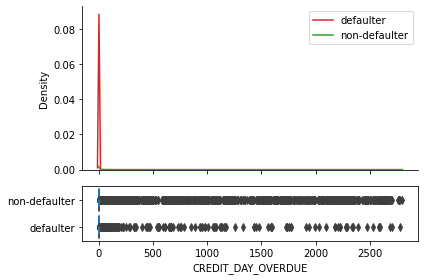

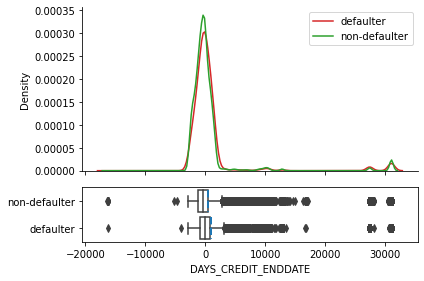

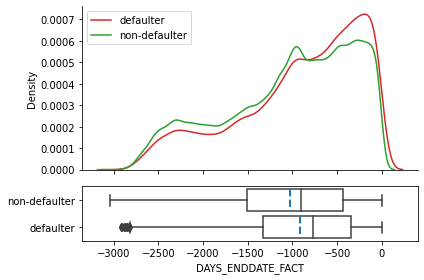

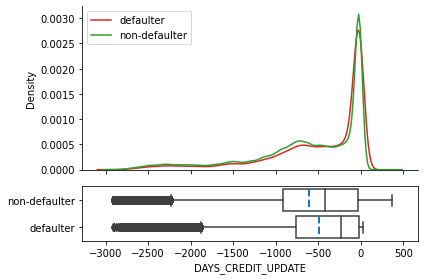

In [ ]:
for feat in (x for x in bureau_target.columns if 'DAY' in x):  
  plot_train_density_with_central_tendencies_by_target(bureau_target, feat)

# Bureau balance

## Data import

In [4]:
bureau_balance = reduce_memory_usage(
    pd.read_csv(
        'data/bureau_balance.csv'
    ),
    floating=False,
    verbose=True
)

Initial memory usage of the dataframe: 624.85 MB
Final memory usage, after optimization: 338.46 MB
Decreased by 45.83%


## Data overview

In [ ]:
bureau_balance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int32 
 1   MONTHS_BALANCE  int8  
 2   STATUS          object
dtypes: int32(1), int8(1), object(1)
memory usage: 338.5+ MB


In [ ]:
bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


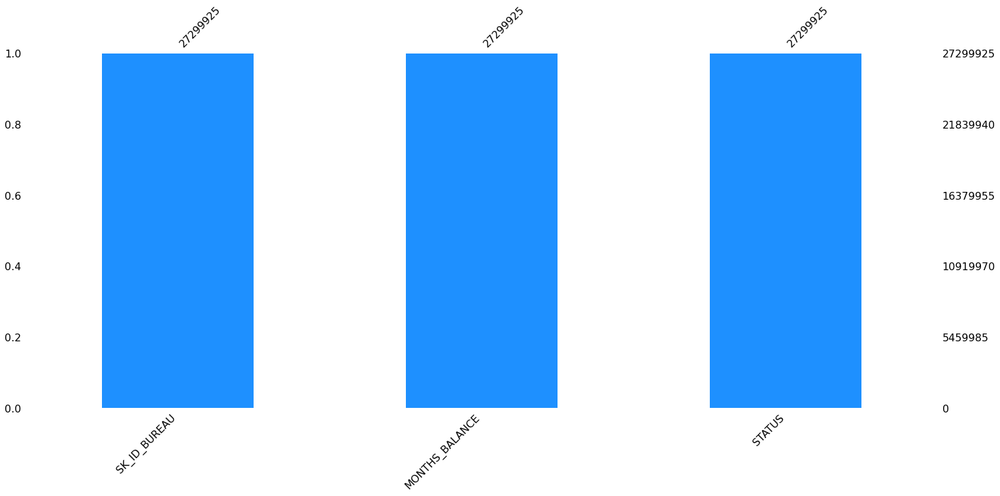

In [ ]:
msno.bar(bureau_balance, color='dodgerblue');

## Identifiers

In [13]:
# If some credit bureau identifiers are counted more than once, aggregation for the table would be required
bureau_balance['SK_ID_BUREAU'].value_counts()

5645521    97
6733619    97
6176606    97
6321834    97
6356432    97
           ..
6212548     1
5819605     1
5626301     1
5626300     1
6803532     1
Name: SK_ID_BUREAU, Length: 817395, dtype: int64

## Feature types

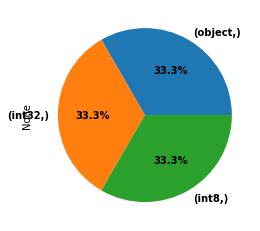

In [ ]:
bureau_balance.dtypes.value_counts().plot.pie(
    autopct='%.1f%%',
    textprops=dict(weight='bold')
);

## Merging with the target feature

In [6]:
# Type conversion in order to merge
bureau_balance.SK_ID_BUREAU = bureau_balance.SK_ID_BUREAU.astype('Int64')

In [7]:
bureau_balance_target = bureau_target[['SK_ID_BUREAU', 'TARGET']].merge(
    bureau_balance,
    on='SK_ID_BUREAU',
    how='left'
)

NameError: name 'bureau_target' is not defined

In [ ]:
msno.bar(bureau_balance_target, color='limegreen');

## Feature analysis

### Categorical features

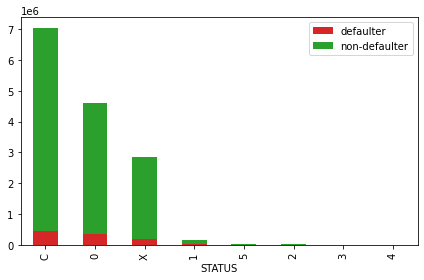

,defaulter,non-defaulter,total
STATUS,,,
C,449189.0,6578386,7027575.0
0,350262.0,4265422,4615684.0
X,197551.0,2639488,2837039.0
1,15900.0,139430,155330.0
5,4615.0,35913,40528.0
2,1620.0,13963,15583.0
3,677.0,5299,5976.0
4,467.0,3430,3897.0


In [ ]:
plot_train_bars_by_target(bureau_balance_target, 'STATUS')

### Continuous features, or very numerous discrete ones with large values

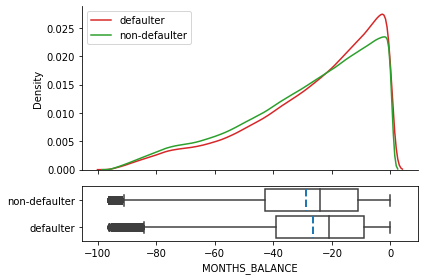

In [ ]:
plot_train_density_with_central_tendencies_by_target(bureau_balance_target, 'MONTHS_BALANCE')

### Correlations

#### $\phi_K$ correlation

 ##### Between the target and the categorical features

interval columns not set, guessing: ['TARGET']


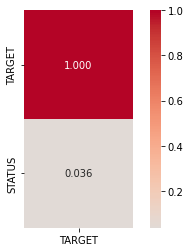

In [ ]:
phik_matrix_cat = bureau_balance_target[['TARGET',
                                         'STATUS']].phik_matrix()
idx = phik_matrix_cat.sort_values(by='TARGET',
                                  ascending=False).index
phik_matrix_cat = phik_matrix_cat.loc[idx, idx]

sns.heatmap(phik_matrix_cat['TARGET'].to_frame(),
            cmap='coolwarm',
            square=True,
            center=0,
            fmt='.3f',
            annot=True);

In [ ]:
phik_matrix_cat['TARGET'].to_frame().head().mul(100)[1:]

,TARGET
STATUS,3.602175


#### Correlation between the target and the continuous features

##### $\phi_K$ correlation

env: JOBLIB_TEMP_FOLDER=/tmp
interval columns not set, guessing: ['TARGET', 'MONTHS_BALANCE']


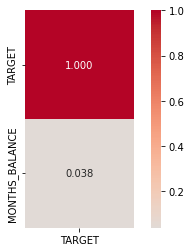

In [ ]:
%env JOBLIB_TEMP_FOLDER=/tmp
phik_matrix_float = bureau_balance_target[['TARGET',
                                           'MONTHS_BALANCE']].phik_matrix()
idx = phik_matrix_float.sort_values(by='TARGET',
                                    ascending=False).index
phik_matrix_float = phik_matrix_float.loc[idx, idx]

sns.heatmap(phik_matrix_float['TARGET'].to_frame(), 
            cmap='coolwarm',            
            square=True,
            center=0,
            fmt='.3f',
            annot=True);

In [ ]:
phik_matrix_float['TARGET'].to_frame().head().mul(100)[1:]

,TARGET
MONTHS_BALANCE,3.787023


##### Pearson correlation

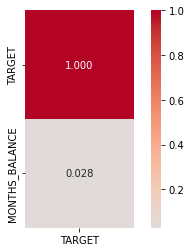

In [ ]:
corr_float = bureau_balance_target[['TARGET',
                                    'MONTHS_BALANCE']].corr()
idx = corr_float.sort_values(by='TARGET',
                             ascending=False).index
corr_float = corr_float.loc[idx, idx]

sns.heatmap(corr_float['TARGET'].to_frame(),
            cmap='coolwarm',            
            square=True,
            center=0,
            fmt='.3f',
            annot=True);

In [ ]:
corr_float['TARGET'].nlargest(20).mul(100).to_frame()[1:]

,TARGET
MONTHS_BALANCE,2.777265


In [ ]:
del bureau_balance, bureau_balance_target
gc.collect()

280

# Credit card balance

## Data import

In [115]:
credit_card_balance = reduce_memory_usage(
    pd.read_csv(
        'data/credit_card_balance.csv'
    ).drop(columns='SK_ID_PREV'), # The previous credit identifier won't be used
    floating=False,
    verbose=True
)

Initial memory usage of the dataframe: 644.58 MB
Final memory usage, after optimization: 523.72 MB
Decreased by 18.75%


## Data overview

In [116]:
credit_card_balance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 22 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_CURR                  int32  
 1   MONTHS_BALANCE              int8   
 2   AMT_BALANCE                 float64
 3   AMT_CREDIT_LIMIT_ACTUAL     int32  
 4   AMT_DRAWINGS_ATM_CURRENT    float64
 5   AMT_DRAWINGS_CURRENT        float64
 6   AMT_DRAWINGS_OTHER_CURRENT  float64
 7   AMT_DRAWINGS_POS_CURRENT    float64
 8   AMT_INST_MIN_REGULARITY     float64
 9   AMT_PAYMENT_CURRENT         float64
 10  AMT_PAYMENT_TOTAL_CURRENT   float64
 11  AMT_RECEIVABLE_PRINCIPAL    float64
 12  AMT_RECIVABLE               float64
 13  AMT_TOTAL_RECEIVABLE        float64
 14  CNT_DRAWINGS_ATM_CURRENT    float64
 15  CNT_DRAWINGS_CURRENT        int16  
 16  CNT_DRAWINGS_OTHER_CURRENT  float64
 17  CNT_DRAWINGS_POS_CURRENT    float64
 18  CNT_INSTALMENT_MATURE_CUM   float64
 19  NAME_CONTRACT_STATUS 

In [117]:
credit_card_balance.head()

,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.0,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.0,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.0,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


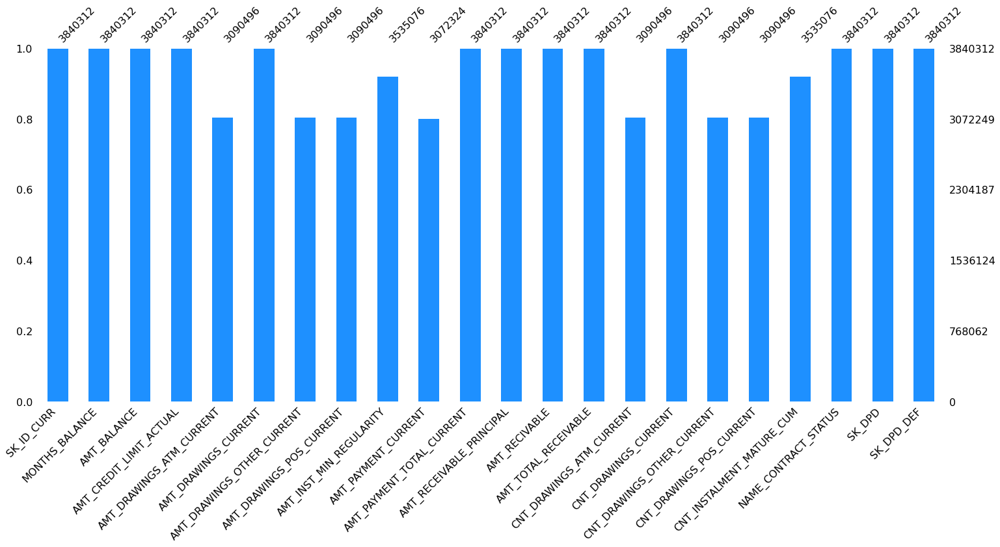

In [118]:
msno.bar(credit_card_balance, color='dodgerblue');

## Indentifiers

In [119]:
# If some loan indices are counted more than once, aggregation for the table would be required
credit_card_balance['SK_ID_CURR'].value_counts()

186401    192
311118    178
120076    140
128827    129
191826    128
         ... 
430884      1
354403      1
327067      1
336149      1
382749      1
Name: SK_ID_CURR, Length: 103558, dtype: int64

## Feature types

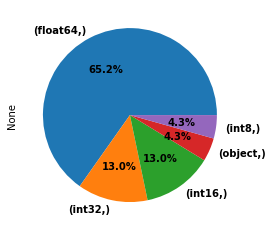

In [19]:
credit_card_balance.dtypes.value_counts().plot.pie(
    autopct='%.1f%%',
    textprops=dict(weight='bold')
);

## Merging with the target feature

In [20]:
credit_card_balance_target = application_train[['SK_ID_CURR', 'TARGET']].merge(
    credit_card_balance,
    on='SK_ID_CURR',
    how='left')

In [ ]:
msno.bar(credit_card_balance_target, color='limegreen');

## Feature analysis

### Type conversion

In [23]:
for feat in (x for x in credit_card_balance.columns if 'CNT' in x):
  print(credit_card_balance[feat].dtype)

float64
int16
float64
float64
float64


In [24]:
# Convert the day features into variables of float type
for feat in (x for x in credit_card_balance.columns if 'CNT' in x):
  credit_card_balance[feat] = credit_card_balance[feat].astype('Int64')
  credit_card_balance_target[feat] = credit_card_balance_target[feat].astype('Int64')

### Categorical features

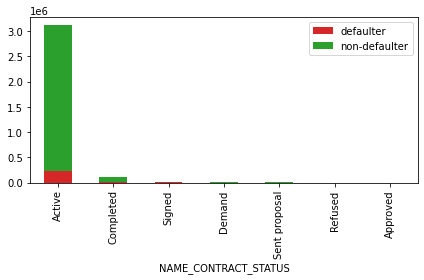

,defaulter,non-defaulter,total
NAME_CONTRACT_STATUS,,,
Active,222732.0,2893941,3116673.0
Completed,6420.0,93611,100031.0
Signed,661.0,9278,9939.0
Demand,168.0,675,843.0
Sent proposal,18.0,442,460.0
Refused,2.0,12,14.0
Approved,0.0,5,5.0


In [25]:
# for feat in credit_card_balance_target.select_dtypes('object').columns:
#   plot_train_bars_by_target(credit_card_balance_target, feat)
plot_train_bars_by_target(credit_card_balance_target, 'NAME_CONTRACT_STATUS')

### Discrete features

In [26]:
credit_card_balance_target.select_dtypes('integer').columns.tolist()

['SK_ID_CURR',
 'TARGET',
 'SK_ID_PREV',
 'CNT_DRAWINGS_ATM_CURRENT',
 'CNT_DRAWINGS_CURRENT',
 'CNT_DRAWINGS_OTHER_CURRENT',
 'CNT_DRAWINGS_POS_CURRENT',
 'CNT_INSTALMENT_MATURE_CUM']

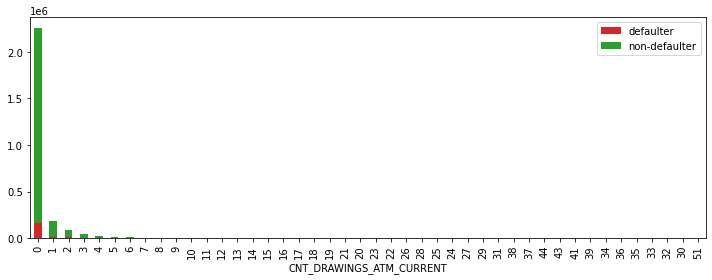

,defaulter,non-defaulter,total
CNT_DRAWINGS_ATM_CURRENT,,,
0,157286.0,2099784,2257070.0
1,16717.0,165899,182616.0
2,7771.0,74530,82301.0
3,4165.0,36197,40362.0
4,2502.0,20302,22804.0
5,1462.0,11424,12886.0
6,985.0,7027,8012.0
7,648.0,4311,4959.0
8,455.0,3039,3494.0


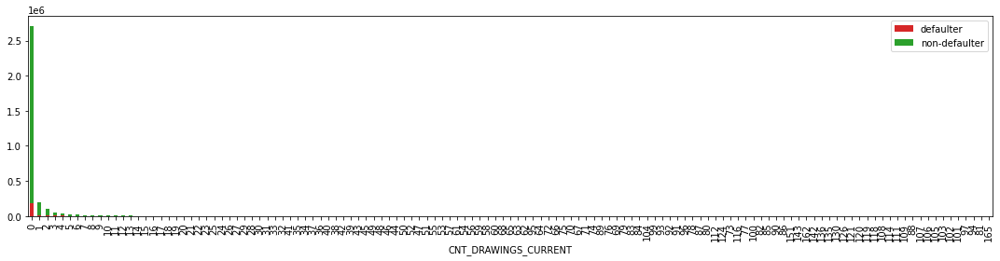

,defaulter,non-defaulter,total
CNT_DRAWINGS_CURRENT,,,
0,180049.0,2531272,2711321.0
1,16742.0,180513,197255.0
2,8978.0,90174,99152.0
3,5311.0,50030,55341.0
4,3700.0,32656,36356.0
...,...,...,...
101,0.0,2,2.0
97,0.0,6,6.0
94,0.0,5,5.0


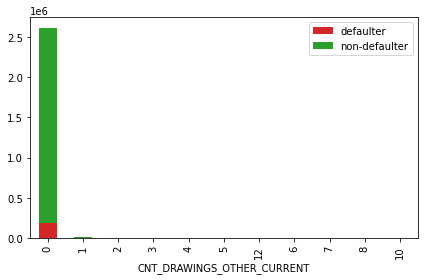

,defaulter,non-defaulter,total
CNT_DRAWINGS_OTHER_CURRENT,,,
0,192261.0,2418677,2610938.0
1,764.0,9239,10003.0
2,101.0,837,938.0
3,32.0,194,226.0
4,10.0,48,58.0
5,5.0,19,24.0
12,1.0,0,1.0
6,0.0,10,10.0
7,0.0,8,8.0


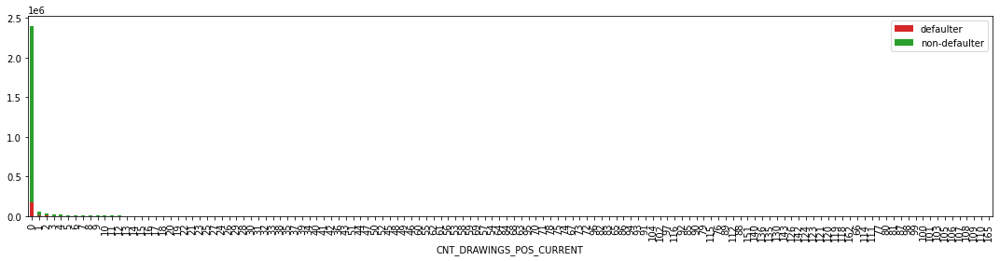

,defaulter,non-defaulter,total
CNT_DRAWINGS_POS_CURRENT,,,
0,169884.0,2234177,2404061.0
1,5625.0,54221,59846.0
2,3457.0,30243,33700.0
3,2374.0,20102,22476.0
4,1765.0,14714,16479.0
...,...,...,...
107,0.0,2,2.0
108,0.0,1,1.0
109,0.0,1,1.0


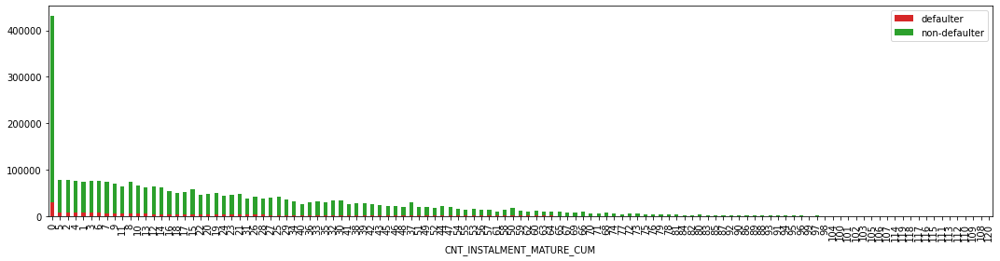

,defaulter,non-defaulter,total
CNT_INSTALMENT_MATURE_CUM,,,
0,29281.0,401776,431057.0
5,7546.0,70298,77844.0
2,7175.0,70007,77182.0
4,7120.0,69229,76349.0
1,6902.0,66440,73342.0
...,...,...,...
112,0.0,10,10.0
110,0.0,21,21.0
109,0.0,21,21.0


In [27]:
for feat in credit_card_balance_target.select_dtypes('integer').columns[3:]:
  plot_train_bars_by_target(credit_card_balance_target, feat)

### Continuous features, or very numerous discrete ones with large values

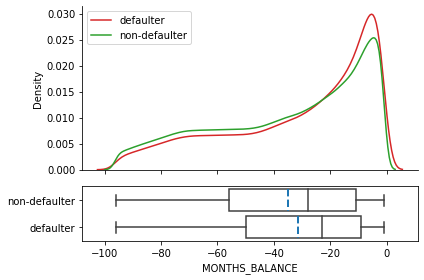

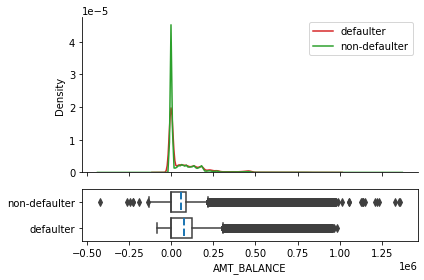

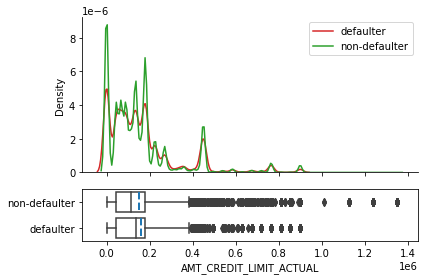

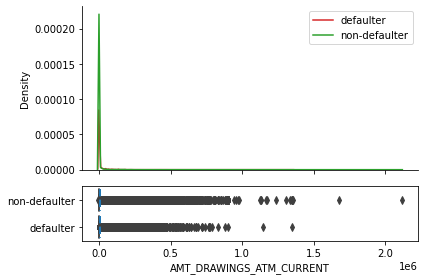

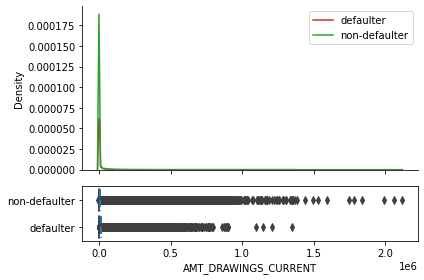

...

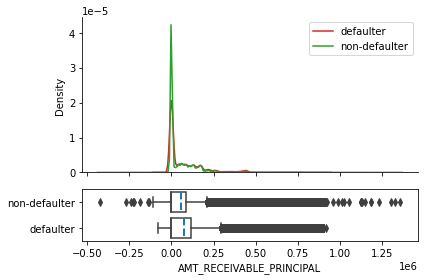

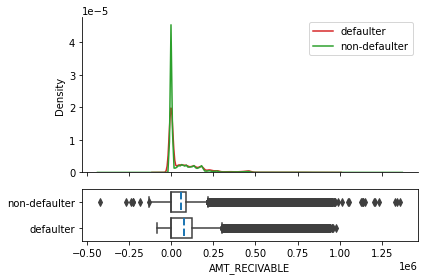

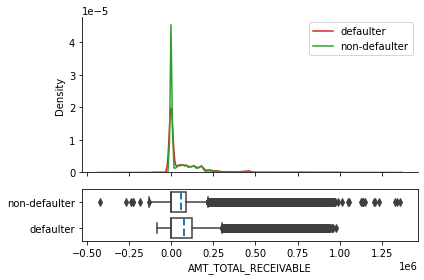

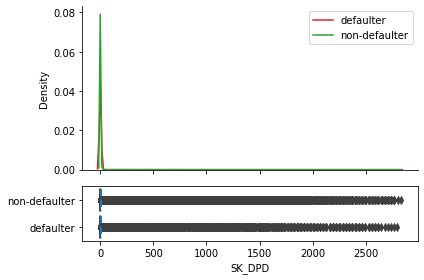

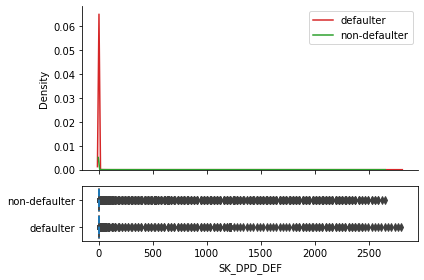

In [28]:
for feat in credit_card_balance_target.select_dtypes('floating').columns:
  plot_train_density_with_central_tendencies_by_target(credit_card_balance_target, feat)

### Correlations

#### $\phi_K$ correlation

 ##### Between the target and the categorical features

In [29]:
credit_card_balance_target.select_dtypes('object').columns

Index(['NAME_CONTRACT_STATUS'], dtype='object')

interval columns not set, guessing: ['TARGET']


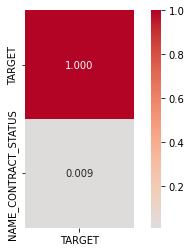

In [30]:
phik_matrix_cat = credit_card_balance_target[['TARGET',
                                              'NAME_CONTRACT_STATUS']].phik_matrix()
idx = phik_matrix_cat.sort_values(by='TARGET',
                                  ascending=False).index
phik_matrix_cat = phik_matrix_cat.loc[idx, idx]

sns.heatmap(phik_matrix_cat['TARGET'].to_frame(),
            cmap='coolwarm',
            square=True,
            center=0,
            fmt='.3f',
            annot=True);

In [31]:
phik_matrix_cat['TARGET'].to_frame().head().mul(100)[1:]

,TARGET
NAME_CONTRACT_STATUS,0.88961


#### Correlations between the target and the discrete features

##### $\phi_K$ correlation

interval columns not set, guessing: ['TARGET', 'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT', 'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT', 'CNT_INSTALMENT_MATURE_CUM']


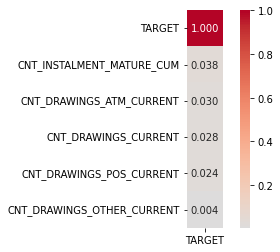

In [35]:
phik_matrix_int = credit_card_balance_target[credit_card_balance_target.select_dtypes(
    'integer').columns].drop(columns='SK_ID_CURR').phik_matrix()
idx = phik_matrix_int.sort_values(by='TARGET', ascending=False).index
phik_matrix_int = phik_matrix_int.loc[idx, idx]

sns.heatmap(
    phik_matrix_int['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.3f',
    annot=True
);

In [37]:
phik_matrix_int['TARGET'].to_frame().head().mul(100)[1:]

,TARGET
CNT_INSTALMENT_MATURE_CUM,3.826134
CNT_DRAWINGS_ATM_CURRENT,3.005164
CNT_DRAWINGS_CURRENT,2.786844
CNT_DRAWINGS_POS_CURRENT,2.432967


##### Pearson correlation

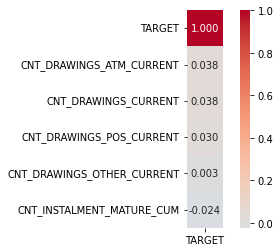

In [38]:
corr_int = credit_card_balance_target[credit_card_balance_target.select_dtypes(
    'integer').columns].drop(columns='SK_ID_CURR').corr()
idx = corr_int.sort_values(by='TARGET', ascending=False).index
corr_int = corr_int.loc[idx, idx]

sns.heatmap(
    corr_int['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.3f',
    annot=True
);

In [39]:
corr_int['TARGET'].head().mul(100).to_frame()[1:]

,TARGET
CNT_DRAWINGS_ATM_CURRENT,3.843660
CNT_DRAWINGS_CURRENT,3.779328
CNT_DRAWINGS_POS_CURRENT,2.953558
CNT_DRAWINGS_OTHER_CURRENT,0.304426


#### Correlations between the discrete features themselves

##### $\phi_K$ correlation

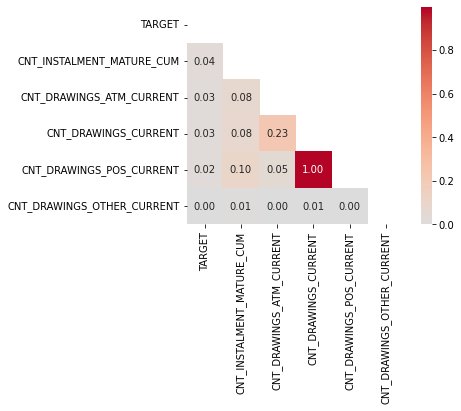

In [43]:
mask = np.zeros_like(phik_matrix_int)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(
    phik_matrix_int,
    mask = mask,
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.2f',
    annot=True
);

##### Pearson correlation

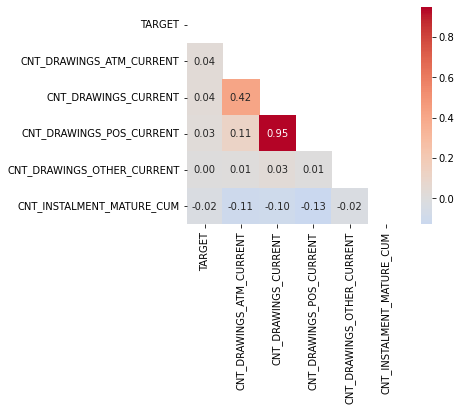

In [42]:
mask = np.zeros_like(corr_int)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(
    corr_int,
    mask = mask,
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.2f',
    annot=True
);

#### Correlation between the target and the continuous features

##### $\phi_K$ correlation

env: JOBLIB_TEMP_FOLDER=/tmp
interval columns not set, guessing: ['TARGET', 'MONTHS_BALANCE', 'AMT_BALANCE', 'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT', 'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT', 'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY', 'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT', 'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE', 'SK_DPD', 'SK_DPD_DEF']


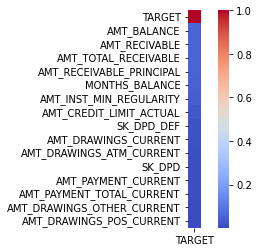

In [44]:
%env JOBLIB_TEMP_FOLDER = /tmp
phik_matrix_float = credit_card_balance_target[
    ['TARGET'] + credit_card_balance_target.select_dtypes(
        'floating').columns.tolist()].phik_matrix()
idx = phik_matrix_float.sort_values(by='TARGET', ascending=False).index
phik_matrix_float = phik_matrix_float.loc[idx, idx]

sns.heatmap(
    phik_matrix_float['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True
)


In [45]:
phik_matrix_float['TARGET'].to_frame().head(20).mul(100)[1:]

,TARGET
AMT_BALANCE,5.983849
AMT_RECIVABLE,5.931075
AMT_TOTAL_RECEIVABLE,5.928730
AMT_RECEIVABLE_PRINCIPAL,5.889478
MONTHS_BALANCE,5.036039
AMT_INST_MIN_REGULARITY,4.217426
AMT_CREDIT_LIMIT_ACTUAL,2.875201
SK_DPD_DEF,1.460866
AMT_DRAWINGS_CURRENT,1.334917
AMT_DRAWINGS_ATM_CURRENT,1.088765


##### Pearson correlation

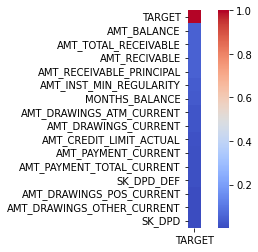

In [46]:
corr_float = credit_card_balance_target[
    ['TARGET'] + credit_card_balance_target.select_dtypes(
        'float').columns.tolist()].corr()
idx = corr_float.sort_values(by='TARGET', ascending=False).index
corr_float = corr_float.loc[idx, idx]

sns.heatmap(
    corr_float['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True
)

In [47]:
corr_float['TARGET'].nlargest(20).mul(100).to_frame()[1:]

,TARGET
AMT_BALANCE,5.009768
AMT_TOTAL_RECEIVABLE,4.983910
AMT_RECIVABLE,4.980326
AMT_RECEIVABLE_PRINCIPAL,4.969151
AMT_INST_MIN_REGULARITY,3.979760
MONTHS_BALANCE,3.569493
AMT_DRAWINGS_ATM_CURRENT,2.470022
AMT_DRAWINGS_CURRENT,2.237786
AMT_CREDIT_LIMIT_ACTUAL,1.382276
AMT_PAYMENT_CURRENT,1.292922


#### Correlations between the continuous features themselves

##### $\phi_K$ correlation

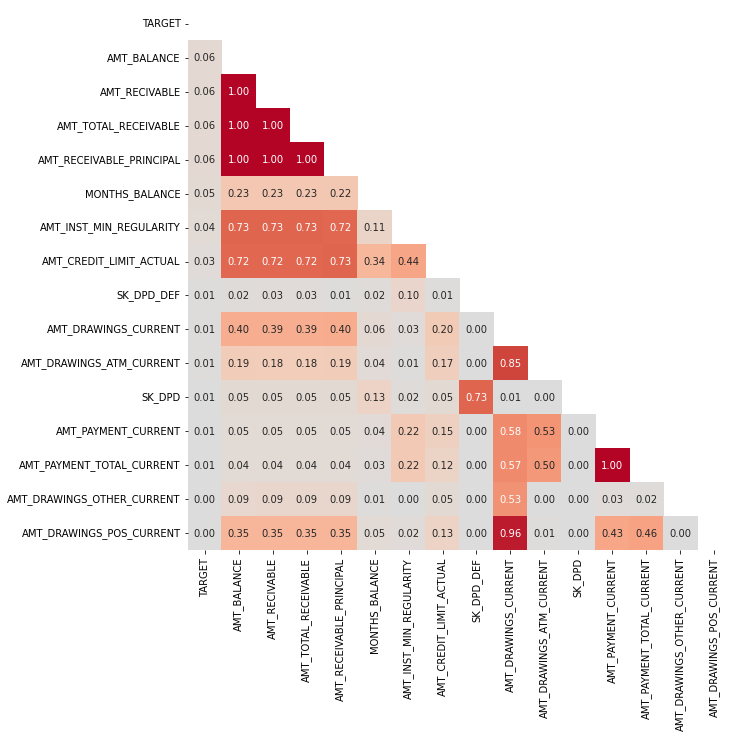

In [51]:
mask = np.zeros_like(phik_matrix_float)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize = (10, 10))
sns.heatmap(
    phik_matrix_float,
    mask = mask,
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.2f',
    annot=True,
    cbar=False
);

##### Pearson correlation

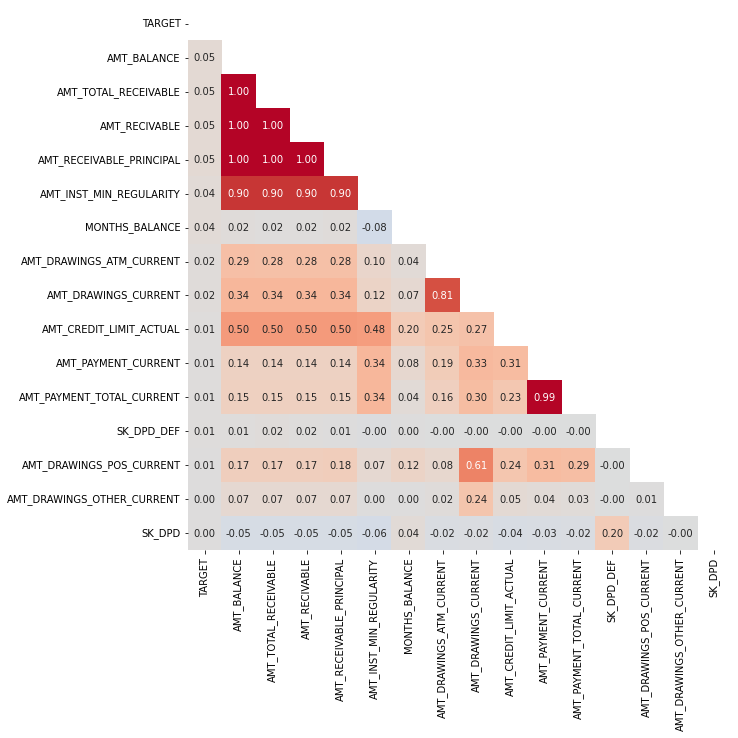

In [52]:
mask = np.zeros_like(corr_float)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize = (10, 10))
sns.heatmap(
    corr_float,
    mask = mask,
    cmap='coolwarm',
    square=True,            
    center=0,
    fmt='.2f',
    annot=True,
    cbar=False
);

In [ ]:
del credit_card_balance, credit_card_balance_target
gc.collect()

# Installment payments

## Data import

In [124]:
installments_payments = reduce_memory_usage(
    pd.read_csv(
        'data/installments_payments.csv'
    ).drop(columns='SK_ID_PREV'), # The previous credit identifier won't be used
    floating=False,
    verbose=True
)

Initial memory usage of the dataframe: 726.61 MB
Final memory usage, after optimization: 596.86 MB
Decreased by 17.86%


## Data overview

In [125]:
installments_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 7 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int32  
 1   NUM_INSTALMENT_VERSION  float64
 2   NUM_INSTALMENT_NUMBER   int16  
 3   DAYS_INSTALMENT         float64
 4   DAYS_ENTRY_PAYMENT      float64
 5   AMT_INSTALMENT          float64
 6   AMT_PAYMENT             float64
dtypes: float64(5), int16(1), int32(1)
memory usage: 596.9 MB


In [126]:
installments_payments.head()

,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


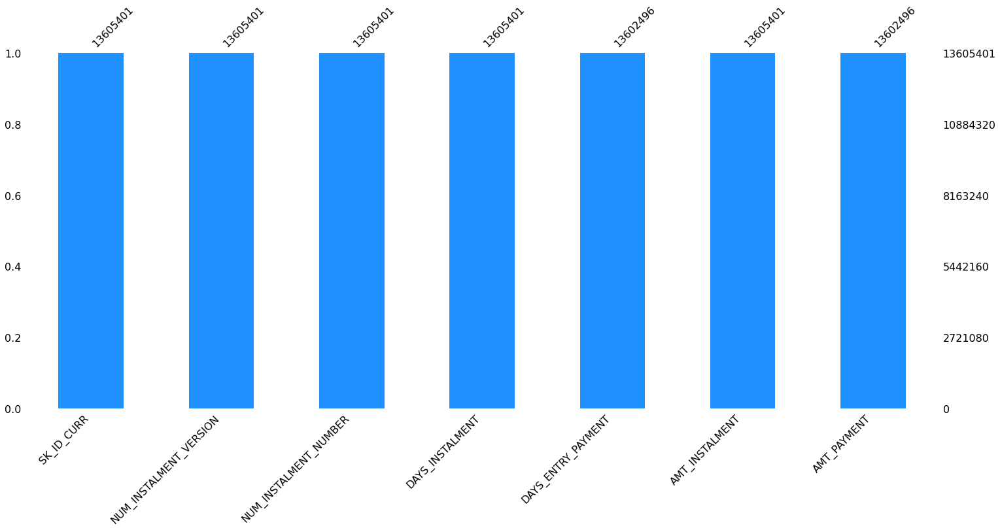

In [127]:
msno.bar(installments_payments, color='dodgerblue');

## Identifiers

In [22]:
# If some loan indices are counted more than once, aggregation for the table would be required
installments_payments['SK_ID_CURR'].value_counts()

145728    372
296205    350
453103    347
189699    344
186851    337
         ... 
238454      1
247672      1
399647      1
143169      1
293205      1
Name: SK_ID_CURR, Length: 339587, dtype: int64

## Feature types

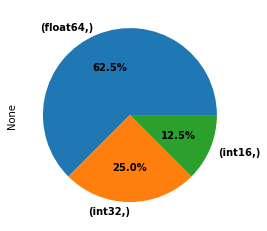

In [56]:
installments_payments.dtypes.value_counts().plot.pie(
    autopct='%.1f%%',
    textprops=dict(weight='bold')
);

## Merging with the target feature

In [34]:
installments_payments_target = application_train[['SK_ID_CURR', 'TARGET']].merge(
    installments_payments,
    on='SK_ID_CURR',
    how='left'
)

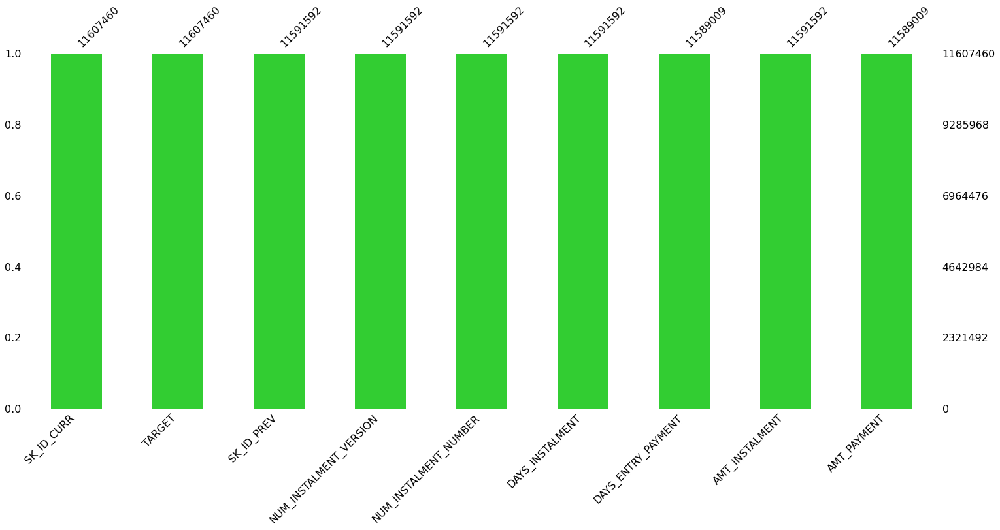

In [58]:
msno.bar(installments_payments_target, color='limegreen');

## Feature analysis

### Type conversion

In [22]:
for feat in (x for x in installments_payments.columns if 'NUM' in x):
  print(installments_payments_target[feat].dtype)
  print(installments_payments_target[feat].isna().sum())

float64
15868
float64
15868


### Discrete features

In [38]:
installments_payments_target.select_dtypes('integer').columns.tolist()

['SK_ID_CURR', 'TARGET', 'SK_ID_PREV']

### Continuous features, or very numerous discrete ones with large values

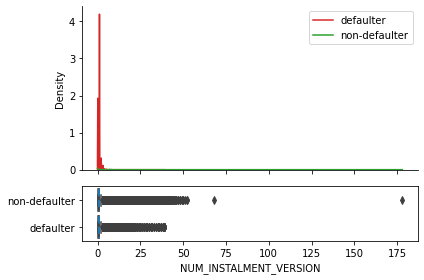

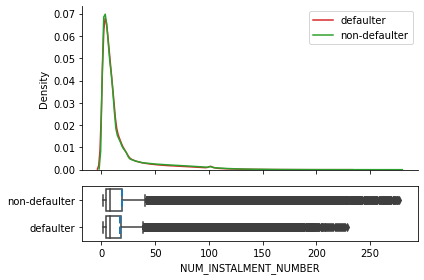

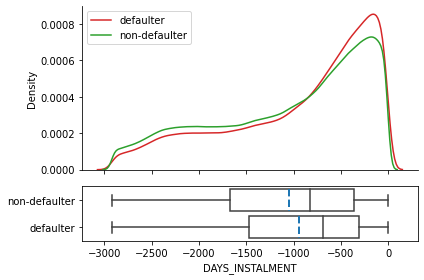

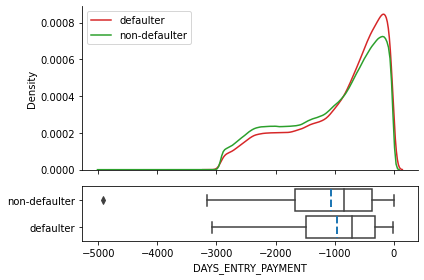

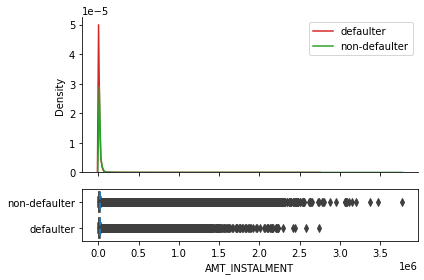

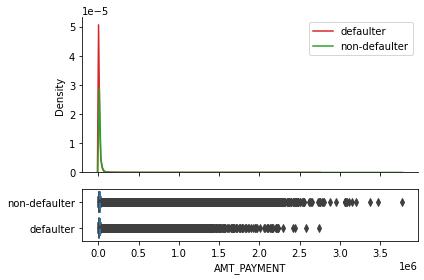

In [39]:
for feat in installments_payments_target.select_dtypes('floating').columns:
  plot_train_density_with_central_tendencies_by_target(installments_payments_target, feat)

### Correlations

#### Correlation between the target and the continuous features

##### $\phi_K$ correlation

env: JOBLIB_TEMP_FOLDER=/tmp
interval columns not set, guessing: ['TARGET', 'NUM_INSTALMENT_VERSION', 'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT', 'AMT_INSTALMENT', 'AMT_PAYMENT']


/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:705: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


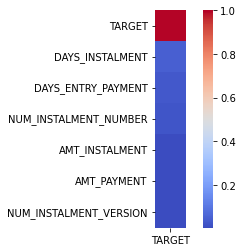

In [42]:
%env JOBLIB_TEMP_FOLDER = /tmp
phik_matrix_float = installments_payments_target[
    ['TARGET'] + installments_payments_target.select_dtypes(
        'floating').columns.tolist()].phik_matrix()
idx = phik_matrix_float.sort_values(by='TARGET', ascending=False).index
phik_matrix_float = phik_matrix_float.loc[idx, idx]

sns.heatmap(
    phik_matrix_float['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True
)


In [43]:
phik_matrix_float['TARGET'].to_frame().head(20).mul(100)[1:]

,TARGET
DAYS_INSTALMENT,4.682406
DAYS_ENTRY_PAYMENT,3.312802
NUM_INSTALMENT_NUMBER,2.299338
AMT_INSTALMENT,0.412525
AMT_PAYMENT,0.308415
NUM_INSTALMENT_VERSION,0.219769


##### Pearson correlation

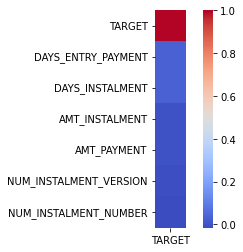

In [44]:
corr_float = installments_payments_target[
    ['TARGET'] + installments_payments_target.select_dtypes(
        'floating').columns.tolist()].corr()
idx = corr_float.sort_values(by='TARGET', ascending=False).index
corr_float = corr_float.loc[idx, idx]

sns.heatmap(
    corr_float['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True
)


In [45]:
corr_float['TARGET'].nlargest(20).mul(100).to_frame()[1:]

,TARGET
DAYS_ENTRY_PAYMENT,3.512241
DAYS_INSTALMENT,3.497445
AMT_INSTALMENT,-0.149805
AMT_PAYMENT,-0.362328
NUM_INSTALMENT_VERSION,-0.989614
NUM_INSTALMENT_NUMBER,-1.618989


#### Correlations between the continuous features themselves

##### $\phi_K$ correlation

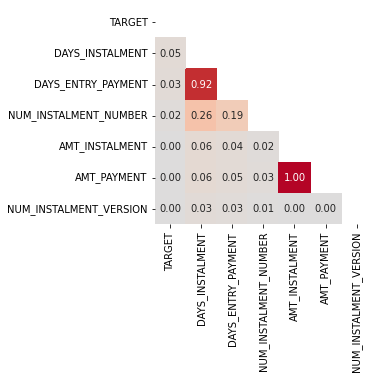

In [48]:
mask = np.zeros_like(phik_matrix_float)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(
    phik_matrix_float,
    mask = mask,
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.2f',
    annot=True,
    cbar=False
);

##### Pearson correlation

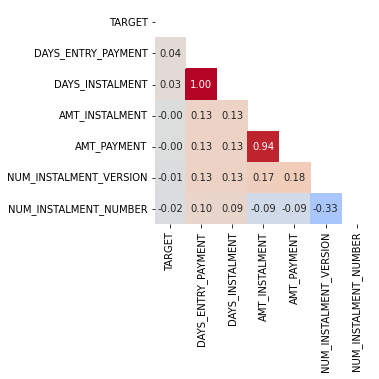

In [49]:
mask = np.zeros_like(corr_float)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(
    corr_float,
    mask = mask,
    cmap='coolwarm',
    square=True,            
    center=0,
    fmt='.2f',
    annot=True,
    cbar=False
);

In [57]:
del installments_payments, installments_payments_target
gc.collect()

15261

# Previous application

## Data import

In [120]:
previous_application = reduce_memory_usage(
    pd.read_csv(        
        'data/previous_application.csv'
    ).drop(columns='SK_ID_PREV'), # The previous credit identifier won't be used
    floating=False,
    verbose=True
)

Initial memory usage of the dataframe: 458.74 MB
Final memory usage, after optimization: 414.14 MB
Decreased by 9.72%


## Data overview

In [121]:
previous_application.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 36 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_CURR                   1670214 non-null  int32  
 1   NAME_CONTRACT_TYPE           1670214 non-null  object 
 2   AMT_ANNUITY                  1297979 non-null  float64
 3   AMT_APPLICATION              1670214 non-null  float64
 4   AMT_CREDIT                   1670213 non-null  float64
 5   AMT_DOWN_PAYMENT             774370 non-null   float64
 6   AMT_GOODS_PRICE              1284699 non-null  float64
 7   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 8   HOUR_APPR_PROCESS_START      1670214 non-null  int8   
 9   FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 10  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int8   
 11  RATE_DOWN_PAYMENT            774370 non-null   float64
 12  RATE_INTEREST_PRIMARY        5951 non-null

In [122]:
previous_application.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


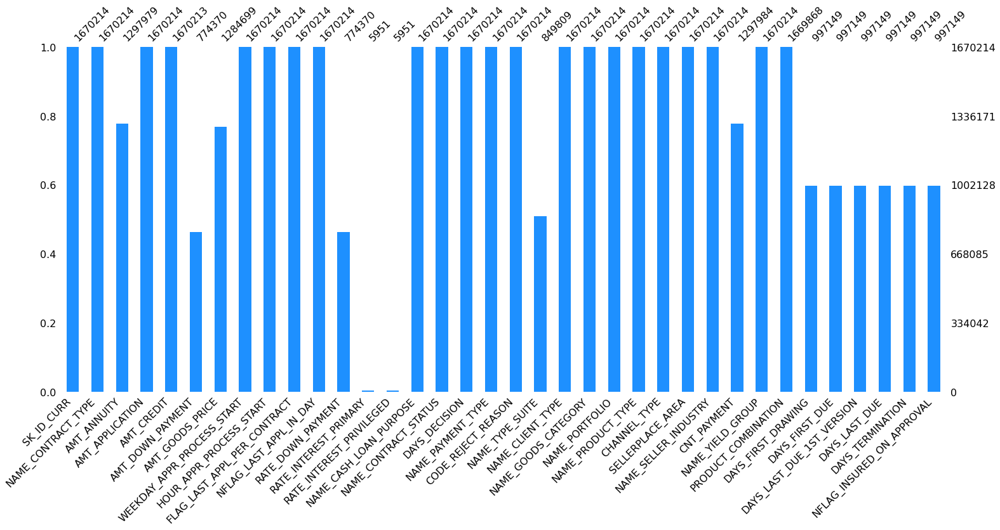

In [123]:
msno.bar(previous_application, color='dodgerblue');

## Identifiers

In [4]:
# If some loan indices are counted more than once, aggregation for the table would be required
previous_application['SK_ID_CURR'].value_counts()

187868    77
265681    73
173680    72
242412    68
206783    67
          ..
135285     1
311960     1
427136     1
241434     1
191629     1
Name: SK_ID_CURR, Length: 338857, dtype: int64

## Feature types

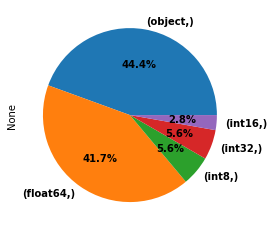

In [6]:
previous_application.dtypes.value_counts().plot.pie(
    autopct='%.1f%%',
    textprops=dict(weight='bold')
);

## Merging with the target feature

In [36]:
previous_application_target = application_train[['SK_ID_CURR', 'TARGET']].merge(
    previous_application,
    on='SK_ID_CURR',
    how='left'
)

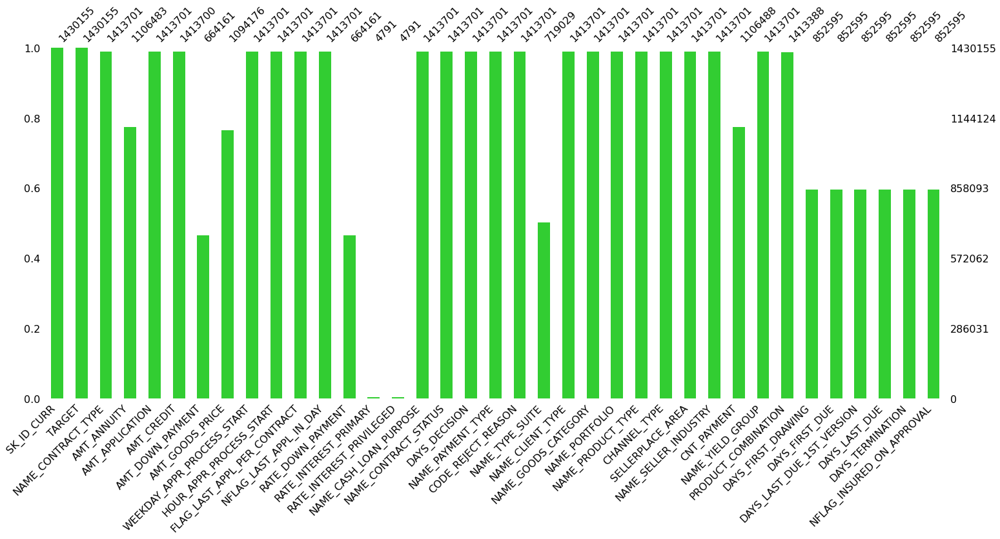

In [11]:
msno.bar(previous_application_target, color='limegreen');

## Feature analysis

### Type conversion

In [48]:
previous_application_target.select_dtypes(exclude='object').columns.tolist()

['SK_ID_CURR',
 'TARGET',
 'AMT_ANNUITY',
 'AMT_APPLICATION',
 'AMT_CREDIT',
 'AMT_DOWN_PAYMENT',
 'AMT_GOODS_PRICE',
 'HOUR_APPR_PROCESS_START',
 'NFLAG_LAST_APPL_IN_DAY',
 'RATE_DOWN_PAYMENT',
 'RATE_INTEREST_PRIMARY',
 'RATE_INTEREST_PRIVILEGED',
 'DAYS_DECISION',
 'SELLERPLACE_AREA',
 'CNT_PAYMENT',
 'DAYS_FIRST_DRAWING',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_LAST_DUE',
 'DAYS_TERMINATION',
 'NFLAG_INSURED_ON_APPROVAL']

In [50]:
previous_application_target['HOUR_APPR_PROCESS_START'].isna().sum()

16454

In [44]:
previous_application_target['NFLAG_LAST_APPL_IN_DAY'].isna().sum()

16454

In [51]:
previous_application_target['CNT_PAYMENT'].isna().sum()

323667

In [52]:
previous_application_target['NFLAG_INSURED_ON_APPROVAL'].isna().sum()

577560

In [53]:
# Convert the following feature into a variable of the nullable integer type
previous_application_target['HOUR_APPR_PROCESS_START'] = previous_application_target['HOUR_APPR_PROCESS_START'].astype('Int64')
previous_application_target['NFLAG_LAST_APPL_IN_DAY'] = previous_application_target['NFLAG_LAST_APPL_IN_DAY'].astype('Int64')
previous_application_target['CNT_PAYMENT'] = previous_application_target['CNT_PAYMENT'].astype('Int64')
previous_application_target['NFLAG_INSURED_ON_APPROVAL'] = previous_application_target['NFLAG_INSURED_ON_APPROVAL'].astype('Int64')


### Categorical features

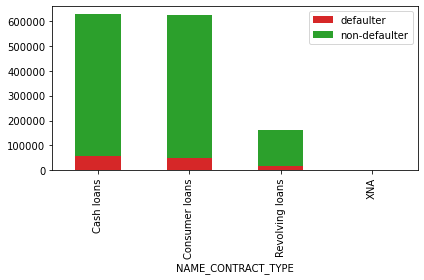

                    defaulter  non-defaulter     total
NAME_CONTRACT_TYPE                                    
Cash loans            57197.0         569567  626764.0
Consumer loans        48207.0         577049  625256.0
Revolving loans       16893.0         144475  161368.0
XNA                      63.0            250     313.0


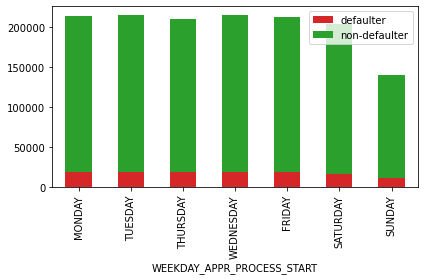

                            defaulter  non-defaulter     total
WEEKDAY_APPR_PROCESS_START                                    
MONDAY                        19007.0         195502  214509.0
TUESDAY                       18855.0         196203  215058.0
THURSDAY                      18758.0         192247  211005.0
WEDNESDAY                     18745.0         196774  215519.0
FRIDAY                        18671.0         194702  213373.0
SATURDAY                      17041.0         187118  204159.0
SUNDAY                        11283.0         128795  140078.0


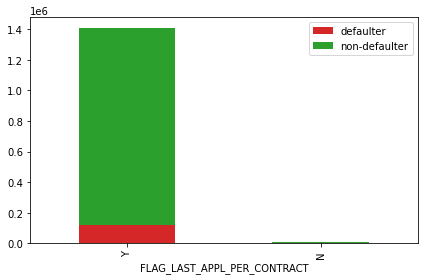

                             defaulter  non-defaulter      total
FLAG_LAST_APPL_PER_CONTRACT                                     
Y                             121569.0        1284818  1406387.0
N                                791.0           6523     7314.0


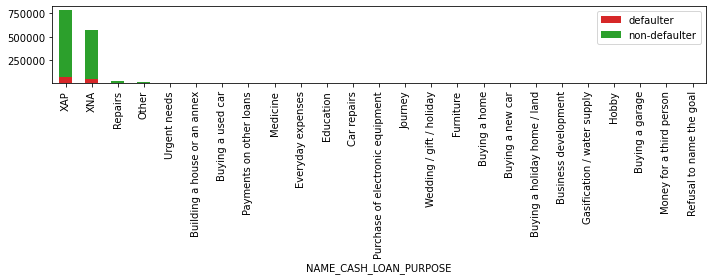

                                  defaulter  non-defaulter     total
NAME_CASH_LOAN_PURPOSE                                              
XAP                                 65163.0         721774  786937.0
XNA                                 49458.0         517893  567351.0
Repairs                              2616.0          17501   20117.0
Other                                1673.0          11759   13432.0
Urgent needs                         1082.0           6154    7236.0
Building a house or an annex          324.0           2020    2344.0
Buying a used car                     318.0           2151    2469.0
Payments on other loans               252.0           1321    1573.0
Medicine                              251.0           1620    1871.0
Everyday expenses                     216.0           1836    2052.0
Education                             140.0           1194    1334.0
Car repairs                           127.0            564     691.0
Purchase of electronic equipment  

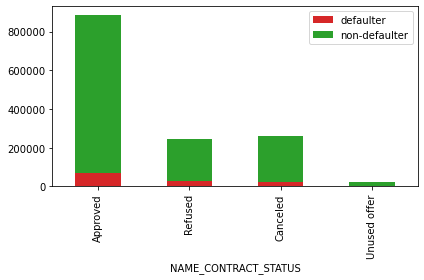

                      defaulter  non-defaulter     total
NAME_CONTRACT_STATUS                                    
Approved                67243.0         818856  886099.0
Refused                 29438.0         215952  245390.0
Canceled                23800.0         235641  259441.0
Unused offer             1879.0          20892   22771.0


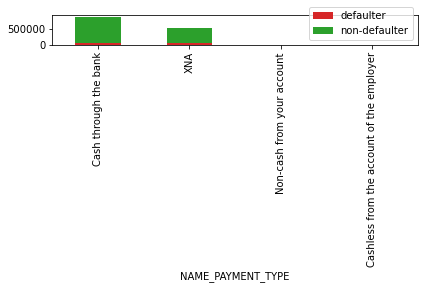

                                           defaulter  non-defaulter     total
NAME_PAYMENT_TYPE                                                            
Cash through the bank                        71380.0         811320  882700.0
XNA                                          50321.0         472639  522960.0
Non-cash from your account                     583.0           6517    7100.0
Cashless from the account of the employer       76.0            865     941.0


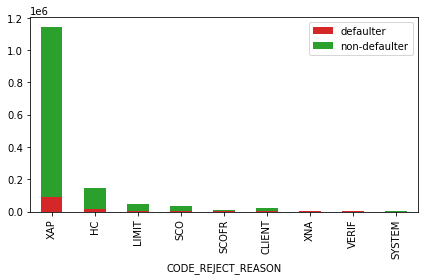

                    defaulter  non-defaulter      total
CODE_REJECT_REASON                                     
XAP                   91043.0        1054490  1145533.0
HC                    17130.0         128854   145984.0
LIMIT                  6000.0          41773    47773.0
SCO                    3263.0          29373    32636.0
SCOFR                  2276.0           8599    10875.0
CLIENT                 1879.0          20892    22771.0
XNA                     442.0           3936     4378.0
VERIF                   285.0           2794     3079.0
SYSTEM                   42.0            630      672.0


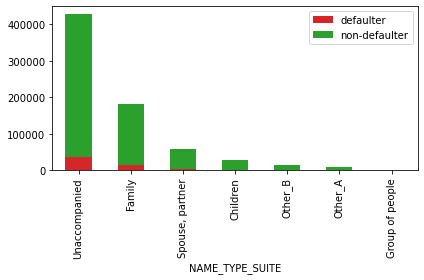

                 defaulter  non-defaulter     total
NAME_TYPE_SUITE                                    
Unaccompanied      35427.0         392208  427635.0
Family             13594.0         168286  181880.0
Spouse, partner     4736.0          52850   57586.0
Children            1723.0          25383   27106.0
Other_B             1280.0          13793   15073.0
Other_A              681.0           7139    7820.0
Group of people      171.0           1758    1929.0


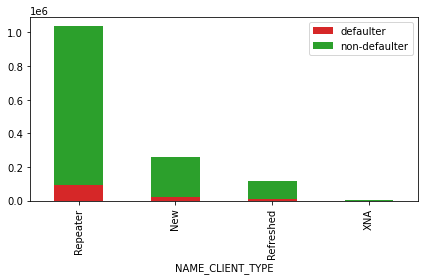

                  defaulter  non-defaulter      total
NAME_CLIENT_TYPE                                     
Repeater            90430.0         947252  1037682.0
New                 23345.0         236195   259540.0
Refreshed            8432.0         106504   114936.0
XNA                   153.0           1390     1543.0


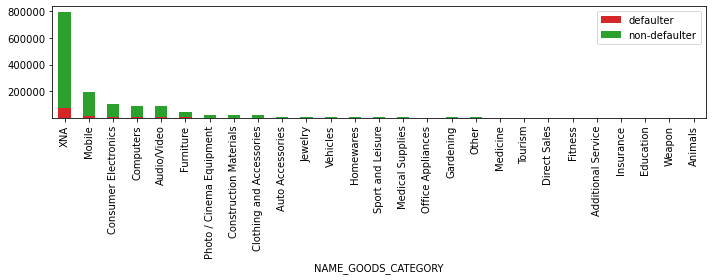

                          defaulter  non-defaulter     total
NAME_GOODS_CATEGORY                                         
XNA                         74824.0         722385  797209.0
Mobile                      16753.0         176990  193743.0
Consumer Electronics         7405.0          97380  104785.0
Computers                    7288.0          82635   89923.0
Audio/Video                  6551.0          78951   85502.0
Furniture                    2658.0          42781   45439.0
Photo / Cinema Equipment     1656.0          20051   21707.0
Construction Materials       1488.0          19868   21356.0
Clothing and Accessories     1117.0          18473   19590.0
Auto Accessories              565.0           5663    6228.0
Jewelry                       469.0           4719    5188.0
Vehicles                      287.0           2567    2854.0
Homewares                     286.0           4023    4309.0
Sport and Leisure             184.0           2356    2540.0
Medical Supplies        

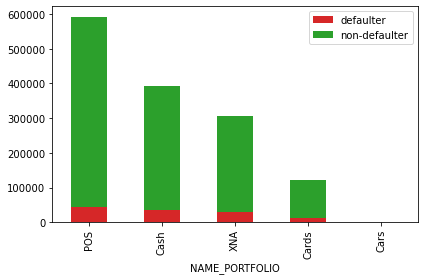

                defaulter  non-defaulter     total
NAME_PORTFOLIO                                    
POS               45240.0         547220  592460.0
Cash              34766.0         356897  391663.0
XNA               29937.0         277276  307213.0
Cards             12396.0         109589  121985.0
Cars                 21.0            359     380.0


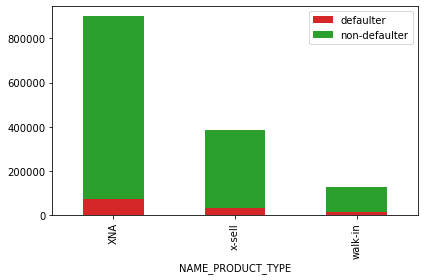

                   defaulter  non-defaulter     total
NAME_PRODUCT_TYPE                                    
XNA                  75198.0         824855  900053.0
x-sell               31170.0         354224  385394.0
walk-in              15992.0         112262  128254.0


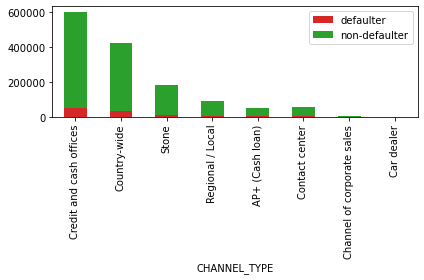

                            defaulter  non-defaulter     total
CHANNEL_TYPE                                                  
Credit and cash offices       54097.0         546245  600342.0
Country-wide                  34928.0         388134  423062.0
Stone                         13524.0         169984  183508.0
Regional / Local               7033.0          85439   92472.0
AP+ (Cash loan)                6365.0          43259   49624.0
Contact center                 6048.0          52843   58891.0
Channel of corporate sales      344.0           5052    5396.0
Car dealer                       21.0            385     406.0


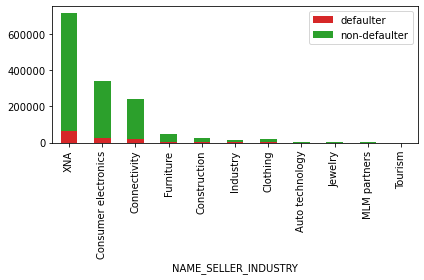

                      defaulter  non-defaulter     total
NAME_SELLER_INDUSTRY                                    
XNA                     66922.0         648400  715322.0
Consumer electronics    25810.0         315891  341701.0
Connectivity            21945.0         216405  238350.0
Furniture                2995.0          45971   48966.0
Construction             1671.0          23746   25417.0
Industry                 1195.0          15372   16567.0
Clothing                 1139.0          18757   19896.0
Auto technology           423.0           3657    4080.0
Jewelry                   187.0           1920    2107.0
MLM partners               57.0            864     921.0
Tourism                    16.0            358     374.0


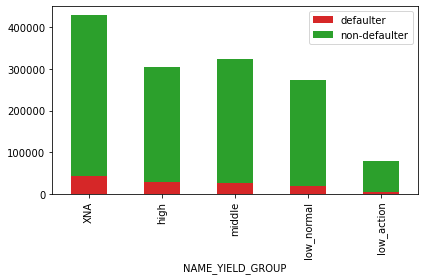

                  defaulter  non-defaulter     total
NAME_YIELD_GROUP                                    
XNA                 42333.0         386865  429198.0
high                29214.0         276847  306061.0
middle              26138.0         298833  324971.0
low_normal          19605.0         255279  274884.0
low_action           5070.0          73517   78587.0


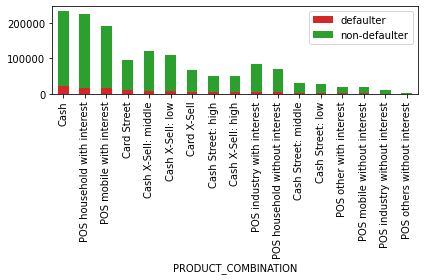

                                defaulter  non-defaulter     total
PRODUCT_COMBINATION                                               
Cash                              22431.0         212670  235101.0
POS household with interest       17516.0         208948  226464.0
POS mobile with interest          16815.0         174035  190850.0
Card Street                       10680.0          83914   94594.0
Cash X-Sell: middle                9406.0         110630  120036.0
Cash X-Sell: low                   7281.0         103318  110599.0
Card X-Sell                        6213.0          60561   66774.0
Cash Street: high                  5875.0          45824   51699.0
Cash X-Sell: high                  5839.0          44963   50802.0
POS industry with interest         5263.0          78245   83508.0
POS household without interest     4749.0          66770   71519.0
Cash Street: middle                3477.0          26457   29934.0
Cash Street: low                   2888.0          25705   285

In [54]:
for feat in previous_application.select_dtypes('object').columns:
  plot_train_bars_by_target(previous_application_target, feat)

### Discrete features

In [55]:
previous_application_target.select_dtypes('integer').columns.tolist()

['SK_ID_CURR',
 'TARGET',
 'HOUR_APPR_PROCESS_START',
 'NFLAG_LAST_APPL_IN_DAY',
 'CNT_PAYMENT',
 'NFLAG_INSURED_ON_APPROVAL']

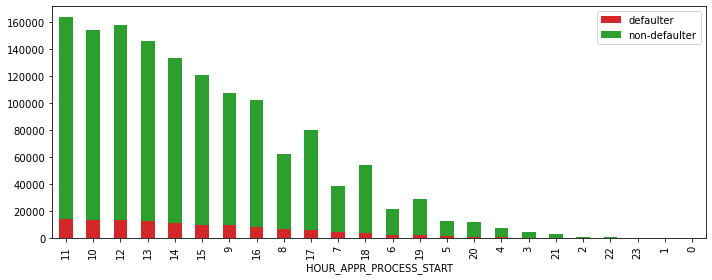

                         defaulter  non-defaulter     total
HOUR_APPR_PROCESS_START                                    
11                         14174.0         149090  163264.0
10                         13424.0         140376  153800.0
12                         13335.0         144193  157528.0
13                         12627.0         133211  145838.0
14                         11287.0         122334  133621.0
15                         10066.0         110829  120895.0
9                          10029.0          97667  107696.0
16                          8062.0          94464  102526.0
8                           6500.0          55817   62317.0
17                          6131.0          74136   80267.0
7                           4288.0          34558   38846.0
18                          4005.0          49943   53948.0
6                           2464.0          19241   21705.0
19                          2030.0          26696   28726.0
5                           1463.0      

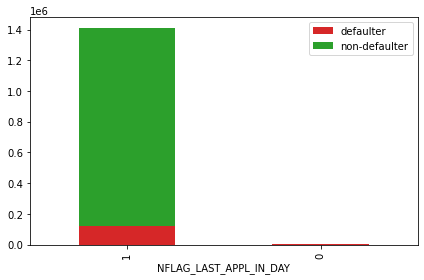

                        defaulter  non-defaulter      total
NFLAG_LAST_APPL_IN_DAY                                     
1                        121855.0        1286802  1408657.0
0                           505.0           4539     5044.0


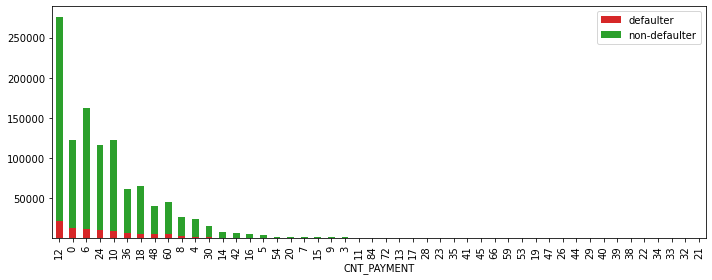

             defaulter  non-defaulter     total
CNT_PAYMENT                                    
12             20857.0         254401  275258.0
0              12396.0         109589  121985.0
6              11512.0         151248  162760.0
24              9853.0         106924  116777.0
10              8682.0         113864  122546.0
36              6370.0          54474   60844.0
18              5522.0          60010   65532.0
48              5135.0          35574   40709.0
60              4616.0          41081   45697.0
8               2063.0          24054   26117.0
4               1459.0          21901   23360.0
30              1359.0          13240   14599.0
14               721.0           6467    7188.0
42               606.0           5623    6229.0
16               387.0           4395    4782.0
5                215.0           3275    3490.0
54               198.0           1655    1853.0
20               115.0           1498    1613.0
7                 82.0           1200   

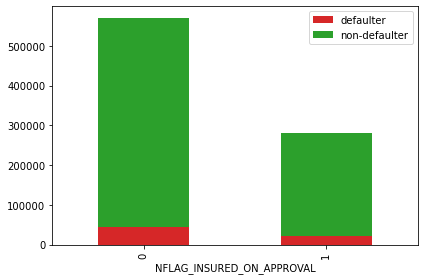

                           defaulter  non-defaulter     total
NFLAG_INSURED_ON_APPROVAL                                    
0                            43244.0         527507  570751.0
1                            21458.0         260386  281844.0


In [56]:
for feat in previous_application_target.select_dtypes('integer').columns[2:]:
    plot_train_bars_by_target(previous_application_target, feat)

### Continuous features, or very numerous discrete ones with large values

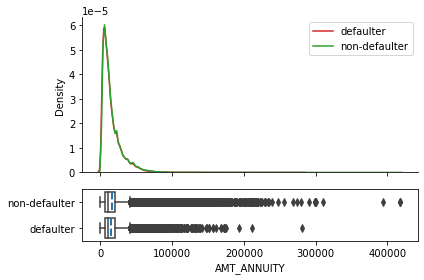

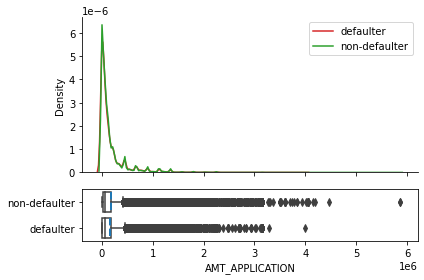

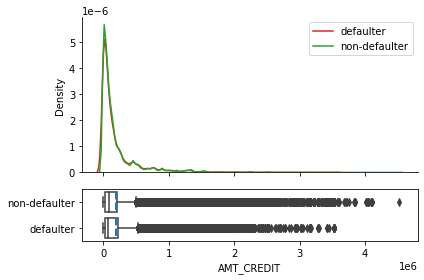

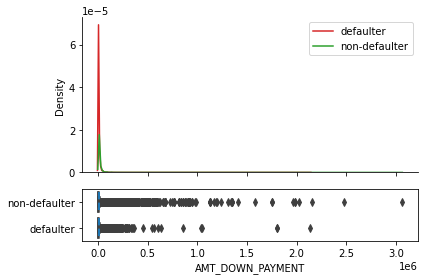

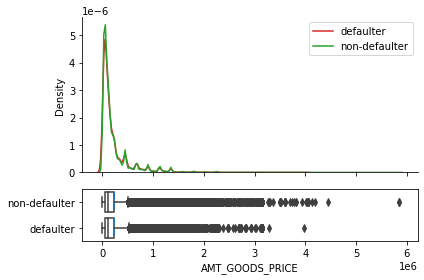

...

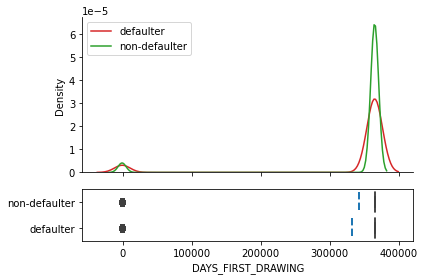

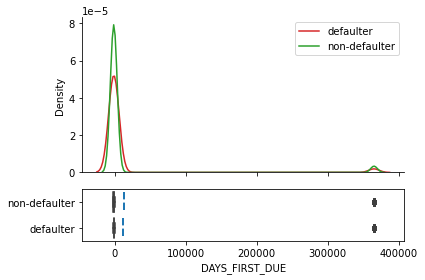

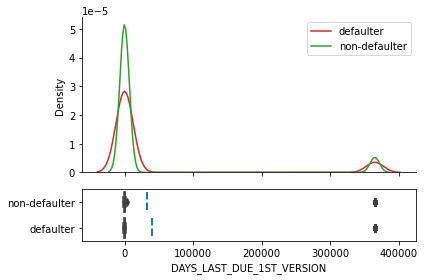

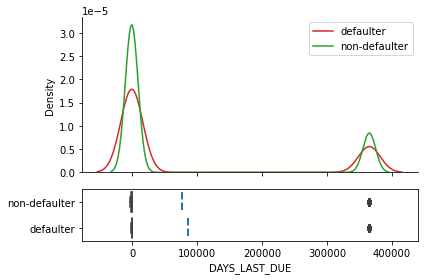

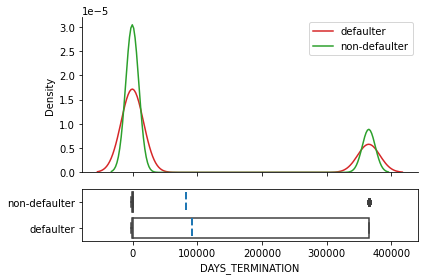

In [57]:
for feat in previous_application_target.select_dtypes('floating').columns:
  plot_train_density_with_central_tendencies_by_target(previous_application_target, feat)

### Correlations

#### $\phi_K$ correlation

 ##### Between the target and the categorical features

interval columns not set, guessing: ['TARGET']


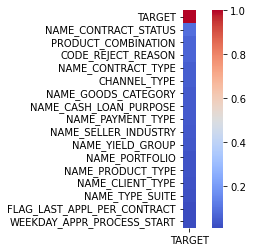

In [58]:
phik_matrix_cat = previous_application_target[
    ['TARGET'] + previous_application_target.select_dtypes(
        'object').columns.tolist()].phik_matrix()
idx = phik_matrix_cat.sort_values(by='TARGET', ascending=False).index
phik_matrix_cat = phik_matrix_cat.loc[idx, idx]

sns.heatmap(
    phik_matrix_cat['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True
);

In [59]:
phik_matrix_cat['TARGET'].to_frame().head().mul(100)[1:]

,TARGET
NAME_CONTRACT_STATUS,8.826618
PRODUCT_COMBINATION,6.383875
CODE_REJECT_REASON,6.277131
NAME_CONTRACT_TYPE,5.085872


#### Correlations between the target and the discrete features

##### $\phi_K$ correlation

interval columns not set, guessing: ['SK_ID_CURR', 'TARGET', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY', 'CNT_PAYMENT', 'NFLAG_INSURED_ON_APPROVAL']


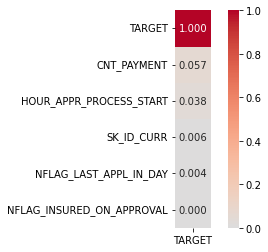

In [60]:
phik_matrix_int = previous_application_target.select_dtypes(
    'integer').phik_matrix()
idx = phik_matrix_int.sort_values(by='TARGET', ascending=False).index
phik_matrix_int = phik_matrix_int.loc[idx, idx]

sns.heatmap(
    phik_matrix_int['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.3f',
    annot=True
);

In [61]:
phik_matrix_int['TARGET'].to_frame().head().mul(100)[1:]

,TARGET
CNT_PAYMENT,5.663855
HOUR_APPR_PROCESS_START,3.812149
SK_ID_CURR,0.593497
NFLAG_LAST_APPL_IN_DAY,0.430477


##### Pearson correlation

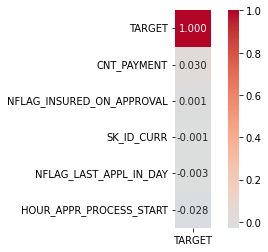

In [62]:
corr_int = previous_application_target.select_dtypes('integer').corr()
idx = corr_int.sort_values(by='TARGET', ascending=False).index
corr_int = corr_int.loc[idx, idx]

sns.heatmap(
    corr_int['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.3f',
    annot=True
);

In [63]:
corr_int['TARGET'].head().mul(100).to_frame()[1:]

,TARGET
CNT_PAYMENT,3.048036
NFLAG_INSURED_ON_APPROVAL,0.065277
SK_ID_CURR,-0.121612
NFLAG_LAST_APPL_IN_DAY,-0.288705


#### Correlations between the discrete features themselves

##### $\phi_K$ correlation

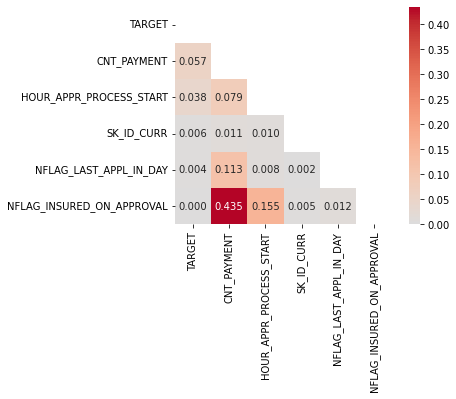

In [64]:
mask = np.zeros_like(phik_matrix_int)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(
    phik_matrix_int,
    mask=mask,
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.3f',
    annot=True
);

##### Pearson correlation

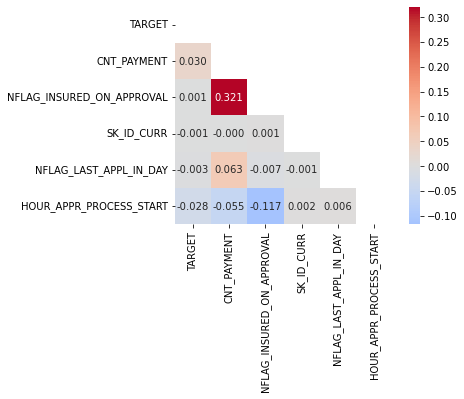

In [65]:
mask = np.zeros_like(corr_int)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(
    corr_int,
    mask=mask,
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.3f',
    annot=True
);

#### Correlation between the target and the continuous features

##### $\phi_K$ correlation

env: JOBLIB_TEMP_FOLDER=/tmp
interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'SELLERPLACE_AREA', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION']


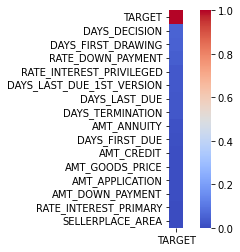

In [66]:
%env JOBLIB_TEMP_FOLDER = /tmp
phik_matrix_float = previous_application_target[
    ['TARGET'] + previous_application_target.select_dtypes(
        'floating').columns.tolist()].phik_matrix()
idx = phik_matrix_float.sort_values(by='TARGET', ascending=False).index
phik_matrix_float = phik_matrix_float.loc[idx, idx]

sns.heatmap(
    phik_matrix_float['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True
);

In [67]:
phik_matrix_float['TARGET'].to_frame().head(20).mul(100)[1:]

,TARGET
DAYS_DECISION,5.369416
DAYS_FIRST_DRAWING,4.899292
RATE_DOWN_PAYMENT,3.959171
RATE_INTEREST_PRIVILEGED,2.820421
DAYS_LAST_DUE_1ST_VERSION,2.787840
DAYS_LAST_DUE,2.732029
DAYS_TERMINATION,2.647936
AMT_ANNUITY,1.380755
DAYS_FIRST_DUE,1.078172
AMT_CREDIT,0.630538


##### Pearson correlation

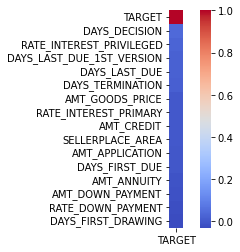

In [68]:
corr_float = previous_application_target[
    ['TARGET'] + previous_application_target.select_dtypes(
        'floating').columns.tolist()].corr()
idx = corr_float.sort_values(by='TARGET', ascending=False).index
corr_float = corr_float.loc[idx, idx]

sns.heatmap(
    corr_float['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True
);

In [69]:
corr_float['TARGET'].nlargest(20).mul(100).to_frame()[1:]

,TARGET
DAYS_DECISION,3.990097
RATE_INTEREST_PRIVILEGED,2.863981
DAYS_LAST_DUE_1ST_VERSION,1.802097
DAYS_LAST_DUE,1.752202
DAYS_TERMINATION,1.698148
AMT_GOODS_PRICE,0.025397
RATE_INTEREST_PRIMARY,-0.146954
AMT_CREDIT,-0.235035
SELLERPLACE_AREA,-0.253860
AMT_APPLICATION,-0.558277


#### Correlations between the continuous features themselves

##### $\phi_K$ correlation

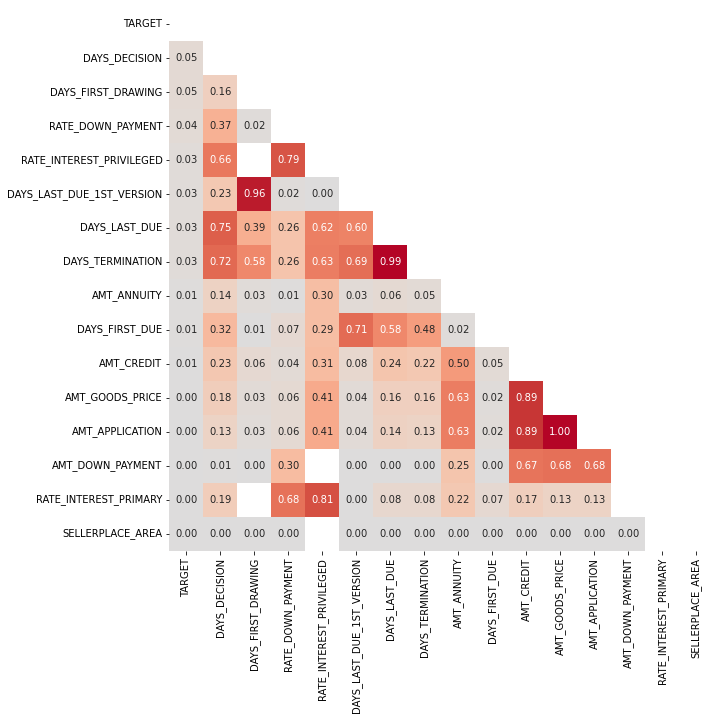

In [72]:
mask = np.zeros_like(phik_matrix_float)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(10, 10))
sns.heatmap(
    phik_matrix_float,
    mask=mask,
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.2f',
    annot=True,
    cbar=False
);

##### Pearson correlation

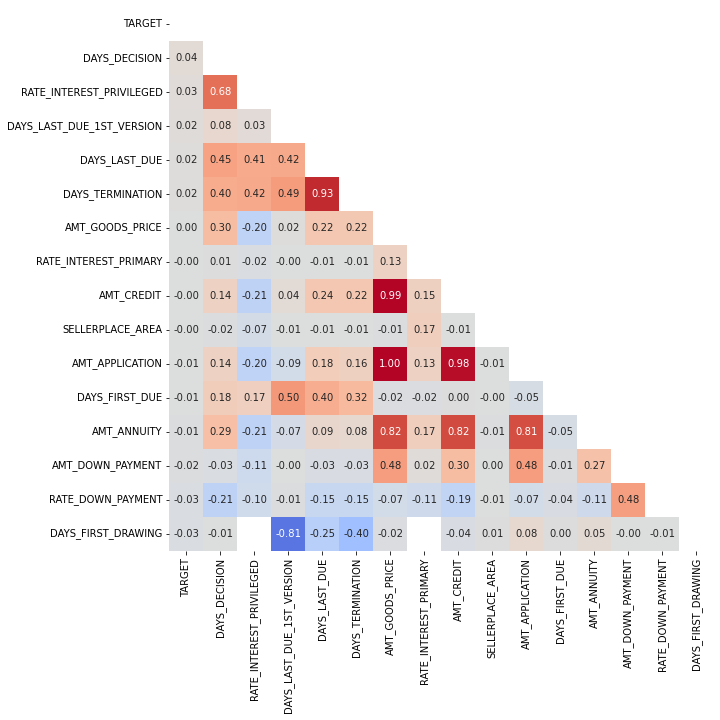

In [73]:
mask = np.zeros_like(corr_float)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(10, 10))
sns.heatmap(
    corr_float,
    mask=mask,
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.2f',
    annot=True,
    cbar=False
);

## Data cleaning

### Day features

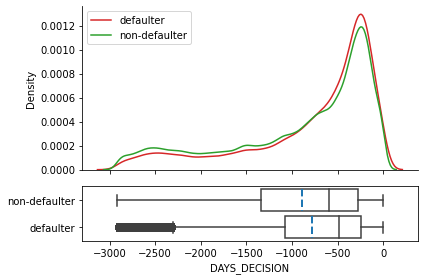

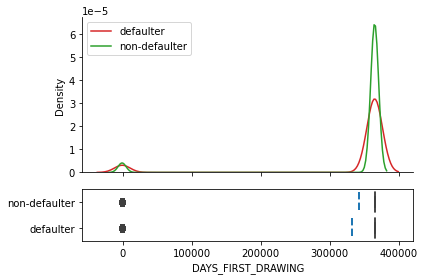

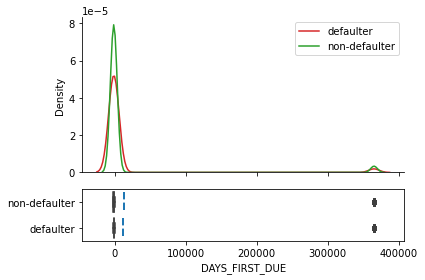

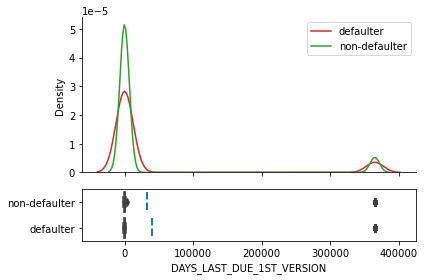

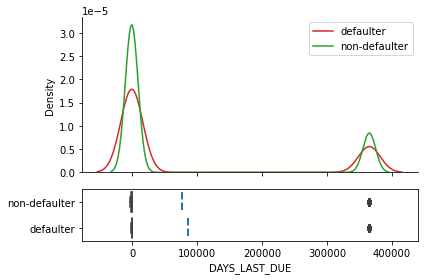

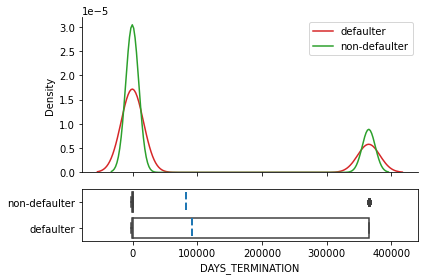

In [43]:
for feat in (x for x in previous_application_target.columns if 'DAYS' in x):
  plot_train_density_with_central_tendencies_by_target(previous_application_target, feat)

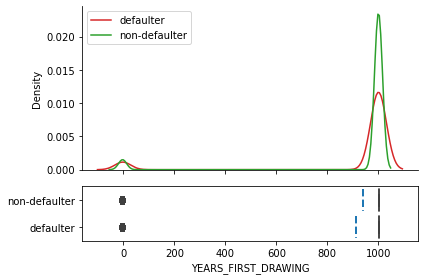

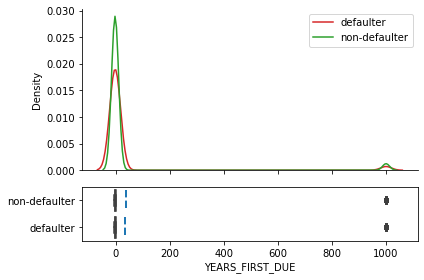

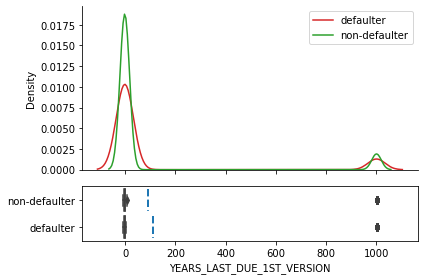

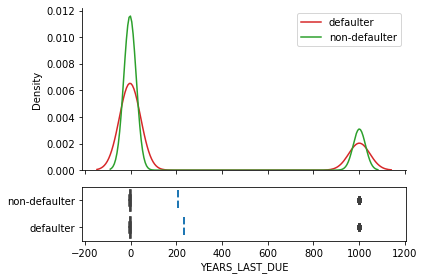

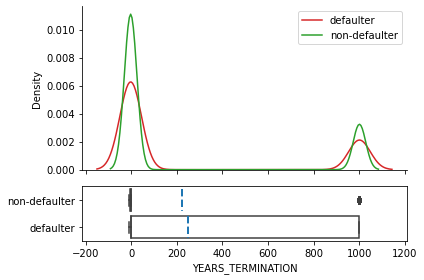

In [45]:
previous_application_target['YEARS_FIRST_DRAWING'] = previous_application_target['DAYS_FIRST_DRAWING'].div(365)
previous_application_target['YEARS_FIRST_DUE'] = previous_application_target['DAYS_FIRST_DUE'].div(365)
previous_application_target['YEARS_LAST_DUE_1ST_VERSION'] = previous_application_target['DAYS_LAST_DUE_1ST_VERSION'].div(365)
previous_application_target['YEARS_LAST_DUE'] = previous_application_target['DAYS_LAST_DUE'].div(365)
previous_application_target['YEARS_TERMINATION'] = previous_application_target['DAYS_TERMINATION'].div(365)

plot_train_density_with_central_tendencies_by_target(previous_application_target, 'YEARS_FIRST_DRAWING')
plot_train_density_with_central_tendencies_by_target(previous_application_target, 'YEARS_FIRST_DUE')
plot_train_density_with_central_tendencies_by_target(previous_application_target, 'YEARS_LAST_DUE_1ST_VERSION')
plot_train_density_with_central_tendencies_by_target(previous_application_target, 'YEARS_LAST_DUE')
plot_train_density_with_central_tendencies_by_target(previous_application_target, 'YEARS_TERMINATION')

In [57]:
previous_application_target['DAYS_FIRST_DRAWING'].describe()

count    852595.000000
mean     342257.656710
std       88832.266598
min       -2922.000000
25%      365243.000000
50%      365243.000000
75%      365243.000000
max      365243.000000
Name: DAYS_FIRST_DRAWING, dtype: float64

In [65]:
previous_application_target[previous_application_target['DAYS_FIRST_DRAWING'].ge(365243)]['DAYS_FIRST_DRAWING'].nunique()

1

In [58]:
previous_application_target['DAYS_FIRST_DUE'].describe()

count    852595.000000
mean      13488.741567
std       71650.147146
min       -2892.000000
25%       -1630.000000
50%        -825.000000
75%        -408.000000
max      365243.000000
Name: DAYS_FIRST_DUE, dtype: float64

In [66]:
previous_application_target[previous_application_target['DAYS_FIRST_DUE'].ge(365243)]['DAYS_FIRST_DUE'].nunique()

1

In [59]:
previous_application_target['DAYS_LAST_DUE_1ST_VERSION'].describe()

count    852595.000000
mean      33274.831806
std      106161.775933
min       -2801.000000
25%       -1244.000000
50%        -358.000000
75%         135.000000
max      365243.000000
Name: DAYS_LAST_DUE_1ST_VERSION, dtype: float64

In [68]:
previous_application_target[previous_application_target['DAYS_LAST_DUE_1ST_VERSION'].ge(365243)]['DAYS_LAST_DUE_1ST_VERSION'].nunique()

1

In [61]:
previous_application_target['DAYS_LAST_DUE'].describe()

count    852595.000000
mean      76665.634755
std      149704.716371
min       -2889.000000
25%       -1316.000000
50%        -534.000000
75%         -73.000000
max      365243.000000
Name: DAYS_LAST_DUE, dtype: float64

In [62]:
previous_application_target[previous_application_target['DAYS_LAST_DUE'].ge(365243)]['DAYS_LAST_DUE'].nunique()

1

In [63]:
previous_application_target['DAYS_TERMINATION'].describe()

count    852595.000000
mean      82353.171672
std      153537.064274
min       -2874.000000
25%       -1269.000000
50%        -494.000000
75%         -42.000000
max      365243.000000
Name: DAYS_TERMINATION, dtype: float64

In [69]:
previous_application_target[previous_application_target['DAYS_TERMINATION'].ge(365243)]['DAYS_TERMINATION'].nunique()

1

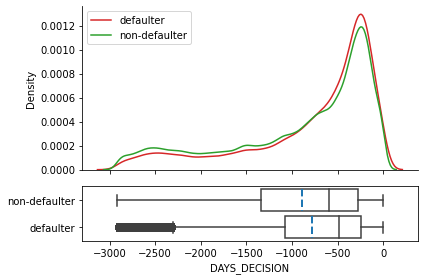

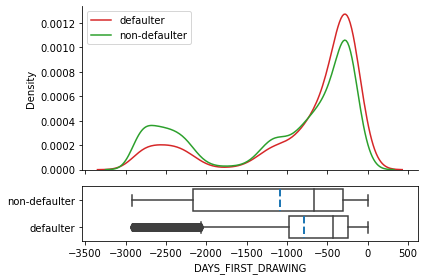

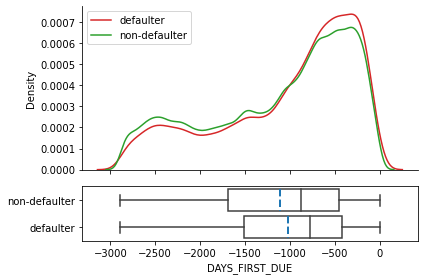

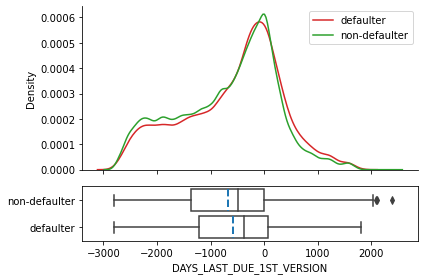

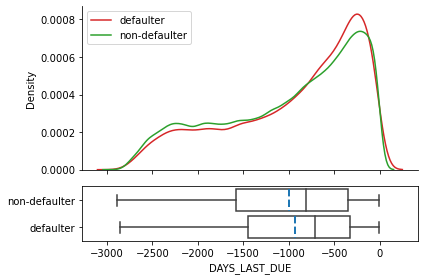

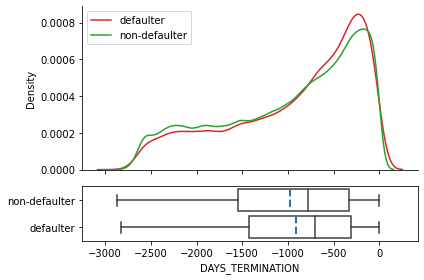

In [70]:
# Erase faulty values in the original table
previous_application['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace=True)
previous_application['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace=True)
previous_application['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace=True)
previous_application['DAYS_LAST_DUE'].replace(365243, np.nan, inplace=True)
previous_application['DAYS_TERMINATION'].replace(365243, np.nan, inplace=True)

# Erase faulty values in the merged table
previous_application_target['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace=True)
previous_application_target['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace=True)
previous_application_target['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace=True)
previous_application_target['DAYS_LAST_DUE'].replace(365243, np.nan, inplace=True)
previous_application_target['DAYS_TERMINATION'].replace(365243, np.nan, inplace=True)

for feat in (x for x in previous_application_target.columns if 'DAYS' in x):  
  plot_train_density_with_central_tendencies_by_target(previous_application_target, feat)

In [71]:
del previous_application, previous_application_target
gc.collect()

41005

# Sample submission

## Data import

In [74]:
sample_submission = reduce_memory_usage(
    pd.read_csv(
        'data/sample_submission.csv'
    ),
    verbose=True
)

Initial memory usage of the dataframe: 0.74 MB
Final memory usage, after optimization: 0.28 MB
Decreased by 62.49%


## Data overview

In [75]:
sample_submission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   SK_ID_CURR  48744 non-null  int32  
 1   TARGET      48744 non-null  float16
dtypes: float16(1), int32(1)
memory usage: 285.7 KB


In [76]:
sample_submission.head()

,SK_ID_CURR,TARGET
0,100001,0.5
1,100005,0.5
2,100013,0.5
3,100028,0.5
4,100038,0.5


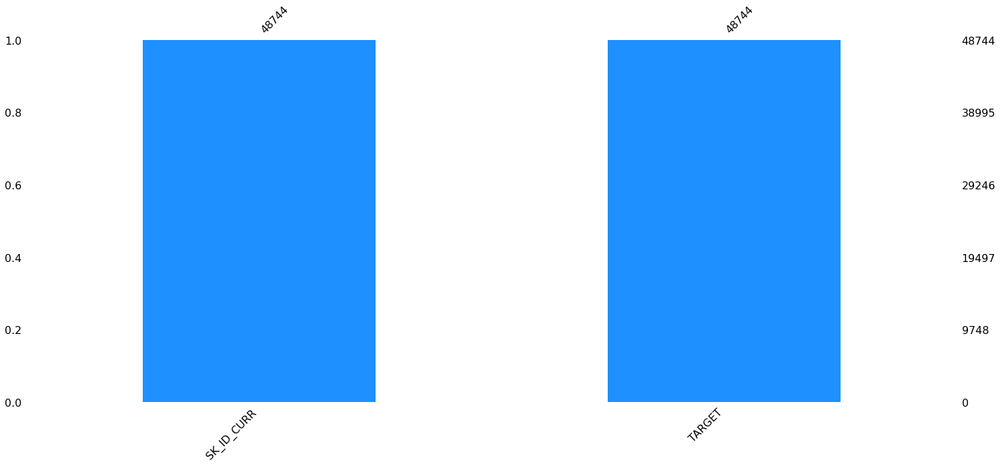

In [77]:
msno.bar(sample_submission, color='dodgerblue');

In [78]:
sample_submission['TARGET'].nunique()

1

In [79]:
del sample_submission
gc.collect()

40602

# POS CASH balance

## Data import

In [91]:
POS_CASH_balance = reduce_memory_usage(
    pd.read_csv(
        'data/POS_CASH_balance.csv'
    ).drop(columns='SK_ID_PREV'), # The previous credit identifier won't be used
    floating=False,
    verbose=True
)

Initial memory usage of the dataframe: 534.13 MB
Final memory usage, after optimization: 314.76 MB
Decreased by 41.07%


## Data overview

In [92]:
POS_CASH_balance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 7 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_CURR             int32  
 1   MONTHS_BALANCE         int8   
 2   CNT_INSTALMENT         float64
 3   CNT_INSTALMENT_FUTURE  float64
 4   NAME_CONTRACT_STATUS   object 
 5   SK_DPD                 int16  
 6   SK_DPD_DEF             int16  
dtypes: float64(2), int16(2), int32(1), int8(1), object(1)
memory usage: 314.8+ MB


In [93]:
POS_CASH_balance.head()

,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,182943,-31,48.0,45.0,Active,0,0
1,367990,-33,36.0,35.0,Active,0,0
2,397406,-32,12.0,9.0,Active,0,0
3,269225,-35,48.0,42.0,Active,0,0
4,334279,-35,36.0,35.0,Active,0,0


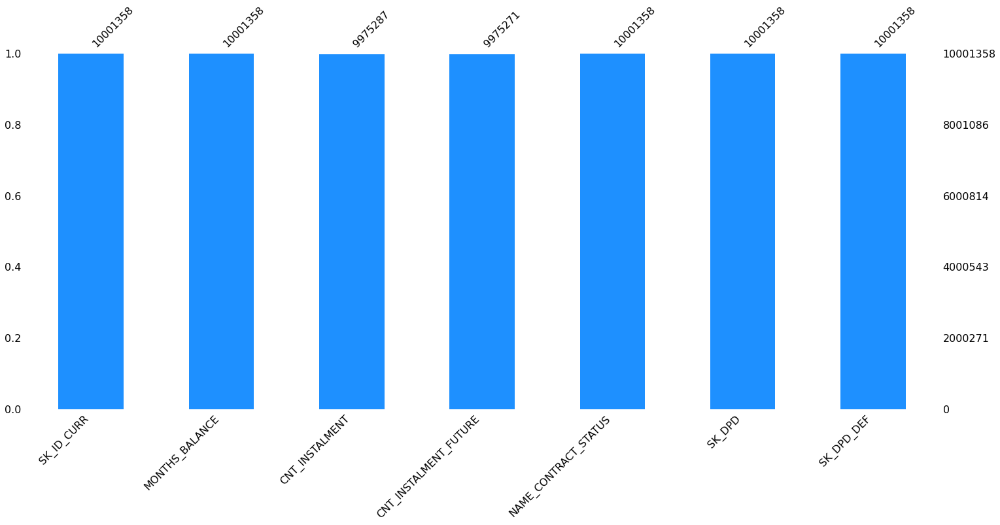

In [94]:
msno.bar(POS_CASH_balance, color='dodgerblue');

## Identifiers

In [86]:
# If some loan indices are counted more than once, aggregation for the table would be required
POS_CASH_balance['SK_ID_CURR'].value_counts()

265042    295
172612    247
309133    246
127659    245
185185    245
         ... 
406557      1
240277      1
177557      1
251697      1
144536      1
Name: SK_ID_CURR, Length: 337252, dtype: int64

## Feature types

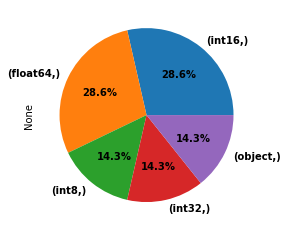

In [88]:
POS_CASH_balance.dtypes.value_counts().plot.pie(
    autopct='%.1f%%',
    textprops=dict(weight='bold')
);

## Merging with the target feature

In [89]:
POS_CASH_balance_target = application_train[['SK_ID_CURR', 'TARGET']].merge(
    POS_CASH_balance,
    on='SK_ID_CURR',
    how='left'
)

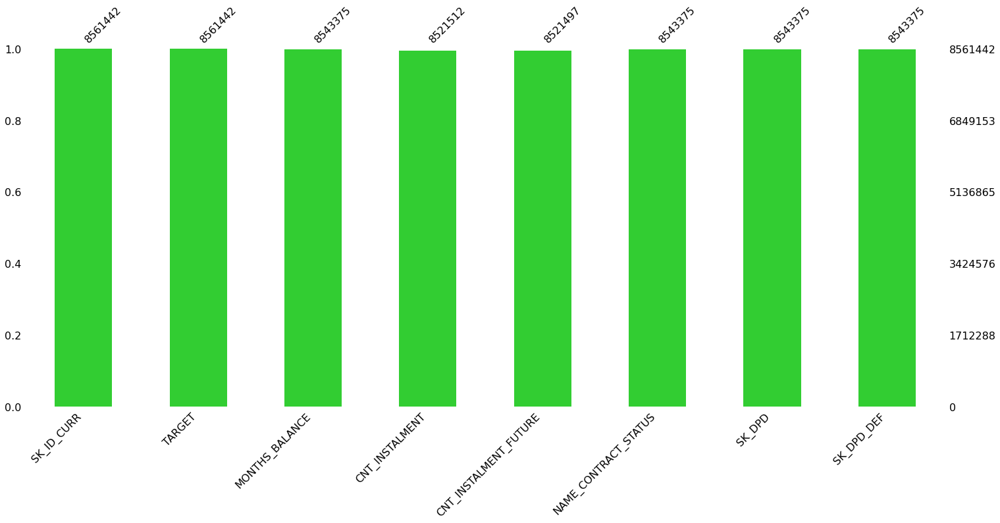

In [90]:
msno.bar(POS_CASH_balance_target, color='limegreen');

## Feature analysis

### Type conversion

In [95]:
for feat in (x for x in POS_CASH_balance.columns if 'CNT' in x):
  print(POS_CASH_balance_target[feat].dtype)
  print(POS_CASH_balance_target[feat].isna().sum())

float64
39930
float64
39945


In [96]:
# Convert the following feature into a variable of the nullable integer type
for feat in (x for x in POS_CASH_balance.columns if 'CNT' in x):
  POS_CASH_balance_target[feat] = POS_CASH_balance_target[feat].astype('Int64')

### Categorical features

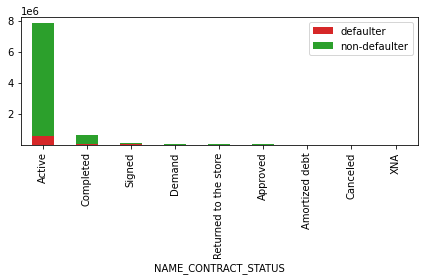

                       defaulter  non-defaulter      total
NAME_CONTRACT_STATUS                                      
Active                  574068.0        7244509  7818577.0
Completed                46952.0         587920   634872.0
Signed                    5837.0          68788    74625.0
Demand                     811.0           5299     6110.0
Returned to the store      472.0           4119     4591.0
Approved                   319.0           3902     4221.0
Amortized debt             125.0            240      365.0
Canceled                     2.0             10       12.0
XNA                          0.0              2        2.0


In [97]:
plot_train_bars_by_target(POS_CASH_balance_target, 'NAME_CONTRACT_STATUS')

### Discrete features

In [98]:
POS_CASH_balance_target.select_dtypes('integer').columns.tolist()

['SK_ID_CURR', 'TARGET', 'CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE']

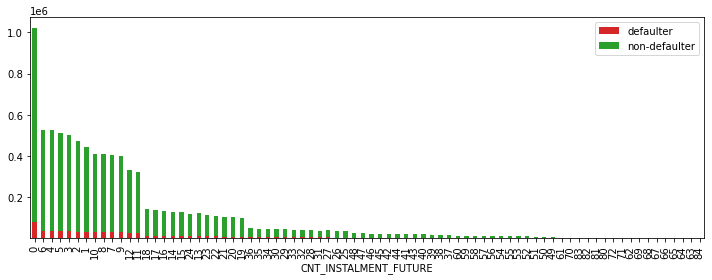

                       defaulter  non-defaulter      total
CNT_INSTALMENT_FUTURE                                     
0                        77144.0         944790  1021934.0
6                        36616.0         488277   524893.0
4                        36068.0         489505   525573.0
5                        35614.0         477849   513463.0
3                        34155.0         464870   499025.0
...                          ...            ...        ...
66                           0.0             26       26.0
65                           0.0             23       23.0
64                           0.0             22       22.0
63                           0.0             22       22.0
84                           0.0              1        1.0

[78 rows x 3 columns]


In [99]:
for feat in POS_CASH_balance_target.select_dtypes('integer').columns[3:]:
  plot_train_bars_by_target(POS_CASH_balance_target, feat)

### Continuous features, or very numerous discrete ones with large values

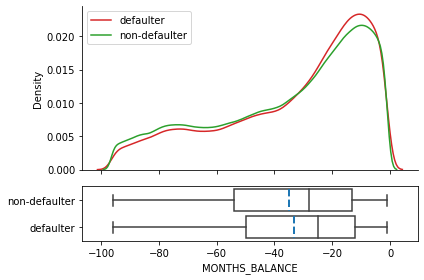

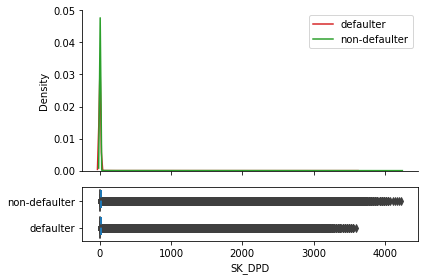

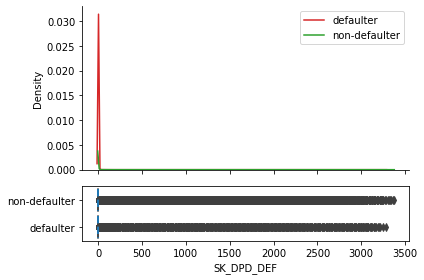

In [79]:
for feat in POS_CASH_balance_target.select_dtypes('floating').columns:  
  plot_train_density_with_central_tendencies_by_target(POS_CASH_balance_target, feat)

### Correlations

#### $\phi_K$ correlation

 ##### Between the target and the categorical features

interval columns not set, guessing: ['TARGET']


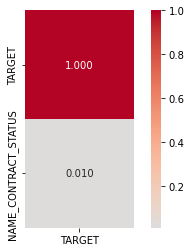

In [101]:
phik_matrix_cat = POS_CASH_balance_target[
    ['TARGET', 'NAME_CONTRACT_STATUS']].phik_matrix()
idx = phik_matrix_cat.sort_values(by='TARGET', ascending=False).index
phik_matrix_cat = phik_matrix_cat.loc[idx, idx]

sns.heatmap(
    phik_matrix_cat['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.3f',
    annot=True
);

In [102]:
phik_matrix_cat['TARGET'].to_frame().head().mul(100)[1:]

,TARGET
NAME_CONTRACT_STATUS,0.956594


#### Correlations between the target and the discrete features

##### $\phi_K$ correlation

interval columns not set, guessing: ['TARGET', 'CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE']


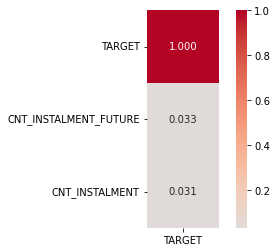

In [104]:
phik_matrix_int = POS_CASH_balance_target[
    ['TARGET', 'CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE']].phik_matrix()
idx = phik_matrix_int.sort_values(by='TARGET', ascending=False).index
phik_matrix_int = phik_matrix_int.loc[idx, idx]

sns.heatmap(
    phik_matrix_int['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.3f',
    annot=True
);

In [105]:
phik_matrix_int['TARGET'].to_frame().head().mul(100)[1:]

,TARGET
CNT_INSTALMENT_FUTURE,3.319407
CNT_INSTALMENT,3.094744


##### Pearson correlation

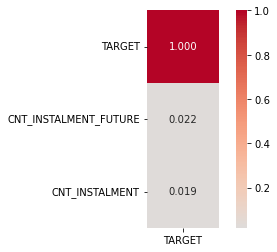

In [106]:
corr_int = POS_CASH_balance_target[
    ['TARGET', 'CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE']].corr()
idx = corr_int.sort_values(by='TARGET', ascending=False).index
corr_int = corr_int.loc[idx, idx]

sns.heatmap(
    corr_int['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.3f',
    annot=True
);

In [107]:
corr_int['TARGET'].head().mul(100).to_frame()[1:]

,TARGET
CNT_INSTALMENT_FUTURE,2.197241
CNT_INSTALMENT,1.850611


#### Correlation between the target and the continuous features

##### $\phi_K$ correlation

env: JOBLIB_TEMP_FOLDER=/tmp
interval columns not set, guessing: ['TARGET', 'MONTHS_BALANCE', 'SK_DPD', 'SK_DPD_DEF']


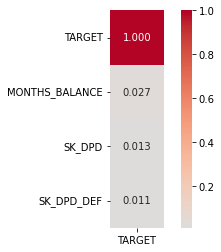

In [108]:
%env JOBLIB_TEMP_FOLDER = /tmp
phik_matrix_float = POS_CASH_balance_target[
    ['TARGET'] + POS_CASH_balance_target.select_dtypes('floating').columns.tolist()].phik_matrix()
idx = phik_matrix_float.sort_values(by='TARGET', ascending=False).index
phik_matrix_float = phik_matrix_float.loc[idx, idx]

sns.heatmap(
    phik_matrix_float['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.3f',
    annot=True
);

In [109]:
phik_matrix_float['TARGET'].to_frame().head().mul(100)[1:]

,TARGET
MONTHS_BALANCE,2.739143
SK_DPD,1.277335
SK_DPD_DEF,1.053897


##### Pearson correlation

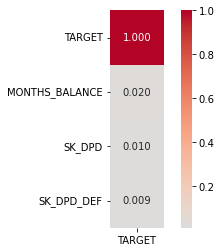

In [110]:
corr_float = POS_CASH_balance_target[
    ['TARGET'] + POS_CASH_balance_target.select_dtypes('floating').columns.tolist()].corr()
idx = corr_float.sort_values(by='TARGET', ascending=False).index
corr_float = corr_float.loc[idx, idx]

sns.heatmap(
    corr_float['TARGET'].to_frame(),
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.3f',
    annot=True
);

In [111]:
corr_float['TARGET'].nlargest().mul(100).to_frame()[1:]

,TARGET
MONTHS_BALANCE,2.014653
SK_DPD,0.986631
SK_DPD_DEF,0.859436


#### Correlations between the continuous features themselves

##### $\phi_K$ correlation

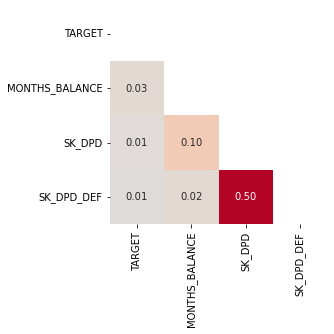

In [112]:
mask = np.zeros_like(phik_matrix_float)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(
    phik_matrix_float,
    mask=mask,
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.2f',
    annot=True,
    cbar=False
);

##### Pearson correlation

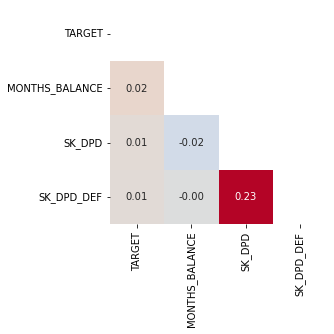

In [113]:
mask = np.zeros_like(corr_float)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(
    corr_float,
    mask=mask,
    cmap='coolwarm',
    square=True,
    center=0,
    fmt='.2f',
    annot=True,
    cbar=False
);

In [114]:
del POS_CASH_balance, POS_CASH_balance_target
gc.collect()

46842

In [ ]:
# regression logistique - classification binaire
# SVM - beaucoup de variables
# création de features - mix des meilleurs
# étapes étanges
# extraire fonction de prédiction
# exposée sous forme d'API
# dashboard : calculer la prédiction au sein du API
# feature engineering validé pour décembre
# X y - analiser variable cible
# 90 % de zéros, 10 % d'uns
# accuracy 90 %
# problème de unbalanced classes - onglet ressources
# fénomènes rares - spam, maladies rares...